<div class="usecase-title">EcoMetrix: Urban Environmental Insight System, explores various environmental datasets from the City of Melbourne, including soil sensor readings, soil sensor locations, microclimate sensor readings, and Microlabs CO2 sensor data.</div>

<div class="usecase-authors"><b>Authored by: </b>Te' Claire</div>

<div class="usecase-date"><b>Date: </b> March-July 2024</div>

<div class="usecase-duration"><b>Duration:</b> 90 mins</div>

<div class="usecase-level-skill">
    <div class="usecase-level"><b> Level: </b>Intermediate</div>
    <div class="usecase-skill"><b> Pre-requisite Skills: </b>Python, basic machine learning, <i>Optional</i> Google Collaborate access</div>
</div>

<div class="usecase-subsection-blurb">
  <i>Dataset 1:</i> soil-sensor-readings-historical-data
  <br>
  <a href="https://data.melbourne.vic.gov.au/explore/dataset/soil-sensor-readings-historical-data/information/" target="_blank">Dataset Link</a>
  <br>
</div>
<br>

<div class="usecase-subsection-blurb">
  <i>Dataset 2:</i> soil-sensor-locations
  <br>
  <a href="https://data.melbourne.vic.gov.au/explore/dataset/soil-sensor-locations/information/" target="_blank">Dataset Link</a>
  <br>
</div>
<br>

<div class="usecase-subsection-blurb">
  <i>Dataset 3:</i> microclimate-sensor-readings
  <br>
  <a href="https://data.melbourne.vic.gov.au/explore/dataset/microclimate-sensor-readings/information/" target="_blank">Dataset Link</a>
  <br>
</div>
<br>

<div class="usecase-subsection-blurb">
  <i>Dataset 4:</i> microlabs-co2-sensor-data
  <br>
  <a href="https://data.melbourne.vic.gov.au/explore/dataset/microlabs-co2-sensor-data/information/?sort=time&location=16,-37.8191,144.9698&basemap=mbs-7a7333/" target="_blank">Dataset Link</a>
  <br>
</div>
<br>

<div class="usecase-subsection-blurb">
  <i>Dataset 5:</i> microclimate-sensor-locations
  <br>
  <a href="https://melbournetestbed.opendatasoft.com/explore/dataset/microclimate-sensor-locations/information/" target="_blank">Dataset Link</a>
  <br>
</div>

# <div class="usecase-section-header"><h4>Project Objective, Overview & Research</h4></div>

##### Context:
##### Australia's climate has increased in temperature since 1910 [1], we can use environmental sensor data (soil, Co2 and temperature, ambient air quality to predict impacts on the rate of population growth, economic growth and technological change. Science Matters (2022) '...spatially comprehensive map[ing] of precipitation for the entire Australian continent is crucial for research and policy making in the face of changing climate extremes and variability'[2].

<br>

##### Eco-Metrix: Urban Environmental Insight System, explores various environmental datasets from the City of Melbourne. A unique opportunity to work with datasets containing a limited number of records, correlated with larger datasets (2 million records) within a 2km radius of samples, to create a strong use case for predictive analyses (linear regression) modelling based on time series [4], [5], [6].

##### Objective: The goal is to integrate these datasets to monitor, analyse, and predict environmental conditions in a specific geolocation, aiding in city planning and public safety. The datasets use various metrics, such as soil moisture, temperature, salinity, ambient air quality, and CO2 levels, crucial for understanding and managing the city's environmental health. *Known previously as Soil analyses*.

<br>

##### User Stories:
* As a city planner, I need to monitor environmental sensor data to quickly identify and respond to hazardous conditions, ensuring public safety.

* As a resident of the city, I am interested in real-time environmental conditions around me, especially air quality and green space health, to plan my outdoor activities.





##### Deliverables:

1. Data Preprocessing:
- Combine datasets that can be combined to identify (data from sensors).
- Clean (normalise) the data.

2. Integrated Data Dashboard: Create a dashboard displaying data from all sensors, including soil conditions, microclimate, and CO2 levels. Visualizations include maps, charts, and graphs.

3. Predictive Analytics Model: Develop a model to predict environmental conditions and alert for anomalies or hazardous conditions based on historical and current sensor data.

4. Data Quality Report: Generate a report detailing data completeness, accuracy, and anomalies across datasets, highlighting any gaps or inconsistencies.

5. Documentation: Detailed guide on accessing, filtering, and interpreting the data, including how to use the API to download specific sensor readings.

<br>

##### References:
[1] NSW and Australian Regional Climate Modelling (NARCliM) project, 2024,https://www.climatechange.environment.nsw.gov.au/evidence-climate-change/australian-climate-change-observations

[2] Science Matters (2022), University of Melbourne, https://pursuit.unimelb.edu.au/articles/the-satellite-data-mapping-australia-s-new-climate-extremes

[3] S.Kumar, 2022, Towards Data Science,https://towardsdatascience.com/4-techniques-to-handle-missing-values-in-time-series-data-c3568589b5a8

[4] N. Rogge, 2022, Hugging Face,https://huggingface.co/blog/time-series-transformers

##### Part 1 Data Preprocessing:
- Combine datasets to identify (data from sensors).
- Clean (normalise) the data.

<br>

##### Part 2 Integrated Data Dashboard: Create a dashboard displaying data from all sensors, including soil conditions, microclimate, and CO2 levels. Visualizations include maps, charts, and graphs.

<br>

##### Part 3 Predictive Analytics Model: Develop a model to predict environmental conditions and alert for anomalies or hazardous conditions based on historical and current sensor data.

<br>

##### Part 4 Data Quality Report: Conclusion and information on results/ interpreting data.

# Set Up

In [ ]:
# Dependencies
import warnings
import pandas as pd
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)

import requests
import numpy as np
from io import StringIO

In [ ]:
# Optional code
###########################################################
# Show max width of columns in Google Collab ->
# pd.set_option('display.max_colwidth', None)
###########################################################
# Show min width of columns in Google Collab ->
pd.reset_option('display.max_colwidth')
###########################################################

In [ ]:
!pip install tqdm # Progress bar
!pip install osmnx

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.4/107.4 kB 2.3 MB/s eta 0:00:00


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

import osmnx as ox
import geopandas as gpd
import re
import networkx as nx

import folium
from folium import plugins
from folium.plugins import HeatMap
from geopy.geocoders import Nominatim

from tqdm.auto import tqdm
import ipywidgets as widgets
from ipywidgets import interact
from matplotlib.ticker import MaxNLocator
from IPython.display import display

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from scipy.spatial import cKDTree
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [ ]:
# API Key
from google.colab import drive
drive.mount('/content/drive')
with open('/content/drive/My Drive/SIT378/h.txt', 'r') as file:
    api_key = file.read().strip()

import os
api_key = os.getenv(api_key)

Mounted at /content/drive


In [ ]:
# Define the company colors
color_d = ['#08af64', '#14a38e', '#0f9295', '#056b8a', '#121212'] #Dark theme
color_l = ['#2af598', '#22e4ac', '#1bd7bb', '#14c9cb', '#0fbed8', '#08b3e5'] #Light theme

## A. Download datasets (or skip to B. if already downloaded)

###### Loaded `datasets` into dictionary:
- historical_soil_sensor = datasets['soil-sensor-readings-historical-data']
- soil_sensor_locations = datasets['soil-sensor-locations']
- microclimate_sensor_readings = datasets['microclimate-sensor-readings']
- microlabs_co2_sensor_data = datasets['microlabs-co2-sensor-data']

In [ ]:
# Download datasets
def download_dataset(api_key, dataset_id, base_url='https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'):
    format = 'csv'
    url = f'{base_url}{dataset_id}/exports/{format}'
    params = {
        'select': '*',
        'limit': -1,  # all records
        'lang': 'en',
        'timezone': 'UTC',
        'api_key': api_key
    }

    with requests.get(url, params=params, stream=True) as response:
        if response.status_code == 200:
            total_size = int(response.headers.get('content-length', 0))
            chunk_size = 1024  # 1KB per chunk
            progress_bar = tqdm(total=total_size, unit='iB', unit_scale=True, desc=f"Downloading {dataset_id}")

            content = bytearray()
            for chunk in response.iter_content(chunk_size=chunk_size):
                if chunk:  # filter out keep-alive new chunks
                    content.extend(chunk)
                    progress_bar.update(len(chunk))

            progress_bar.close()
            data = pd.read_csv(StringIO(content.decode('utf-8')), delimiter=';')
            return data
        else:
            print(f'Request failed with status code {response.status_code}')
            return None

# Dataset IDs
dataset_ids = [
    'microclimate-sensor-locations',
    'soil-sensor-readings-historical-data',
    'soil-sensor-locations',
    'microclimate-sensor-readings',
    'microlabs-co2-sensor-data'
]

# Initialize dictionary to hold the datasets
datasets = {}

# Download each dataset with a progress bar
for dataset_id in dataset_ids:
    datasets[dataset_id] = download_dataset(api_key, dataset_id)
    if datasets[dataset_id] is not None:
        print(f"{dataset_id} downloaded successfully.")


microclimate-sensor-locations downloaded successfully.


soil-sensor-readings-historical-data downloaded successfully.


soil-sensor-locations downloaded successfully.


microclimate-sensor-readings downloaded successfully.


microlabs-co2-sensor-data downloaded successfully.


###### View Dataset
- Sample records

In [ ]:
# soil sensor readings historical data
print(datasets['soil-sensor-readings-historical-data'].head())

                  local_time            site_name  site_id        id  \
0  2023-12-12T11:00:00+00:00  Princes Park Lawn 5    64993  20008264   
1  2023-12-12T10:15:00+00:00              Block 2   193854  20008441   
2  2023-12-12T10:30:00+00:00              Block 2   193854  20008455   
3  2023-12-12T11:30:00+00:00              Block 2   193854  20008550   
4  2023-12-12T13:00:00+00:00  Princes Park Lawn 5    64993  20008650   

   probe_id          probe_measure  soil_value  unit json_featuretype  
0   1303872  Soil Moisture 70cm #0       58.72  %VWC           Output  
1   2442542         #6 Temperature       24.70    ºC           Output  
2   2442542         #6 Temperature       24.70    ºC           Output  
3   2442542         #6 Temperature       24.60    ºC           Output  
4   1303872  Soil Moisture 70cm #0       58.76  %VWC           Output  


In [ ]:
# soil sensor locations
print(datasets['soil-sensor-locations'].head())

   site_id                        site_name    property_name   latitude  \
0    51267         Fitzroy East Water Meter  Fitzroy Gardens -37.810691   
1    51268         Fitzroy West Water Meter  Fitzroy Gardens -37.810532   
2    51809  Melbourne (Olympic Park) BOM WS     Olympic Park -37.825573   
3    64970              Princes Park Oval 2     Princes Park -37.786400   
4    64975                   McAlister Oval       Royal Park -37.778805   

    longitude                                location  
0  144.981780  -37.81069103239338, 144.98178015514114  
1  144.979830  -37.81053171390928, 144.97983004297106  
2  144.981587  -37.82557277749247, 144.98158738017247  
3  144.962590   -37.78639999998354, 144.9625900000018  
4  144.956444  -37.77880526150242, 144.95644368244822  


In [ ]:
# microclimate sensor readings
print(datasets['microclimate-sensor-readings'].head())

                  local_time       id  site_id sensor_id    value  \
0  2023-11-29T22:15:02+00:00  8110553     1011        5b    74.38   
1  2023-11-29T22:15:02+00:00  8110558     1011        5c  1010.80   
2  2023-11-29T22:15:03+00:00  8110562     1011         6     0.00   
3  2023-11-29T22:15:04+00:00  8110606     1012         6     0.00   
4  2023-11-29T22:15:11+00:00  8110489     1009        0a     5.30   

           type   units gatewayhub_id site_status  
0        TPH.RH       %       arc1055           C  
1  TPH.PRESSURE     hPa       arc1055           C  
2            WS    km/h       arc1055           C  
3            WS    km/h       arc1048           C  
4         PM2.5  ug/m^3       arc1050           C  


In [ ]:
# microlabs CO2 sensor data
print(datasets['microlabs-co2-sensor-data'].head())

         dev_id sensor_name                       time  temperature  humidity  \
0  ers-co2-9da0     ERS CO2  2022-05-04T01:40:25+00:00         20.9        47   
1  ers-co2-9da0         NaN  2022-05-04T01:33:25+00:00         20.9        47   
2  ers-co2-9da0         NaN  2022-05-04T01:34:35+00:00         20.9        47   
3  ers-co2-9da0         NaN  2022-05-04T01:31:05+00:00         20.9        47   
4  ers-co2-9da0     ERS CO2  2022-05-04T08:25:14+00:00         20.8        46   

   light  motion  visit   vdd                  lat_long    co2  
0  441.0       0      0  3601  -37.8133183, 144.9668853  507.0  
1  505.0       0      0  3599                       NaN  525.0  
2  528.0       0      0  3601                       NaN  527.0  
3  441.0       0      0  3596                       NaN  535.0  
4   90.0       0      0  3596  -37.8133183, 144.9668853  495.0  


In [ ]:
# microclimate-sensor-locations
print(datasets['microclimate-sensor-locations'].head())

   site_id gatewayhub_id site_status  last_data_local start_reading  \
0     1004       arc1048           R              NaN    2019-11-15   
1     1006       arc1112           R              NaN    2021-05-20   
2     1011       arc1055           C              NaN    2021-07-07   
3     1008       arc1045           R              NaN    2021-06-14   
4     1016       arc1049           C              NaN    2021-09-17   

  end_reading   latitude   longitude                    location  
0  2021-06-13 -37.800575  144.964635      -37.800575, 144.964635  
1  2021-06-28 -37.822486  144.952065      -37.822486, 144.952065  
2         NaN -37.822222  144.952222      -37.822222, 144.952222  
3  2021-06-20 -37.817465  144.967057  -37.81746522, 144.96705703  
4         NaN -37.812778  144.960556      -37.812778, 144.960556  


In [ ]:
# soil sensor readings historical data
print(datasets['microclimate-sensor-locations'].head())

In [ ]:
# View number of records
for dataset_id, df in datasets.items():
    if df is not None:
        num_records = df.shape[0]  # number of rows
        print(f"{dataset_id} has {num_records} records.")

microclimate-sensor-locations has 16 records.


###### Save datasets locally or on drive
- Save each dataset as a .CSV file in local file system (Google Collab) :


In [ ]:
base_path = '/content/drive/My Drive/sit378_eco_metrix/'

for dataset_id, df in datasets.items():
    if df is not None:
        filename = f"{base_path}{dataset_id}.csv"
        df.to_csv(filename, index=False)
        print(f"Saved {filename} to Google Drive.")

Saved /content/drive/My Drive/sit378_eco_metrix/microclimate-sensor-locations.csv to Google Drive.


## B. Load datasets (if not downloaded)
- Load each dataset as .CSV file in local file system (Google Collab)

In [ ]:
base_path = '/content/drive/My Drive/sit378_eco_metrix/'
datasets = {} # Dictionary

# Filenames
dataset_filenames = {
    'soil-sensor-readings-historical-data': 'soil-sensor-readings-historical-data.csv',
    'soil-sensor-locations': 'soil-sensor-locations.csv',
    'microclimate-sensor-readings': 'microclimate-sensor-readings.csv',
    'microlabs-co2-sensor-data': 'microlabs-co2-sensor-data.csv',
    'microclimate-sensor-locations': 'microclimate-sensor-locations.csv'
}

# Load each dataset into the datasets dictionary
for dataset_id, filename in dataset_filenames.items():
    full_path = f"{base_path}{filename}"
    datasets[dataset_id] = pd.read_csv(full_path)
    print(f"Loaded {dataset_id} with {datasets[dataset_id].shape[0]} records.")

Loaded soil-sensor-readings-historical-data with 2400683 records.
Loaded soil-sensor-locations with 90 records.
Loaded microclimate-sensor-readings with 56 records.
Loaded microlabs-co2-sensor-data with 207523 records.
Loaded microclimate-sensor-locations with 16 records.


## Part 1 Data Preprocessing:
- Convert to datatime
- Combine datasets to identify ('site_id' check merge)
- Clean (normalise) the data.

In [ ]:
# Convert 'local_time' and 'time' to datetime
datasets['microclimate-sensor-readings']['local_time'] = pd.to_datetime(datasets['microclimate-sensor-readings']['local_time'])
datasets['soil-sensor-readings-historical-data']['local_time'] = pd.to_datetime(datasets['soil-sensor-readings-historical-data']['local_time'])
datasets['microlabs-co2-sensor-data']['time'] = pd.to_datetime(datasets['microlabs-co2-sensor-data']['time'])
datasets['microclimate-sensor-locations']['start_reading'] = pd.to_datetime(datasets['microclimate-sensor-locations']['start_reading'])

# 'site_id' Check merge
print(datasets['soil-sensor-readings-historical-data']['site_id'].nunique()) # Total records 2400683
print(datasets['soil-sensor-locations']['site_id'].nunique()) # Total records 90
print(datasets['microclimate-sensor-readings']['site_id'].nunique()) # Total records 56
print(datasets['microclimate-sensor-locations']['site_id'].nunique()) # Total records 16

73
90
3
16


In [ ]:
# Merge operation
soil_sensor_data= pd.merge(datasets['soil-sensor-readings-historical-data'],
                         datasets['soil-sensor-locations'],
                         on='site_id',
                         how='inner')

print(soil_sensor_data.info())

# dataframes
microlabs_co2_sensor_data = datasets['microlabs-co2-sensor-data']
microclimate_sensor_readings = datasets['microclimate-sensor-readings']
microclimate_sensor_locations = datasets['microclimate-sensor-locations']

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2400683 entries, 0 to 2400682
Data columns (total 14 columns):
 #   Column            Dtype              
---  ------            -----              
 0   local_time        datetime64[ns, UTC]
 1   site_name_x       object             
 2   site_id           int64              
 3   id                int64              
 4   probe_id          int64              
 5   probe_measure     object             
 6   soil_value        float64            
 7   unit              object             
 8   json_featuretype  object             
 9   site_name_y       object             
 10  property_name     object             
 11  latitude          float64            
 12  longitude         float64            
 13  location          object             
dtypes: datetime64[ns, UTC](1), float64(3), int64(3), object(7)
memory usage: 256.4+ MB
None


# 1. Data Preprocessing:
- Address missing values
- Check data types
- Locate/ fix dataset-specific issues
- Combine data sets for analysis (Step 2)

<br>

##### *Logic*
###### When Combine Datasets:
- If datasets are similar, you would clean before combining (filling NaN values, standardising units, converting data types).
- Or if the datasets are related, you need to understand these relationships to properly clean the data.

#####*However these datasets have different structures*
- Cleaning beforehand helps to ensure that we only combine relevant, clean data, making subsequent analysis more straightforward.
- Some datasets might have unique columns that need specific cleaning steps which are not applicable to others.

In [ ]:
# Check missing values for dataset
mval_microlabs_locations = microclimate_sensor_locations.isnull().sum()
print(f"mval_microlabs_locations: {mval_microlabs_locations}")
print(mval_microlabs_locations.dtypes)

mval_microlabs_locations: site_id             0
gatewayhub_id       0
site_status         0
last_data_local    16
start_reading       0
end_reading         9
latitude            0
longitude           0
location            0
dtype: int64
int64


In [ ]:
# Convert 'start_date' and 'end_date' columns to datetime
microclimate_sensor_locations['start_reading'] = pd.to_datetime(microclimate_sensor_locations['start_reading'])
# Drop
microclimate_sensor_locations = microclimate_sensor_locations.drop(columns=['last_data_local'])
microclimate_sensor_locations = microclimate_sensor_locations.drop(columns=['end_reading'])
microclimate_sensor_locations.head()

,site_id,gatewayhub_id,site_status,start_reading,latitude,longitude,location
0,1004,arc1048,R,2019-11-15,-37.800575,144.964635,"-37.800575, 144.964635"
1,1006,arc1112,R,2021-05-20,-37.822486,144.952065,"-37.822486, 144.952065"
2,1011,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222"
3,1008,arc1045,R,2021-06-14,-37.817465,144.967057,"-37.81746522, 144.96705703"
4,1016,arc1049,C,2021-09-17,-37.812778,144.960556,"-37.812778, 144.960556"


### Check missing vaues microlabs_co2_sensor_data
- sensor_name (8) - object - sensor_name is the same, copied to missing cells
- light (3) - float64 - mean all days of similar time, copied to missing cells
- lat_long (8) - object - lat_long  is the same, copied to missing cells
- co2(2) -  float64 - Dropped records

In [ ]:
microlabs_co2_sensor_data['latitude'] = '-37.8133183'
microlabs_co2_sensor_data['longitude'] = '144.9668853'
microlabs_co2_sensor_data['sensor_name'] = 'ERS CO2'
microlabs_co2_sensor_data['date'] = microlabs_co2_sensor_data['time'].dt.date

In [ ]:
# Filter records where 'light' column has missing/null values
null_light_records = microlabs_co2_sensor_data[microlabs_co2_sensor_data['light'].isnull()]
df = microlabs_co2_sensor_data # Check records near missing data
missing_indices = df[df['light'].isnull()].index  # Find indices where 'light' is null
first_missing_index = missing_indices[0]
context_range = 5  # How many rows before and after the missing value to display
df.loc[first_missing_index - context_range:first_missing_index + context_range]

# No exact records found Compared to other days
# 0.0 = 2023-07-21 17:10:45+00:00, 2023-06-29 21:22:18+00:00
target_time = pd.Timestamp('2023-07-16 02:26:09+00:00')
days_range = 2
different_days_records = microlabs_co2_sensor_data[(microlabs_co2_sensor_data['time'] >= target_time - pd.Timedelta(days=days_range)) &
                                                   (microlabs_co2_sensor_data['time'] <= target_time + pd.Timedelta(days=days_range))]
print(different_days_records)

              dev_id sensor_name                      time  temperature  \
123307  ers-co2-9da0     ERS CO2 2023-07-14 06:46:17+00:00         22.3   
123308  ers-co2-9da0     ERS CO2 2023-07-14 07:06:17+00:00         21.5   
123309  ers-co2-9da0     ERS CO2 2023-07-14 05:26:17+00:00         24.5   
123310  ers-co2-9da0     ERS CO2 2023-07-14 06:06:17+00:00         24.5   
123311  ers-co2-9da0     ERS CO2 2023-07-14 06:51:17+00:00         22.2   
...              ...         ...                       ...          ...   
173124  ers-co2-9da0     ERS CO2 2023-07-18 01:16:01+00:00         18.0   
173125  ers-co2-9da0     ERS CO2 2023-07-18 01:21:01+00:00         18.7   
173126  ers-co2-9da0     ERS CO2 2023-07-18 01:46:01+00:00         20.9   
173127  ers-co2-9da0     ERS CO2 2023-07-18 02:21:01+00:00         22.6   
173128  ers-co2-9da0     ERS CO2 2023-07-18 02:16:01+00:00         22.4   

        humidity  light  motion  visit   vdd                  lat_long    co2  \
123307        37  

In [ ]:
# Find Mean of values around this time for all records
# 02:26:09+00:00
time_filter = (microlabs_co2_sensor_data['time'].dt.time >= pd.to_datetime('02:26:09').time()) & \
              (microlabs_co2_sensor_data['time'].dt.time <= pd.to_datetime('02:26:09').time())
records_around_time = microlabs_co2_sensor_data[time_filter]
mean_light_around_time = records_around_time['light'].mean()
print(f"Mean of 'light' values for all days around 02:26:09+00:00: {mean_light_around_time}\n")

# 17:10:45+00:00
time_filter = (microlabs_co2_sensor_data['time'].dt.time >= pd.to_datetime('17:10:45').time()) & \
              (microlabs_co2_sensor_data['time'].dt.time <= pd.to_datetime('17:10:45').time())
records_around_time = microlabs_co2_sensor_data[time_filter]
mean_light_around_time = records_around_time['light'].mean()
print(f"Mean of 'light' values for all days around 17:10:45+00:00: {mean_light_around_time}\n")

# 21:22:18+00:00
time_filter = (microlabs_co2_sensor_data['time'].dt.time >= pd.to_datetime('21:22:18').time()) & \
              (microlabs_co2_sensor_data['time'].dt.time <= pd.to_datetime('21:22:18').time())
records_around_time = microlabs_co2_sensor_data[time_filter]
mean_light_around_time = records_around_time['light'].mean()
print(f"Mean of 'light' values for all days around 21:22:18+00:00: {mean_light_around_time}\n")

Mean of 'light' values for all days around 02:26:09+00:00: 234.0

Mean of 'light' values for all days around 17:10:45+00:00: 0.0

Mean of 'light' values for all days around 21:22:18+00:00: 94.0



In [ ]:
# update missing values in light
replacement_values = {
    '2023-06-29 21:22:18+00:00': 94.0,
    '2023-07-21 17:10:45+00:00': 0.0,
    '2023-07-16 02:26:09+00:00': 234.0
}

# Replace
for time, value in replacement_values.items():
    microlabs_co2_sensor_data.loc[(microlabs_co2_sensor_data['time'] == time) & (microlabs_co2_sensor_data['light'].isnull()), 'light'] = value
missing_light_records = microlabs_co2_sensor_data[microlabs_co2_sensor_data['light'].isnull()]
if missing_light_records.empty:
    print("All missing 'light' records have been replaced with the specified values.")
else:
    print("Some 'light' records are still missing.")

All missing 'light' records have been replaced with the specified values.


In [ ]:
microlabs_co2_sensor_data.dropna(subset=['co2'], inplace=True) # Review Nan records 'Co2'

# Check NaN 'light' values
missing_light_records_after_drop = microlabs_co2_sensor_data[microlabs_co2_sensor_data['co2'].isnull()]
microlabs_co2_sensor_data.reset_index(drop=True, inplace=True) # Reset Index
mval_microlabs = microlabs_co2_sensor_data.isnull().sum()
print(f"microlabs_co2_sensor_data: {mval_microlabs}")

microlabs_co2_sensor_data: dev_id         0
sensor_name    0
time           0
temperature    0
humidity       0
light          0
motion         0
visit          0
vdd            0
lat_long       8
co2            0
latitude       0
longitude      0
date           0
dtype: int64


### Check Missing Values soil_sensor_data:
- local_time (928) - datetime64[ns, UTC] -
###### Last Observation Carried Forward:
###### LOCF is a simple but elegant hack where the previous non-missing values are carried or copied forward and replaced with the missing values. [3]
```
df[‘Forward_Fill’] = df[‘AvgTemperature’].ffill()
```

<br>

- soil_value (404) - float64 -
- property_name (1216248) - object -

In [ ]:
# Re Check Data
df_soil_sensor_data = soil_sensor_data.copy()
df_soil_sensor_data['local_time'] = df_soil_sensor_data['local_time'].fillna(method='ffill')

In [ ]:
# Check NaN values
total_nat_count_original = soil_sensor_data['local_time'].isna().sum()
total_nat_count = df_soil_sensor_data['local_time'].isna().sum()
print(f"Total number of NaN: {total_nat_count_original}")
print(f"Total number of NaN: {total_nat_count}")

Total number of NaN: 928
Total number of NaN: 0


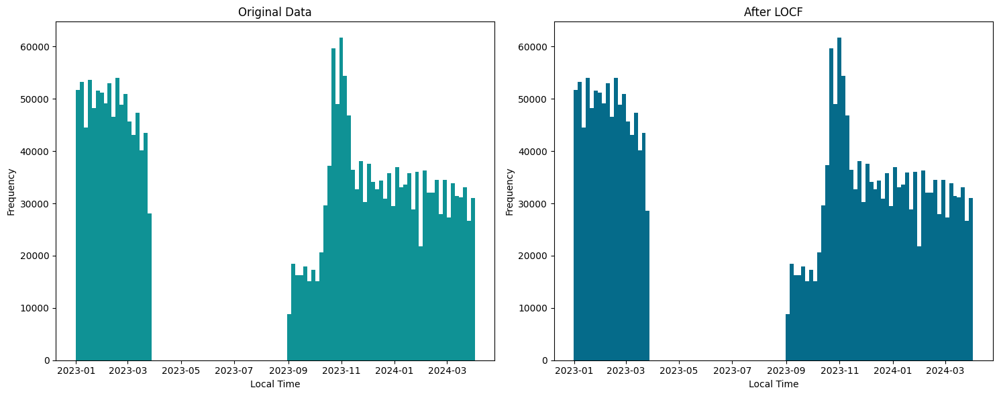

In [ ]:
# Check 'local_time' difference since LOCF method applied Last Observation Carried Forward:
# Set timezone
soil_sensor_data['local_time'] = pd.to_datetime(soil_sensor_data['local_time']).dt.tz_localize(None)
df_soil_sensor_data['local_time'] = pd.to_datetime(df_soil_sensor_data['local_time']).dt.tz_localize(None)
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Original
axs[0].hist(soil_sensor_data['local_time'], bins=100, color=color_d[2])
axs[0].set_title('Original Data')
axs[0].set_xlabel('Local Time')
axs[0].set_ylabel('Frequency')

# New
axs[1].hist(df_soil_sensor_data['local_time'], bins=100, color=color_d[3])
axs[1].set_title('After LOCF')
axs[1].set_xlabel('Local Time')
axs[1].set_ylabel('Frequency')
plt.tight_layout()
plt.show()

In [ ]:
# look at records before and after the (Original)
soil_sensor_data = soil_sensor_data.sort_values(by='local_time') # Sort
soil_sensor_data['time_diff'] = soil_sensor_data['local_time'].diff()
gap_threshold = pd.Timedelta(days=7)
gaps = soil_sensor_data[soil_sensor_data['time_diff'] > gap_threshold]
print(gaps[['local_time', 'time_diff']])
gap_info = soil_sensor_data[soil_sensor_data['time_diff'] == pd.Timedelta('158 days 21:30:00')]
if not gap_info.empty:
    for index, row in gap_info.iterrows():
        end_of_gap = row['local_time']
        start_of_gap = end_of_gap - row['time_diff']
        print(f"Gap starts at {start_of_gap} and ends at {end_of_gap}, lasting {row['time_diff']}")

                local_time         time_diff
609666 2023-09-02 10:30:00 158 days 21:30:00
Gap starts at 2023-03-27 13:00:00 and ends at 2023-09-02 10:30:00, lasting 158 days 21:30:00


In [ ]:
# look at records before and after the gap LOCF
df_soil_sensor_data = df_soil_sensor_data.sort_values(by='local_time') # Sort
df_soil_sensor_data['time_diff'] = df_soil_sensor_data['local_time'].diff()
df_gap_threshold = pd.Timedelta(days=7)
df_gaps = df_soil_sensor_data[df_soil_sensor_data['time_diff'] > df_gap_threshold]
print(df_gaps[['local_time', 'time_diff']])
df_gap_info = df_soil_sensor_data[df_soil_sensor_data['time_diff'] == pd.Timedelta('158 days 21:30:00')]
if not df_gap_info.empty:
    for index, row in df_gap_info.iterrows():
        df_end_of_gap = row['local_time']
        df_start_of_gap = df_end_of_gap - row['time_diff']
        print(f"Gap starts at {df_start_of_gap} and ends at {df_end_of_gap}, lasting {row['time_diff']}")

                local_time         time_diff
609632 2023-09-02 10:30:00 158 days 21:30:00
Gap starts at 2023-03-27 13:00:00 and ends at 2023-09-02 10:30:00, lasting 158 days 21:30:00


In [ ]:
# Check soil value missing data
df = df_soil_sensor_data
missing_indices = df[df['soil_value'].isnull()].index
first_missing_index = missing_indices[0]
context_range = 5
df.loc[first_missing_index - context_range:first_missing_index + context_range]

# 'df_soil_sensor_data['soil_values'] where ['site_name_y'] = 'Block 3'
block_3_soil_values = df_soil_sensor_data[df_soil_sensor_data['site_name_y'] == 'Block 3']
print(block_3_soil_values['soil_value'])

315293    37.35
315225    27.22
306775    18.16
315274    21.96
306212    17.56
          ...  
333222    18.44
333210    17.50
333303    17.50
333320    17.90
333221    18.45
Name: soil_value, Length: 67623, dtype: float64


In [ ]:
# Find missing soil values based on each site name
grouped_data = df_soil_sensor_data.groupby('site_name_y')
for name, group in grouped_data:
    # soil_value = NaN
    nan_rows = group[group['soil_value'].isna()]

    # NaN rows
    if not nan_rows.empty:
        print(f"NaN 'soil_value' for site '{name}':")
        print(nan_rows[['site_name_y', 'soil_value', 'local_time']])
        print()


NaN 'soil_value' for site 'Block 1':
       site_name_y  soil_value          local_time
359244     Block 1         NaN 2023-12-17 19:15:00
359191     Block 1         NaN 2023-12-17 19:15:00
359243     Block 1         NaN 2023-12-17 19:30:00
352619     Block 1         NaN 2023-12-17 19:30:00
352617     Block 1         NaN 2023-12-17 19:45:00
...            ...         ...                 ...
369198     Block 1         NaN 2024-02-26 20:45:00
367267     Block 1         NaN 2024-02-26 21:00:00
367278     Block 1         NaN 2024-02-26 21:00:00
367276     Block 1         NaN 2024-02-26 21:15:00
367269     Block 1         NaN 2024-02-26 21:15:00

[80 rows x 3 columns]

NaN 'soil_value' for site 'Block 2':
       site_name_y  soil_value          local_time
121989     Block 2         NaN 2023-12-17 20:15:00
110096     Block 2         NaN 2023-12-17 20:15:00
73292      Block 2         NaN 2023-12-17 20:15:00
121987     Block 2         NaN 2023-12-17 20:30:00
121994     Block 2         NaN 2023

In [ ]:
# Find soil values on other days for Block 1
block_1_data = df_soil_sensor_data[df_soil_sensor_data['site_name_y'] == 'Block 1']
date_of_interest = pd.to_datetime('2023-12-17 19:15:00')
date_range_start = date_of_interest - pd.Timedelta(days=2)
date_range_end = date_of_interest + pd.Timedelta(days=2)
surrounding_soil_values = block_1_data[(block_1_data['local_time'] >= date_range_start) &
                                       (block_1_data['local_time'] <= date_range_end) &
                                       (block_1_data['local_time'] != date_of_interest)]

print(surrounding_soil_values[['local_time', 'soil_value']])
unique_rows = surrounding_soil_values[['local_time', 'soil_value']].drop_duplicates()
print(unique_rows)

                local_time  soil_value
333479 2023-12-15 19:15:00        22.3
358468 2023-12-15 19:15:00     -9999.0
333478 2023-12-15 19:30:00        22.4
333486 2023-12-15 19:30:00     -9999.0
353417 2023-12-15 19:45:00        22.5
...                    ...         ...
361948 2023-12-19 18:45:00        21.0
353684 2023-12-19 19:00:00     -9999.0
353676 2023-12-19 19:00:00        21.1
362008 2023-12-19 19:15:00     -9999.0
353678 2023-12-19 19:15:00        21.2

[352 rows x 2 columns]
                local_time  soil_value
333479 2023-12-15 19:15:00        22.3
358468 2023-12-15 19:15:00     -9999.0
333478 2023-12-15 19:30:00        22.4
333486 2023-12-15 19:30:00     -9999.0
353417 2023-12-15 19:45:00        22.5
...                    ...         ...
361948 2023-12-19 18:45:00        21.0
353684 2023-12-19 19:00:00     -9999.0
353676 2023-12-19 19:00:00        21.1
362008 2023-12-19 19:15:00     -9999.0
353678 2023-12-19 19:15:00        21.2

[345 rows x 2 columns]


### Find Outliers soil_sensor_data
- Interquartile range (IQR) to identify values that are significantly higher or lower than the rest of the data.
- Outliers = values that fall below Q1 - 1.5 * IQR or above Q3 + 1.5 * IQR, where Q1 and Q3 are the 25th and 75th percentiles of the dataset,use the interquartile range (IQR) to identify values that are significantly higher or lower than the rest of the data.

In [ ]:
# IQR
Q1 = unique_rows['soil_value'].quantile(0.25)
Q3 = unique_rows['soil_value'].quantile(0.75)
IQR = Q3 - Q1

# Thresholds & outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = unique_rows[(unique_rows['soil_value'] < lower_bound) | (unique_rows['soil_value'] > upper_bound)]
print(f"Outliers in the dataset: {outliers}")

# Calculate IQR
Q1 = df_soil_sensor_data['soil_value'].quantile(0.25)
Q3 = df_soil_sensor_data['soil_value'].quantile(0.75)
IQR = Q3 - Q1

# Thresholds & outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = df_soil_sensor_data[(df_soil_sensor_data['soil_value'] < lower_bound) | (df_soil_sensor_data['soil_value'] > upper_bound)]
print(f"Outliers in the dataset: {outliers}")
outliers.count()

Outliers in the dataset: Empty DataFrame
Columns: [local_time, soil_value]
Index: []
Outliers in the dataset:                  local_time            site_name_x  site_id        id  \
2184734 2022-12-31 13:00:00  Cnr Barry & Leicester    69159  15517638   
2258430 2022-12-31 13:00:00             Point Park    65002  15513658   
1127023 2022-12-31 13:00:00              Bandstand    75507  15522903   
864604  2022-12-31 13:00:00     Kings Domain North    66203  15516538   
1811593 2022-12-31 13:00:00    Flagstaff Gardens 3    64991  15520045   
...                     ...                    ...      ...       ...   
371701  2024-04-01 21:00:00                Block 1   193881  21965543   
142083  2024-04-01 21:00:00                Block 2   193854  21965503   
72853   2024-04-01 21:00:00    Princes Park Lawn 5    64993  21965571   
72941   2024-04-01 21:00:00    Princes Park Lawn 5    64993  21965620   
371700  2024-04-01 21:15:00                Block 1   193881  21965464   

         prob

local_time          74411
site_name_x         74411
site_id             74411
id                  74411
probe_id            74411
probe_measure       74411
soil_value          74411
unit                74411
json_featuretype    74411
site_name_y         74411
property_name       24307
latitude            74411
longitude           74411
location            74411
time_diff           74411
dtype: int64

In [ ]:
count_soil_values = df_soil_sensor_data['soil_value'].count()
print("Number of soil values:", count_soil_values)

Number of soil values: 2400279


### Find outliers IQR for records (NaN) values soil_value
- Data set 2400683 records
- 404 NaN records in ['soil_value']
- 74411 outliers in ['soil_value'] using IQR

In [ ]:
# Drop missing indices
missing_indices = df_soil_sensor_data[df_soil_sensor_data['soil_value'].isnull()].index
df_soil_sensor_data.drop(index=missing_indices, inplace=True)
print("Missing indices:", missing_indices)

Missing indices: Index([301504, 312897, 359244, 301509, 359191, 265994, 266005, 359243, 352619,
       301505,
       ...
        63607,  63585,  67721,  67718,  67716, 329506, 328322, 367276, 326627,
       367269],
      dtype='int64', length=404)


### Missing values soil_sensor_data['property_values']
Missing 1215988  - 1184291 total = 31697

In [ ]:
df_soil_sensor_data['property_name'].head()

1876382               Royal Park
464168                       NaN
2205917    Carlton Gardens North
197768                       NaN
898892         Alexandra Gardens
Name: property_name, dtype: object

In [ ]:
# Drop missing indices
missing_indices = df_soil_sensor_data[df_soil_sensor_data['property_name'].isnull()].index
df_soil_sensor_data.drop(index=missing_indices, inplace=True)
print("Missing indices:", missing_indices)

Missing indices: Index([ 464168,  197768,  197782, 1105493,  793984, 1105510, 1105511, 1105512,
       1105513, 1105515,
       ...
        142083,  333222,  333210,  142073,  142082,  371696,  371700,  333303,
        333320,  333221],
      dtype='int64', length=1215988)


In [ ]:
property_name_values = df_soil_sensor_data['property_name'].count()
print("Number of property_name:", property_name_values)
df_soil_sensor_data = df_soil_sensor_data.drop(columns=['property_name'])
df_soil_sensor_data = df_soil_sensor_data.dropna(subset=['time_diff'])

Number of property_name: 1184291


In [ ]:
# Check missing values
mval_soil_sensor = df_soil_sensor_data.isnull().sum()
print(f"Soil sensor data missing values:\n{mval_soil_sensor}")

Soil sensor data missing values:
local_time          0
site_name_x         0
site_id             0
id                  0
probe_id            0
probe_measure       0
soil_value          0
unit                0
json_featuretype    0
site_name_y         0
latitude            0
longitude           0
location            0
time_diff           0
dtype: int64


## Re-check all datasets

In [ ]:
# Check missing values for dataset
mval_microlabs = microlabs_co2_sensor_data.isnull().sum()
mval_microclimate = microclimate_sensor_readings.isnull().sum()
mval_soil_sensor = df_soil_sensor_data.isnull().sum()
mval_microlabs_locations = microclimate_sensor_locations.isnull().sum()

print(f"microlabs_co2_sensor_data: {mval_microlabs}")
print(f"microclimate_sensor_readings: {mval_microclimate}")
print(f"soil_sensor_data: {mval_soil_sensor}")
print(f"soil_sensor_data: {mval_microlabs_locations}")

microlabs_co2_sensor_data: dev_id         0
sensor_name    0
time           0
temperature    0
humidity       0
light          0
motion         0
visit          0
vdd            0
lat_long       8
co2            0
latitude       0
longitude      0
date           0
dtype: int64
microclimate_sensor_readings: local_time       0
id               0
site_id          0
sensor_id        0
value            0
type             0
units            0
gatewayhub_id    0
site_status      0
dtype: int64
soil_sensor_data: local_time          0
site_name_x         0
site_id             0
id                  0
probe_id            0
probe_measure       0
soil_value          0
unit                0
json_featuretype    0
site_name_y         0
latitude            0
longitude           0
location            0
time_diff           0
dtype: int64
soil_sensor_data: site_id          0
gatewayhub_id    0
site_status      0
start_reading    0
latitude         0
longitude        0
location         0
dtype: int64


### All dataset info
- df_soil_sensor_data
- microlabs_co2_sensor_data
- microclimate_sensor_readings

In [ ]:
# View data types
microlabs_co2_sensor_data.info()
microclimate_sensor_readings.info()
microclimate_sensor_locations.info()
df_soil_sensor_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 207521 entries, 0 to 207520
Data columns (total 14 columns):
 #   Column       Non-Null Count   Dtype              
---  ------       --------------   -----              
 0   dev_id       207521 non-null  object             
 1   sensor_name  207521 non-null  object             
 2   time         207521 non-null  datetime64[ns, UTC]
 3   temperature  207521 non-null  float64            
 4   humidity     207521 non-null  int64              
 5   light        207521 non-null  float64            
 6   motion       207521 non-null  int64              
 7   visit        207521 non-null  int64              
 8   vdd          207521 non-null  int64              
 9   lat_long     207513 non-null  object             
 10  co2          207521 non-null  float64            
 11  latitude     207521 non-null  object             
 12  longitude    207521 non-null  object             
 13  date         207521 non-null  object             
dtypes: d

In [ ]:
#Drop time_diff
df_soil_sensor_data.drop(['time_diff'], axis=1, inplace=True)
df_soil_sensor_data.head()

,local_time,site_name_x,site_id,id,probe_id,probe_measure,soil_value,unit,json_featuretype,site_name_y,latitude,longitude,location
2205917,2022-12-31 13:00:00,Carlton Gardens North,64979,15522826,1306504,Soil Moisture 50cm #0,32.63,%VWC,SoilSensorData,Carlton Gardens North,-37.80170,144.97138,"-37.801699999983285, 144.9713799999935"
898892,2022-12-31 13:00:00,Alexandra Gardens Engineers Lawn,66195,15522987,1338740,Soil Temperature 50cm #0,21.36,ºC,SoilSensorData,Alexandra Gardens Engineers Lawn,-37.82073,144.97254,"-37.82072999998553, 144.97253999999268"
2248612,2022-12-31 13:00:00,9th Fairway,64976,15515162,1320442,Soil Salinity 20cm #0,0.05,µS/cm,SoilSensorData,9th Fairway,-37.78292,144.95566,"-37.78291999998904, 144.95566000000628"
575652,2022-12-31 13:00:00,Shrine Reserve North East,64986,15521623,1305387,Soil Moisture 50cm #0,51.39,%VWC,SoilSensorData,Shrine Reserve North East,-37.82921,144.97348,"-37.8292099999859, 144.97347999998564"
2205914,2022-12-31 13:00:00,Carlton Gardens North,64979,15514301,1306520,Soil Temperature 30cm #0,20.63,ºC,SoilSensorData,Carlton Gardens North,-37.80170,144.97138,"-37.801699999983285, 144.9713799999935"


In [ ]:
# Unique records df_soil_sensor_data
unique_dev_keys_in_soil_sensor_data = df_soil_sensor_data['id'].nunique()
print(f"Number of unique 'id' values in df_soil_sensor_data: {unique_dev_keys_in_soil_sensor_data}")

total_data_soil_sensor_data = df_soil_sensor_data.shape[0]
print(f"Total number of elements in df_soil_sensor_data: {total_data_soil_sensor_data}")

Number of unique 'id' values in df_soil_sensor_data: 1184290
Total number of elements in df_soil_sensor_data: 1184290


In [ ]:
# Unique records microclimate_sensor_readings
unique_dev_microclimate_sensor_readings = microclimate_sensor_readings['id'].nunique()
print(f"Number of unique 'id' values in unique_dev_microclimate_sensor_readings: {unique_dev_microclimate_sensor_readings}")

total_data_microclimate_sensor_readings = microclimate_sensor_readings.shape[0]
print(f"Total number of elements in unique_dev_microclimate_sensor_readings: {total_data_microclimate_sensor_readings}")

Number of unique 'id' values in unique_dev_microclimate_sensor_readings: 56
Total number of elements in unique_dev_microclimate_sensor_readings: 56


In [ ]:
# Unique records microlabs_co2_sensor_data
unique_dev_microlabs_co2_sensor_data = microlabs_co2_sensor_data['dev_id'].nunique()
print(f"Number of unique 'id' values in microlabs_co2_sensor_data: {unique_dev_microlabs_co2_sensor_data}")

total_data_microlabs_co2_sensor_data = microlabs_co2_sensor_data.shape[0]
print(f"Total number of elements in microlabs_co2_sensor_data: {total_data_microlabs_co2_sensor_data}")

Number of unique 'id' values in microlabs_co2_sensor_data: 1
Total number of elements in microlabs_co2_sensor_data: 207521


In [ ]:
# Reset index for each row
microlabs_co2_sensor_data = microlabs_co2_sensor_data.reset_index(drop=True)

In [ ]:
# Unique records microclimate_sensor_locations
unique_dev_microclimate_sensor_locations = microclimate_sensor_locations['site_id'].nunique()
print(f"Number of unique 'id' values in microclimate_sensor_locations: {unique_dev_microclimate_sensor_locations}")

total_data_microclimate_sensor_locations = microclimate_sensor_locations.shape[0]
print(f"Total number of elements in microclimate_sensor_locations: {total_data_microclimate_sensor_locations}")

Number of unique 'id' values in microclimate_sensor_locations: 16
Total number of elements in microclimate_sensor_locations: 16


### All datasets check duplicates


In [ ]:
# Check duplicates
duplicates_co2 = microlabs_co2_sensor_data.duplicated().sum()
duplicates_microclimate = microclimate_sensor_readings.duplicated().sum()
duplicates_locations = microclimate_sensor_locations.duplicated().sum()
duplicates_soil = df_soil_sensor_data.duplicated().sum()
print("Number of duplicate rows in CO2 sensor data:", duplicates_co2)
print("Number of duplicate rows in microclimate sensor readings:", duplicates_microclimate)
print("Number of duplicate rows in microclimate sensor locations:", duplicates_locations)
print("Number of duplicate rows in soil sensor data:", duplicates_soil)

Number of duplicate rows in CO2 sensor data: 0
Number of duplicate rows in microclimate sensor readings: 0
Number of duplicate rows in microclimate sensor locations: 0
Number of duplicate rows in soil sensor data: 0


### Merge Datasets microclimate_sensor_readings microclimate_sensor_locations
- microclimate_sensor_readings
- microclimate_sensor_locations

In [ ]:
microclimate_sensor = pd.merge(microclimate_sensor_locations, microclimate_sensor_readings, on='site_id', how='outer')
microclimate_sensor = microclimate_sensor.dropna(subset=['id']) # Drop NaN
microclimate_sensor.head()

,site_id,gatewayhub_id_x,site_status_x,start_reading,latitude,longitude,location,local_time,id,sensor_id,value,type,units,gatewayhub_id_y,site_status_y
2,1011,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222",2023-11-29 22:15:02+00:00,8110553.0,5b,74.38,TPH.RH,%,arc1055,C
3,1011,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222",2023-11-29 22:15:02+00:00,8110558.0,5c,1010.80,TPH.PRESSURE,hPa,arc1055,C
4,1011,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222",2023-11-29 22:15:03+00:00,8110562.0,6,0.00,WS,km/h,arc1055,C
5,1011,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222",2023-11-29 22:30:02+00:00,8110554.0,5b,74.19,TPH.RH,%,arc1055,C
6,1011,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222",2023-11-29 22:30:11+00:00,8110523.0,0a,5.90,PM2.5,ug\/m^3,arc1055,C


In [ ]:
number_of_records = microclimate_sensor.shape[0] # Num records
print(f"Number of records in microclimate_sensor: {number_of_records}")

Number of records in microclimate_sensor: 56


In [ ]:
microlabs_co2_sensor_data.head()

,dev_id,sensor_name,time,temperature,humidity,light,motion,visit,vdd,lat_long,co2,latitude,longitude,date
0,ers-co2-9da0,ERS CO2,2022-05-04 01:40:25+00:00,20.9,47,441.0,0,0,3601,"-37.8133183, 144.9668853",507.0,-37.8133183,144.9668853,2022-05-04
1,ers-co2-9da0,ERS CO2,2022-05-04 01:33:25+00:00,20.9,47,505.0,0,0,3599,NaN,525.0,-37.8133183,144.9668853,2022-05-04
2,ers-co2-9da0,ERS CO2,2022-05-04 01:34:35+00:00,20.9,47,528.0,0,0,3601,NaN,527.0,-37.8133183,144.9668853,2022-05-04
3,ers-co2-9da0,ERS CO2,2022-05-04 01:31:05+00:00,20.9,47,441.0,0,0,3596,NaN,535.0,-37.8133183,144.9668853,2022-05-04
4,ers-co2-9da0,ERS CO2,2022-05-04 08:25:14+00:00,20.8,46,90.0,0,0,3596,"-37.8133183, 144.9668853",495.0,-37.8133183,144.9668853,2022-05-04


In [ ]:
microclimate_sensor.head()

,site_id,gatewayhub_id_x,site_status_x,start_reading,latitude,longitude,location,local_time,id,sensor_id,value,type,units,gatewayhub_id_y,site_status_y
2,1011,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222",2023-11-29 22:15:02+00:00,8110553.0,5b,74.38,TPH.RH,%,arc1055,C
3,1011,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222",2023-11-29 22:15:02+00:00,8110558.0,5c,1010.80,TPH.PRESSURE,hPa,arc1055,C
4,1011,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222",2023-11-29 22:15:03+00:00,8110562.0,6,0.00,WS,km/h,arc1055,C
5,1011,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222",2023-11-29 22:30:02+00:00,8110554.0,5b,74.19,TPH.RH,%,arc1055,C
6,1011,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222",2023-11-29 22:30:11+00:00,8110523.0,0a,5.90,PM2.5,ug\/m^3,arc1055,C


In [ ]:
df_soil_sensor_data.head()

,local_time,site_name_x,site_id,id,probe_id,probe_measure,soil_value,unit,json_featuretype,site_name_y,latitude,longitude,location
2205917,2022-12-31 13:00:00,Carlton Gardens North,64979,15522826,1306504,Soil Moisture 50cm #0,32.63,%VWC,SoilSensorData,Carlton Gardens North,-37.80170,144.97138,"-37.801699999983285, 144.9713799999935"
898892,2022-12-31 13:00:00,Alexandra Gardens Engineers Lawn,66195,15522987,1338740,Soil Temperature 50cm #0,21.36,ºC,SoilSensorData,Alexandra Gardens Engineers Lawn,-37.82073,144.97254,"-37.82072999998553, 144.97253999999268"
2248612,2022-12-31 13:00:00,9th Fairway,64976,15515162,1320442,Soil Salinity 20cm #0,0.05,µS/cm,SoilSensorData,9th Fairway,-37.78292,144.95566,"-37.78291999998904, 144.95566000000628"
575652,2022-12-31 13:00:00,Shrine Reserve North East,64986,15521623,1305387,Soil Moisture 50cm #0,51.39,%VWC,SoilSensorData,Shrine Reserve North East,-37.82921,144.97348,"-37.8292099999859, 144.97347999998564"
2205914,2022-12-31 13:00:00,Carlton Gardens North,64979,15514301,1306520,Soil Temperature 30cm #0,20.63,ºC,SoilSensorData,Carlton Gardens North,-37.80170,144.97138,"-37.801699999983285, 144.9713799999935"


## A. Save Datasets
- microclimate_sensor
- microlabs_co2_sensor_data
- df_soil_sensor_data

In [ ]:
# # Save the DataFrame to a CSV file
microclimate_sensor.to_csv('/content/drive/My Drive/sit378_eco_metrix/microclimate_sensor_cleaned.csv', index=False)
microlabs_co2_sensor_data.to_csv('/content/drive/My Drive/sit378_eco_metrix/microlabs_co2_sensor_data_cleaned.csv', index=False)
df_soil_sensor_data.to_csv('/content/drive/My Drive/sit378_eco_metrix/df_soil_sensor_data_cleaned.csv', index=False)

## User Interface - View Datasets

## B. Load datasets
- microclimate_sensor
- microlabs_co2_sensor_data
- df_soil_sensor_data

In [ ]:
# load datasets
microclimate_sensor_df =  pd.read_csv('/content/drive/My Drive/sit378_eco_metrix/microclimate_sensor_cleaned.csv')
microlabs_co2_sensor_data_df = pd.read_csv('/content/drive/My Drive/sit378_eco_metrix/microlabs_co2_sensor_data_cleaned.csv')
df_soil_sensor_data_df =  pd.read_csv('/content/drive/My Drive/sit378_eco_metrix/df_soil_sensor_data_cleaned.csv')
microclimate_sensor = pd.read_csv('/content/drive/My Drive/sit378_eco_metrix/microclimate_sensor_cleaned.csv')
# dictionary
dataframes = {
    'Microclimate Sensor': microclimate_sensor_df,
    'Microlabs CO2 Sensor Data': microlabs_co2_sensor_data_df,
    'Soil Sensor Data': df_soil_sensor_data_df
}

# Widget
dataset_dropdown = widgets.Dropdown(
    options=list(dataframes.keys()),
    description='Dataset:',
    disabled=False,
)

# update/ change menu data
def dataset_change(change):
    selected_dataset = change['new']
    display(dataframes[selected_dataset])

# Watch for changes on the dataset dropdown
dataset_dropdown.observe(dataset_change, names='value')

# Display the widget
display(dataset_dropdown)


Dropdown(description='Dataset:', options=('Microclimate Sensor', 'Microlabs CO2 Sensor Data', 'Soil Sensor Dat…

,dev_id,sensor_name,time,temperature,humidity,light,motion,visit,vdd,lat_long,co2,latitude,longitude,date
0,ers-co2-9da0,ERS CO2,2022-05-04 01:40:25+00:00,20.9,47,441.0,0,0,3601,"-37.8133183, 144.9668853",507.0,-37.813318,144.966885,2022-05-04
1,ers-co2-9da0,ERS CO2,2022-05-04 01:33:25+00:00,20.9,47,505.0,0,0,3599,NaN,525.0,-37.813318,144.966885,2022-05-04
2,ers-co2-9da0,ERS CO2,2022-05-04 01:34:35+00:00,20.9,47,528.0,0,0,3601,NaN,527.0,-37.813318,144.966885,2022-05-04
3,ers-co2-9da0,ERS CO2,2022-05-04 01:31:05+00:00,20.9,47,441.0,0,0,3596,NaN,535.0,-37.813318,144.966885,2022-05-04
4,ers-co2-9da0,ERS CO2,2022-05-04 08:25:14+00:00,20.8,46,90.0,0,0,3596,"-37.8133183, 144.9668853",495.0,-37.813318,144.966885,2022-05-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207516,ers-co2-9da0,ERS CO2,2024-04-02 22:52:51+00:00,20.1,53,377.0,2,1,3651,"-37.8133183, 144.9668853",425.0,-37.813318,144.966885,2024-04-02
207517,ers-co2-9da0,ERS CO2,2024-04-02 23:07:51+00:00,21.2,52,394.0,0,0,3648,"-37.8133183, 144.9668853",417.0,-37.813318,144.966885,2024-04-02
207518,ers-co2-9da0,ERS CO2,2024-04-02 23:37:51+00:00,19.6,57,309.0,0,0,3648,"-37.8133183, 144.9668853",410.0,-37.813318,144.966885,2024-04-02
207519,ers-co2-9da0,ERS CO2,2024-04-02 23:47:51+00:00,21.9,51,400.0,4,1,3648,"-37.8133183, 144.9668853",415.0,-37.813318,144.966885,2024-04-02


## Soil Data Pre-Processing
- Define time/ date columns

In [ ]:
# Extract date and Drop columns
df_soil_sensor_data = df_soil_sensor_data_df.copy()

df_soil_sensor_data['time'] = pd.to_datetime(df_soil_sensor_data['local_time'])
df_soil_sensor_data['date'] = df_soil_sensor_data['time'].dt.date
df_soil_sensor_data = df_soil_sensor_data.drop(columns=['local_time', 'site_name_x', 'probe_id', 'json_featuretype', 'site_name_y'])

# Redefine time
df_soil_sensor_data['time'] = pd.to_datetime(df_soil_sensor_data['time'])
df_soil_sensor_data['time'] = df_soil_sensor_data['time'].dt.time

In [ ]:
df_soil_sensor_data.head()

,site_id,id,probe_measure,soil_value,unit,latitude,longitude,location,time,date
0,64979,15522826,Soil Moisture 50cm #0,32.63,%VWC,-37.80170,144.97138,"-37.801699999983285, 144.9713799999935",13:00:00,2022-12-31
1,66195,15522987,Soil Temperature 50cm #0,21.36,ºC,-37.82073,144.97254,"-37.82072999998553, 144.97253999999268",13:00:00,2022-12-31
2,64976,15515162,Soil Salinity 20cm #0,0.05,µS/cm,-37.78292,144.95566,"-37.78291999998904, 144.95566000000628",13:00:00,2022-12-31
3,64986,15521623,Soil Moisture 50cm #0,51.39,%VWC,-37.82921,144.97348,"-37.8292099999859, 144.97347999998564",13:00:00,2022-12-31
4,64979,15514301,Soil Temperature 30cm #0,20.63,ºC,-37.80170,144.97138,"-37.801699999983285, 144.9713799999935",13:00:00,2022-12-31


In [ ]:
# Extract date and Drop columns
microlabs_co2_sensor_data = microlabs_co2_sensor_data_df.copy()
microlabs_co2_sensor_data['time'] = pd.to_datetime(microlabs_co2_sensor_data['time'])
microlabs_co2_sensor_data['date'] = microlabs_co2_sensor_data['time'].dt.date
microlabs_co2_sensor_data = microlabs_co2_sensor_data.drop(columns=['sensor_name'])

# Fill lat_long
microlabs_co2_sensor_data['lat_long'] = '-37.8133183, 144.9668853'

# Redefine time
microlabs_co2_sensor_data['time'] = pd.to_datetime(microlabs_co2_sensor_data['time'])
microlabs_co2_sensor_data['time'] = microlabs_co2_sensor_data['time'].dt.time

In [ ]:
microlabs_co2_sensor_data.head()

,dev_id,time,temperature,humidity,light,motion,visit,vdd,lat_long,co2,latitude,longitude,date
0,ers-co2-9da0,01:40:25,20.9,47,441.0,0,0,3601,"-37.8133183, 144.9668853",507.0,-37.813318,144.966885,2022-05-04
1,ers-co2-9da0,01:33:25,20.9,47,505.0,0,0,3599,"-37.8133183, 144.9668853",525.0,-37.813318,144.966885,2022-05-04
2,ers-co2-9da0,01:34:35,20.9,47,528.0,0,0,3601,"-37.8133183, 144.9668853",527.0,-37.813318,144.966885,2022-05-04
3,ers-co2-9da0,01:31:05,20.9,47,441.0,0,0,3596,"-37.8133183, 144.9668853",535.0,-37.813318,144.966885,2022-05-04
4,ers-co2-9da0,08:25:14,20.8,46,90.0,0,0,3596,"-37.8133183, 144.9668853",495.0,-37.813318,144.966885,2022-05-04


### Merge Datasets
- Using Date and Time
- Set datetime and then update index
- Sort data and merge using 1 hour intervals
- Normalise the data

In [ ]:
# Date time one column
# Before concatenation convert to string
df_soil_sensor_data['datetime'] = pd.to_datetime(df_soil_sensor_data['date'].astype(str) + ' ' + df_soil_sensor_data['time'].astype(str))
microlabs_co2_sensor_data['datetime'] = pd.to_datetime(microlabs_co2_sensor_data['date'].astype(str) + ' ' + microlabs_co2_sensor_data['time'].astype(str))

# index update
df_soil_sensor_data.set_index('datetime', inplace=True)
microlabs_co2_sensor_data.set_index('datetime', inplace=True)

# Sort
df_soil_sensor_data.sort_index(inplace=True)
microlabs_co2_sensor_data.sort_index(inplace=True)

# Merge (1 hr limit)
soil_co2_sensor_data = pd.merge_asof(df_soil_sensor_data, microlabs_co2_sensor_data, on='datetime', tolerance=pd.Timedelta('1H'), direction='nearest')
print(soil_co2_sensor_data.head())


             datetime  site_id        id             probe_measure  \
0 2022-12-31 13:00:00    64979  15522826     Soil Moisture 50cm #0   
1 2022-12-31 13:00:00    66195  15522987  Soil Temperature 50cm #0   
2 2022-12-31 13:00:00    64976  15515162     Soil Salinity 20cm #0   
3 2022-12-31 13:00:00    64986  15521623     Soil Moisture 50cm #0   
4 2022-12-31 13:00:00    64979  15514301  Soil Temperature 30cm #0   

   soil_value   unit  latitude_x  longitude_x  \
0       32.63   %VWC   -37.80170    144.97138   
1       21.36     ºC   -37.82073    144.97254   
2        0.05  µS/cm   -37.78292    144.95566   
3       51.39   %VWC   -37.82921    144.97348   
4       20.63     ºC   -37.80170    144.97138   

                                 location    time_x      date_x        dev_id  \
0  -37.801699999983285, 144.9713799999935  13:00:00  2022-12-31  ers-co2-9da0   
1  -37.82072999998553, 144.97253999999268  13:00:00  2022-12-31  ers-co2-9da0   
2  -37.78291999998904, 144.95566000000628

### Separate the values (units)
- %VWC: Volumetric water content is a numerical measure of soil moisture. It is simply the ratio of water volume to soil volume.
- ºC: Temperature in degrees celsius.
- µS/cm: Salinity is the measure of the concentration of dissolved (soluble) salts in water from all sources. (microseimens per centimetre)
<br>

- NaN values
1. Zero if it represents no measurement or an expected value of zero.
2. Mean or median of the column if the data distribution


In [ ]:
print(soil_co2_sensor_data['probe_measure'].unique())

['Soil Moisture 50cm #0' 'Soil Temperature 50cm #0'
 'Soil Salinity 20cm #0' 'Soil Temperature 30cm #0'
 'Soil Moisture 40cm #0 (Clay)' 'Soil Moisture 40cm #0'
 'Soil Salinity 30cm #0' 'Soil Moisture 40cm #0 (Sand)'
 'Soil Moisture 20cm #0 (Sand)' 'Soil Moisture 10cm #0 (Sand)'
 'Soil Temperature 10cm #0' 'Soil Temperature 40cm #0'
 'Soil Moisture 10cm #0' 'Soil Moisture 80cm #0 (Clay)'
 'Soil Moisture 30cm #0 (Clay)' 'Soil Moisture 80cm #0'
 'Soil Temperature 20cm #0' 'Soil Moisture 20cm #0 (Clayey Loam)'
 'Soil Moisture 30cm #0 (Clayey Loam)' 'Soil Moisture 70cm #0 (Clay)'
 'Soil Salinity 10cm #0' 'Soil Salinity 40 cm #0' '#0 Soil Moisture 50cm'
 'Soil Moisture 50cm #0 (Clay)' 'Soil Moisture 30cm #0'
 'Soil Temperature 80cm #0' '#0 Soil Moisture 60cm'
 '#0 Soil Moisture 80cm' '#0 Soil Moisture 20cm' 'Soil Moisture 20cm #0'
 'Soil Temperature 70cm #0' 'Soil Moisture 30cm #0 (Sandy Loam)'
 'Soil Moisture 40cm #0 (Clayey Loam)'
 'Soil Moisture 10cm #0 (Clayey Loam)' 'Soil Salinity 40cm 

In [ ]:
# Function to filter data by unit
def pivot_by_unit(dataframe, unit, fill_value=None):
    filtered_df = dataframe[dataframe['unit'] == unit]
    pivot = filtered_df.pivot_table(
        index=['datetime', 'site_id'],
        columns='probe_measure',
        values='soil_value',
        aggfunc='first'
    ).reset_index()
    # Fill NaNs selectively
    if fill_value is not None:
        pivot.fillna(fill_value, inplace=True)
    elif fill_value is None:  # Fill with mean for numeric data
        numeric_cols = pivot.select_dtypes(include=['number']).columns
        pivot[numeric_cols] = pivot[numeric_cols].fillna(pivot[numeric_cols].mean())
    return pivot

# Apply function to each unit
df_vwc = pivot_by_unit(soil_co2_sensor_data, '%VWC')
df_temp = pivot_by_unit(soil_co2_sensor_data, 'ºC')
df_salinity = pivot_by_unit(soil_co2_sensor_data, 'µS/cm')

# Display the pivoted data
print("VWC Data:")
print(df_vwc)
print("\nTemperature Data:")
print(df_temp)
print("\nSalinity Data:")
print(df_salinity)

VWC Data:
probe_measure            datetime  site_id  #0 Soil Moisture 10cm  \
0             2022-12-31 13:00:00    64970              30.763335   
1             2022-12-31 13:00:00    64973              30.763335   
2             2022-12-31 13:00:00    64974              30.763335   
3             2022-12-31 13:00:00    64975              30.763335   
4             2022-12-31 13:00:00    64976              30.763335   
...                           ...      ...                    ...   
45324         2024-04-01 17:00:00    75508              27.340000   
45325         2024-04-01 17:00:00    75509              38.580000   
45326         2024-04-01 19:00:00    64987              30.763335   
45327         2024-04-01 19:00:00    64993              30.763335   
45328         2024-04-01 21:00:00    64993              30.763335   

probe_measure  #0 Soil Moisture 10cm Clay Loam  #0 Soil Moisture 20cm  \
0                                    27.205734              30.770719   
1              

### Correlation Heatmap
- Volumetric Water Content (VWC), Temperature and Salinity

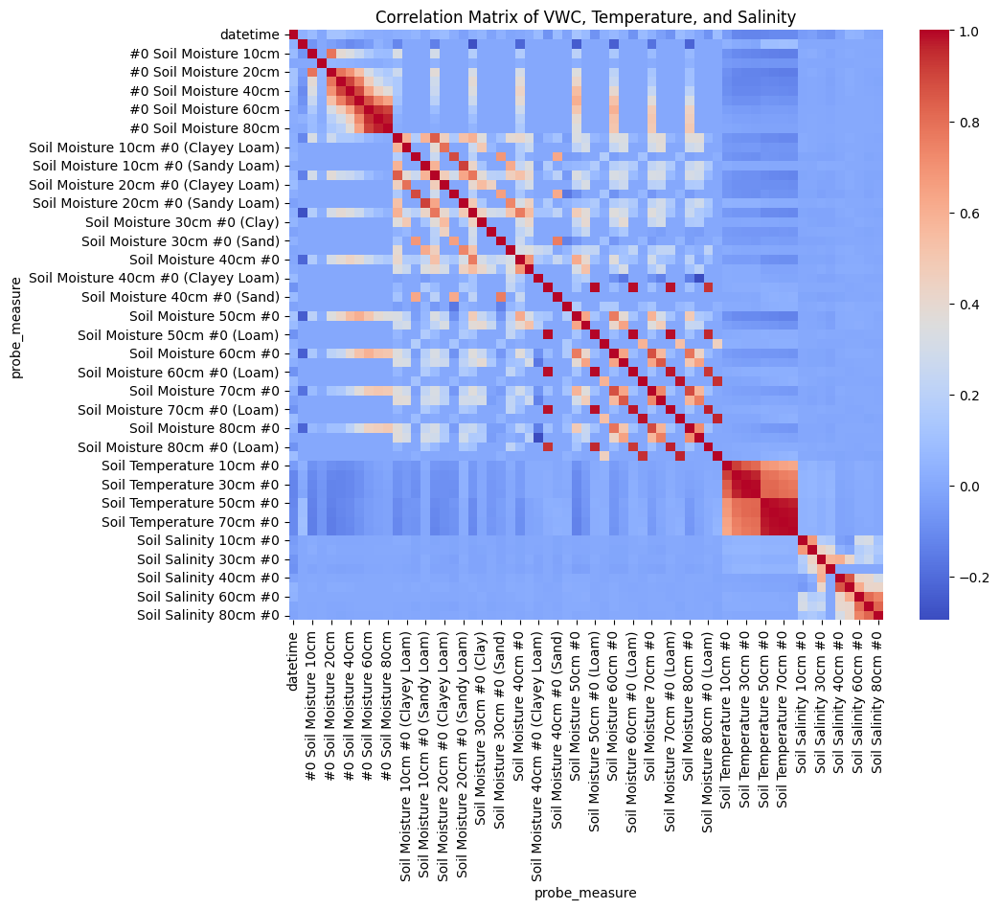

In [ ]:
data_frames = [df_vwc, df_temp, df_salinity]
df_merged = pd.concat(data_frames, axis=1)

# Drop duplicated columns if any occur during merging
df_merged = df_merged.loc[:,~df_merged.columns.duplicated()]

# Calculating the correlation matrix
correlation_matrix = df_merged.corr()

# Plotting the correlation matrix without annotations
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap='coolwarm', cbar=True)
plt.title("Correlation Matrix of VWC, Temperature, and Salinity")
plt.show()

### Time series plot

In [ ]:
print(soil_co2_sensor_data['site_id'].unique())

[64979 66195 64976 64986 64981 64984 64989 65002 64982 64998 75509 64991
 75502 75507 65012 75503 64990 75500 66203 64977 64993 65005 64973 65014
 64975 66190 66187 64999 64970 65010 64988 65011 64974 64996 64980 75508
 64971 66192 65013 66198 64985 66204 75505 65007 66199 75504 64987]


In [ ]:
print(soil_co2_sensor_data['probe_measure'].unique())

['Soil Moisture 50cm #0' 'Soil Temperature 50cm #0'
 'Soil Salinity 20cm #0' 'Soil Temperature 30cm #0'
 'Soil Moisture 40cm #0 (Clay)' 'Soil Moisture 40cm #0'
 'Soil Salinity 30cm #0' 'Soil Moisture 40cm #0 (Sand)'
 'Soil Moisture 20cm #0 (Sand)' 'Soil Moisture 10cm #0 (Sand)'
 'Soil Temperature 10cm #0' 'Soil Temperature 40cm #0'
 'Soil Moisture 10cm #0' 'Soil Moisture 80cm #0 (Clay)'
 'Soil Moisture 30cm #0 (Clay)' 'Soil Moisture 80cm #0'
 'Soil Temperature 20cm #0' 'Soil Moisture 20cm #0 (Clayey Loam)'
 'Soil Moisture 30cm #0 (Clayey Loam)' 'Soil Moisture 70cm #0 (Clay)'
 'Soil Salinity 10cm #0' 'Soil Salinity 40 cm #0' '#0 Soil Moisture 50cm'
 'Soil Moisture 50cm #0 (Clay)' 'Soil Moisture 30cm #0'
 'Soil Temperature 80cm #0' '#0 Soil Moisture 60cm'
 '#0 Soil Moisture 80cm' '#0 Soil Moisture 20cm' 'Soil Moisture 20cm #0'
 'Soil Temperature 70cm #0' 'Soil Moisture 30cm #0 (Sandy Loam)'
 'Soil Moisture 40cm #0 (Clayey Loam)'
 'Soil Moisture 10cm #0 (Clayey Loam)' 'Soil Salinity 40cm 

In [ ]:
# Categorise each probe_measurement
probe_measures = soil_co2_sensor_data['probe_measure'].unique()
moisture_measures = []
temperature_measures = []
salinity_measures = []
depth_measures = set()
soil_type_measures = set()

for measure in probe_measures:
    if 'Moisture' in measure:
        moisture_measures.append(measure)
       # Depth info and Soil type
        depth = re.search(r'\d+cm', measure)
        if depth:
            depth_measures.add(depth.group())

        soil_type = re.search(r'\((.*?)\)', measure)
        if soil_type:
            soil_type_measures.add(soil_type.group(1))

    elif 'Temperature' in measure:
        temperature_measures.append(measure)
        # Depth info
        depth = re.search(r'\d+cm', measure)
        if depth:
            depth_measures.add(depth.group())

    elif 'Salinity' in measure:
        salinity_measures.append(measure)
        # Depth info
        depth = re.search(r'\d+cm', measure)
        if depth:
            depth_measures.add(depth.group())

print('Moisture Measures:', moisture_measures)
print('Temperature Measures:', temperature_measures)
print('Salinity Measures:', salinity_measures)
print('Depth Measures:', depth_measures)
print('Soil Type Measures:', soil_type_measures)

Moisture Measures: ['Soil Moisture 50cm #0', 'Soil Moisture 40cm #0 (Clay)', 'Soil Moisture 40cm #0', 'Soil Moisture 40cm #0 (Sand)', 'Soil Moisture 20cm #0 (Sand)', 'Soil Moisture 10cm #0 (Sand)', 'Soil Moisture 10cm #0', 'Soil Moisture 80cm #0 (Clay)', 'Soil Moisture 30cm #0 (Clay)', 'Soil Moisture 80cm #0', 'Soil Moisture 20cm #0 (Clayey Loam)', 'Soil Moisture 30cm #0 (Clayey Loam)', 'Soil Moisture 70cm #0 (Clay)', '#0 Soil Moisture 50cm', 'Soil Moisture 50cm #0 (Clay)', 'Soil Moisture 30cm #0', '#0 Soil Moisture 60cm', '#0 Soil Moisture 80cm', '#0 Soil Moisture 20cm', 'Soil Moisture 20cm #0', 'Soil Moisture 30cm #0 (Sandy Loam)', 'Soil Moisture 40cm #0 (Clayey Loam)', 'Soil Moisture 10cm #0 (Clayey Loam)', '#0 Soil Moisture 70cm', '#0 Soil Moisture 30cm', '#0 Soil Moisture 10cm', 'Soil Moisture 60cm #0', 'Soil Moisture 50cm #0 (Sandy Loam)', 'Soil Moisture 70cm #0', 'Soil Moisture 80cm #0 (Sandy Loam)', 'Soil Moisture 70cm #0 (Sandy Loam)', 'Soil Moisture 60cm #0 (Clay)', '#0 Soil 

In [ ]:
# Details of each probe_measurement
clay_measures = []
sand_measures = []
loam_measures = []
sandy_loam_measures = []
clayey_loam_measures = []
other_measures = []

for measure in moisture_measures:
    soil_type = re.search(r'\((.*?)\)', measure)
    depth = re.search(r'\d+cm', measure)
    if soil_type:
        soil_type_str = soil_type.group(1)
        if 'Clay' in soil_type_str and 'Clayey Loam' not in soil_type_str:
            clay_measures.append(measure)
        elif 'Sand' in soil_type_str and 'Sandy Loam' not in soil_type_str:
            sand_measures.append(measure)
        elif 'Loam' in soil_type_str and 'Sandy Loam' not in soil_type_str and 'Clayey Loam' not in soil_type_str:
            loam_measures.append(measure)
        elif 'Sandy Loam' in soil_type_str:
            sandy_loam_measures.append(measure)
        elif 'Clayey Loam' in soil_type_str:
            clayey_loam_measures.append(measure)
    else:
        other_measures.append(measure)

print("Clay Measures:")
clay_soil_types = list(set([re.search(r'\((.*?)\)', m).group(1) for m in clay_measures if re.search(r'\((.*?)\)', m)]))
clay_depths = list(set([re.search(r'\d+cm', m).group() for m in clay_measures if re.search(r'\d+cm', m)]))
print("Soil Types:", clay_soil_types)
print("Depths:", clay_depths)
print(clay_measures)

print("\nSand Measures:")
sand_soil_types = list(set([re.search(r'\((.*?)\)', m).group(1) for m in sand_measures if re.search(r'\((.*?)\)', m)]))
sand_depths = list(set([re.search(r'\d+cm', m).group() for m in sand_measures if re.search(r'\d+cm', m)]))
print("Soil Types:", sand_soil_types)
print("Depths:", sand_depths)
print(sand_measures)

print("\nLoam Measures:")
loam_soil_types = list(set([re.search(r'\((.*?)\)', m).group(1) for m in loam_measures if re.search(r'\((.*?)\)', m)]))
loam_depths = list(set([re.search(r'\d+cm', m).group() for m in loam_measures if re.search(r'\d+cm', m)]))
print("Soil Types:", loam_soil_types)
print("Depths:", loam_depths)
print(loam_measures)

print("\nSandy Loam Measures:")
sandy_loam_soil_types = list(set([re.search(r'\((.*?)\)', m).group(1) for m in sandy_loam_measures if re.search(r'\((.*?)\)', m)]))
sandy_loam_depths = list(set([re.search(r'\d+cm', m).group() for m in sandy_loam_measures if re.search(r'\d+cm', m)]))
print("Soil Types:", sandy_loam_soil_types)
print("Depths:", sandy_loam_depths)
print(sandy_loam_measures)

print("\nClayey Loam Measures:")
clayey_loam_soil_types = list(set([re.search(r'\((.*?)\)', m).group(1) for m in clayey_loam_measures if re.search(r'\((.*?)\)', m)]))
clayey_loam_depths = list(set([re.search(r'\d+cm', m).group() for m in clayey_loam_measures if re.search(r'\d+cm', m)]))
print("Soil Types:", clayey_loam_soil_types)
print("Depths:", clayey_loam_depths)
print(clayey_loam_measures)

print("\nOther Measures:")
other_measures_depths = list(set([re.search(r'\d+cm', m).group() for m in other_measures if re.search(r'\d+cm', m)]))
print("Depths:", other_measures_depths)
print(other_measures)

Clay Measures:
Soil Types: ['Clay']
Depths: ['70cm', '50cm', '40cm', '30cm', '80cm', '60cm']
['Soil Moisture 40cm #0 (Clay)', 'Soil Moisture 80cm #0 (Clay)', 'Soil Moisture 30cm #0 (Clay)', 'Soil Moisture 70cm #0 (Clay)', 'Soil Moisture 50cm #0 (Clay)', 'Soil Moisture 60cm #0 (Clay)']

Sand Measures:
Soil Types: ['Sand']
Depths: ['10cm', '40cm', '30cm', '20cm']
['Soil Moisture 40cm #0 (Sand)', 'Soil Moisture 20cm #0 (Sand)', 'Soil Moisture 10cm #0 (Sand)', 'Soil Moisture 30cm #0 (Sand)']

Loam Measures:
Soil Types: ['Loam']
Depths: ['70cm', '50cm', '40cm', '80cm', '60cm']
['Soil Moisture 60cm #0 (Loam)', 'Soil Moisture 50cm #0 (Loam)', 'Soil Moisture 40cm #0 (Loam)', 'Soil Moisture 70cm #0 (Loam)', 'Soil Moisture 80cm #0 (Loam)']

Sandy Loam Measures:
Soil Types: ['Sandy Loam']
Depths: ['10cm', '70cm', '50cm', '40cm', '30cm', '80cm', '60cm', '20cm']
['Soil Moisture 30cm #0 (Sandy Loam)', 'Soil Moisture 50cm #0 (Sandy Loam)', 'Soil Moisture 80cm #0 (Sandy Loam)', 'Soil Moisture 70cm #0 

### Function for time series mapping soil_data

### Monthly median value probe measure & site_id
- Soil Values Monthly median values for each probe measure and site

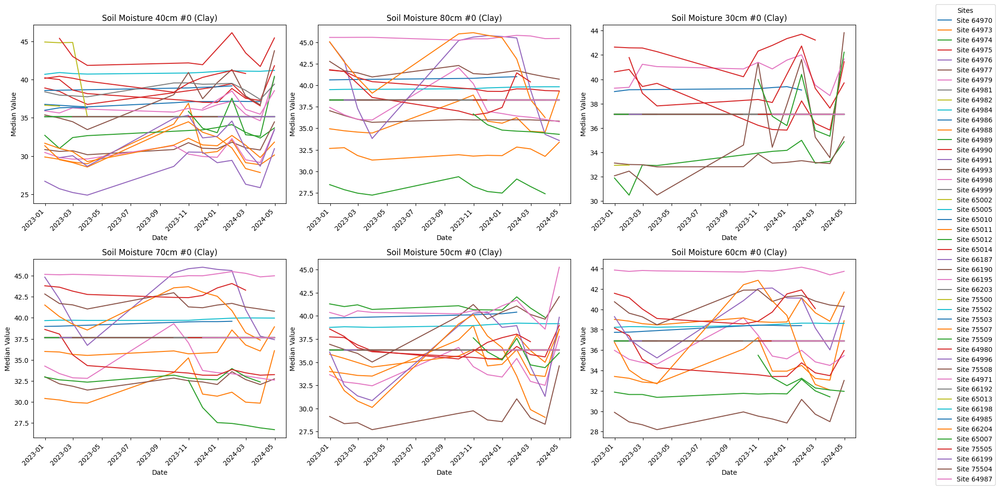

In [ ]:
# Function for Time series
def plot_filtered_medians(dataframe, measures, title):
    if not measures:
        print("No measures provided.")
        return

    filtered_data = dataframe[['datetime', 'site_id'] + measures]
    monthly_medians = filtered_data.groupby(['site_id', pd.Grouper(key='datetime', freq='M')]).median().reset_index()
    num_plots = len(measures)
    num_rows = math.ceil(num_plots / 3)
    num_cols = min(3, max(1, num_plots))
    fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 5 * num_rows), squeeze=False)

    unique_sites = dataframe['site_id'].unique()
    line_objects = {} # Create one legend
    for i, measure in enumerate(measures):
        row, col = i // 3, i % 3
        ax = axs[row, col] if num_rows > 1 else axs[col]
        for site in unique_sites:
            site_data = monthly_medians[(monthly_medians['site_id'] == site) & (monthly_medians[measure].notna())]
            if not site_data.empty:
                line, = ax.plot(site_data['datetime'], site_data[measure], label=f'Site {site}')
                if site not in line_objects:
                    line_objects[site] = line  # each site

        ax.set_title(f'{measure}')
        ax.set_xlabel('Date')
        ax.set_ylabel('Median Value')

    for ax in fig.axes:
        plt.setp(ax.get_xticklabels(), rotation=45, ha='right')

    fig.legend(handles=line_objects.values(), labels=[f'Site {site}' for site in unique_sites], loc='center right', bbox_to_anchor=(1.05, 0.5), ncol=1, title="Sites")
    plt.tight_layout()
    plt.subplots_adjust(right=0.9)
    plt.show()

plot_filtered_medians(df_merged, clay_measures, "Monthly Median Values for Clay Measures")


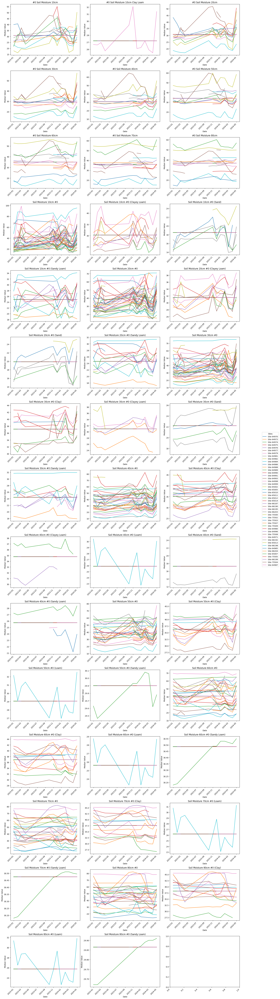

In [ ]:
# moisture_measures
moisture_measures = [col for col in df_merged.columns if 'Moisture' in col]
plot_filtered_medians(df_merged, moisture_measures, "Monthly Median Values for Moisture Measures")

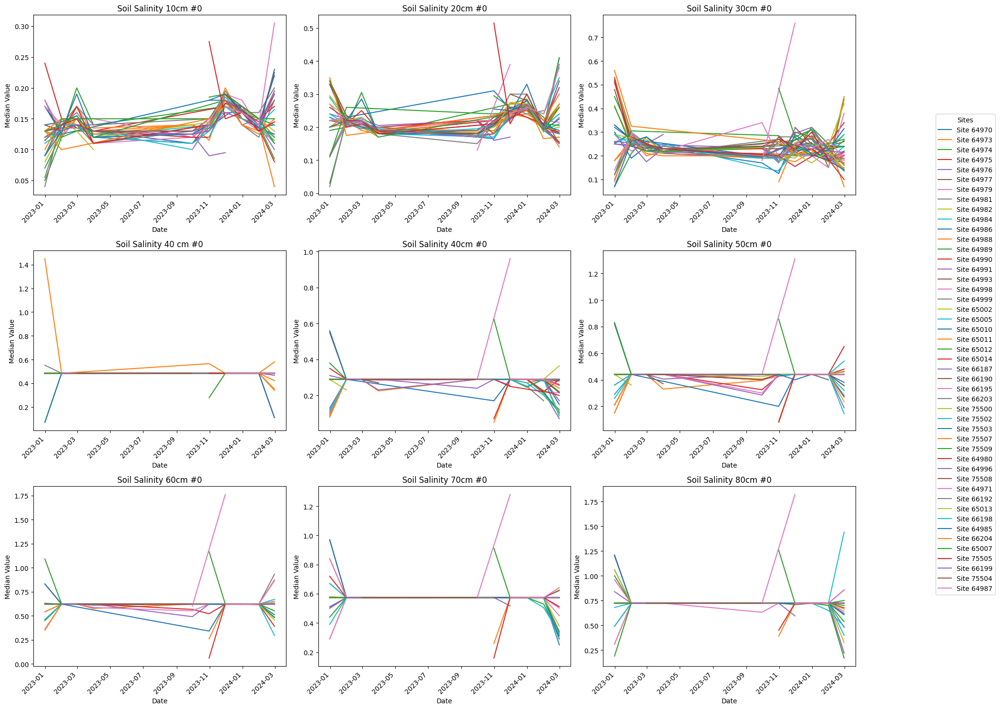

In [ ]:
# salinity_measures
salinity_measures = [col for col in df_merged.columns if 'Salinity' in col]
plot_filtered_medians(df_merged, salinity_measures, "Monthly Median Values for Salinity Measures")

### Soil data Reshape (interpolate) using Pivot table
- interpolate(method='time') fills missing values based on linear interpolation over time.

In [ ]:
# Pivot table - reshape data
pivoted_data = soil_co2_sensor_data.pivot_table(index='datetime', columns='probe_measure', values='soil_value', aggfunc='first')
pivoted_data.interpolate(method='time', inplace=True)
print(pivoted_data.head())

probe_measure        #0 Soil Moisture 10cm  #0 Soil Moisture 10cm Clay Loam  \
datetime                                                                      
2022-12-31 13:00:00                  22.28                        26.680000   
2022-12-31 15:00:00                  28.94                        26.640000   
2022-12-31 17:00:00                  17.98                        26.690000   
2022-12-31 19:00:00                  21.56                        26.654286   
2022-12-31 21:00:00                  21.05                        26.618571   

probe_measure        #0 Soil Moisture 20cm  #0 Soil Moisture 30cm  \
datetime                                                            
2022-12-31 13:00:00                  28.21                  15.54   
2022-12-31 15:00:00                  28.20                  30.04   
2022-12-31 17:00:00                  26.11                  17.92   
2022-12-31 19:00:00                  26.08                  17.90   
2022-12-31 21:00:00             

## Soil Data Principal Component Analysis (PCA)
- Aim to find patterns in the dataset.
- Reduce dimensionality of the data to visualize the principal components that explain the most variance.
<br>
- Data is standardised (fit_transform()) scales data to zero mean variance, missing values are replaced with 0s.
<br>

##### PCA Filling
- n_component=2 reduce the dimensionality of the data to two principal compaonents.
- data_scaled computes first two prinicpal components (reducing dimensionality while trying to preseve information).

##### Plot PCA
- Scatter plot to visualise (each point represents datetime entry in original dataset)

##### Overview
- PC1 highest variance in the data.
- PC2 next most significant relationship (independent to PC1).
- Each variable (soil measurement at various depths and types)
- `components_` hold the loadings. Each row in components_ corresponds to one principal component, and each column relates to one original variable.

##### Analyse
- soil moisture measurements at different depths have varying influences on PC1 and PC2.
-  "Soil Temperature 10cm #0" has a negative loading on PC1 (-0.103474) and a significant positive loading on PC2 (0.252541), suggesting that this variable moves inversely
- "Soil Moisture 10cm #0 (Sand)" has a high positive loading on PC1 (0.188933), indicating a strong positive correlation with this principal component.
- However, PC2 is minor (-0.020983), suggesting a smaller influence on this component.

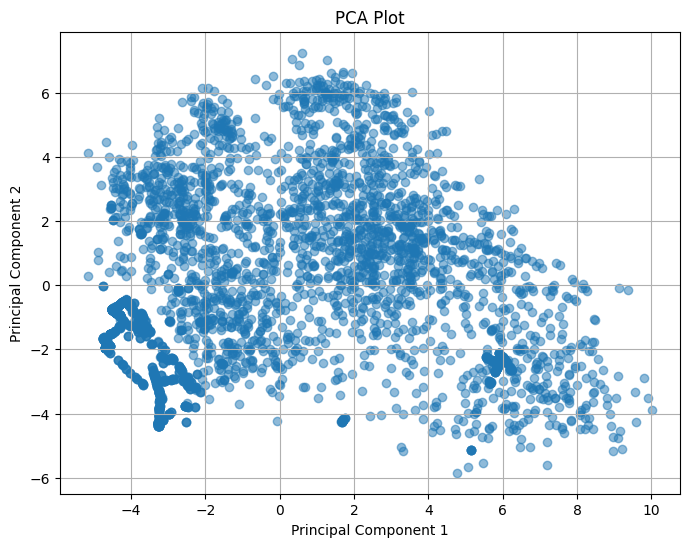

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardise Soil data
data_scaled = StandardScaler().fit_transform(pivoted_data.fillna(0))

# Fitting PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(data_scaled)

# Plotting the first two principal components
plt.figure(figsize=(8, 6))
plt.scatter(principal_components[:, 0], principal_components[:, 1], alpha=0.5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Plot')
plt.grid(True)
plt.show()


In [ ]:
# Get the loadings
loadings = pca.components_

# If you want to view them as a DataFrame to clearly see which loading corresponds to which original variable
import pandas as form
loadings_df = pd.DataFrame(data=loadings, columns=pivoted_data.columns, index=['PC1', 'PC2'])
print(loadings_df)

probe_measure  #0 Soil Moisture 10cm  #0 Soil Moisture 10cm Clay Loam  \
PC1                         0.158528                         0.189372   
PC2                         0.056405                        -0.065446   

probe_measure  #0 Soil Moisture 20cm  #0 Soil Moisture 30cm  \
PC1                         0.177763               0.172261   
PC2                        -0.012268              -0.031844   

probe_measure  #0 Soil Moisture 40cm  #0 Soil Moisture 50cm  \
PC1                         0.145901               0.099391   
PC2                        -0.058796              -0.082354   

probe_measure  #0 Soil Moisture 60cm  #0 Soil Moisture 70cm  \
PC1                        -0.026400              -0.063232   
PC2                         0.054952               0.086618   

probe_measure  #0 Soil Moisture 80cm  Soil Moisture 10cm #0  \
PC1                        -0.078125              -0.052142   
PC2                         0.077560              -0.169513   

probe_measure  Soil 

### PCA Examination
- How much variance each prinipal component captures
- Scree Plot - importance of successive principal components
- Biplot - Both scores mapped
- Correlation Matrix

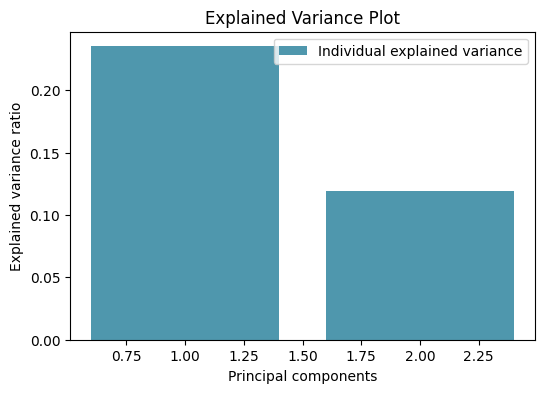

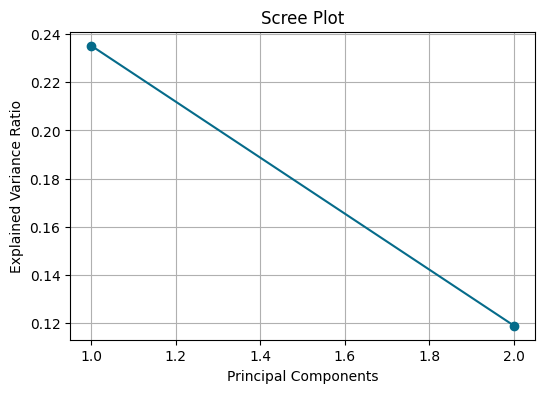

In [ ]:
# PCA Examination
# Explained variance ratio
explained_variance = pca.explained_variance_ratio_

# How much variance each prinipal component captures
plt.figure(figsize=(6, 4))
plt.bar(range(1, len(explained_variance)+1), explained_variance, alpha=0.7, color=color_d[3], label='Individual explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components')
plt.title('Explained Variance Plot')
plt.legend()
plt.show()

#Scree Plot - importance of successive principal components
plt.figure(figsize=(6, 4))
plt.plot(range(1, len(explained_variance)+1), explained_variance, 'o-', color=color_d[3])
plt.title('Scree Plot')
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.grid(True)
plt.show()

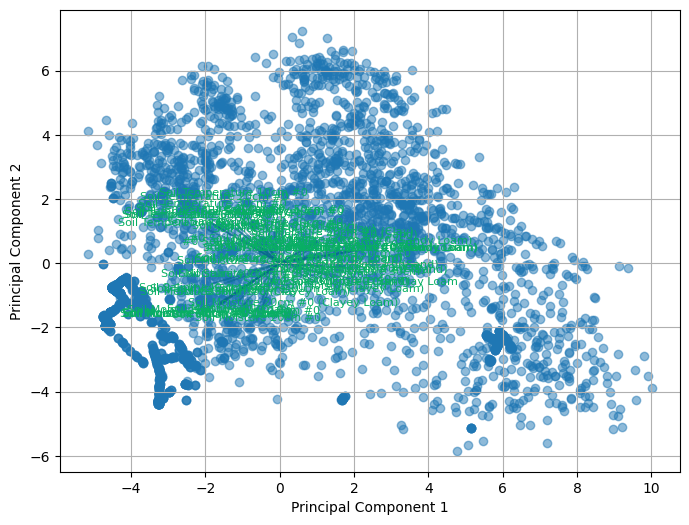

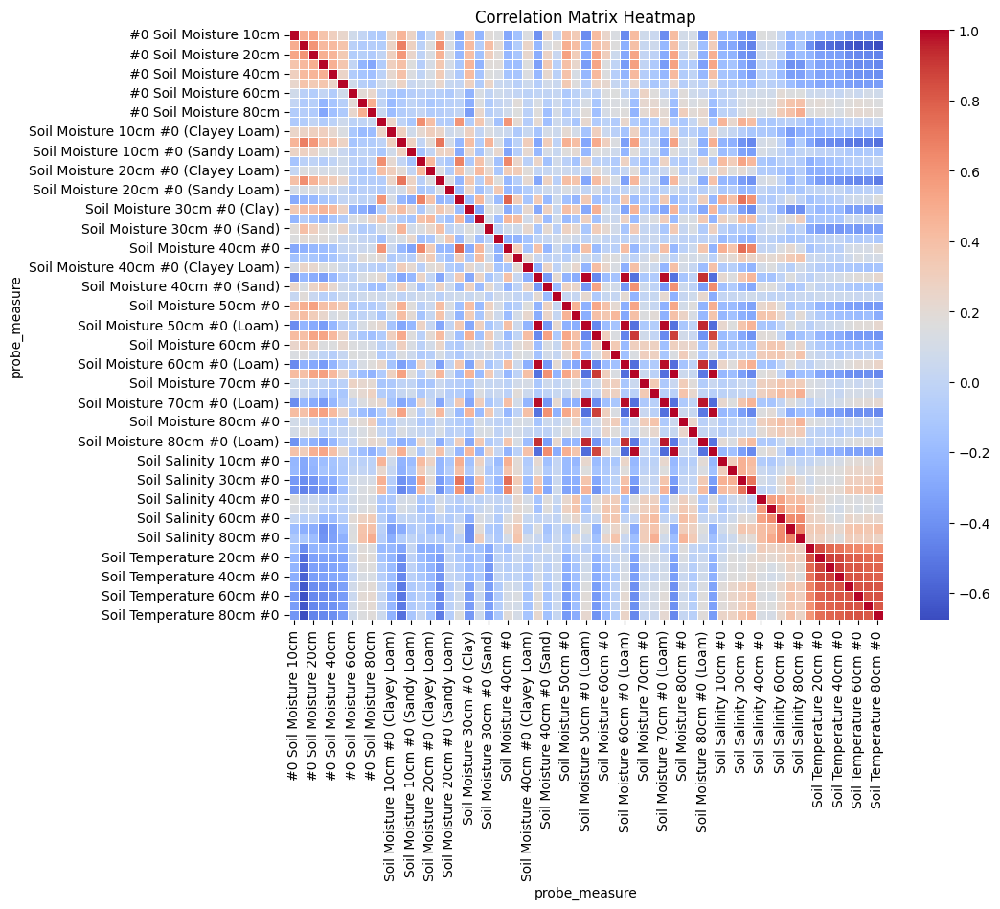

In [ ]:
# Biplot - Both scores mapped
plt.figure(figsize=(8, 6))
plt.scatter(principal_components[:, 0], principal_components[:, 1], alpha=0.5)
for i, v in enumerate(pivoted_data.columns):
    plt.arrow(0, 0, pca.components_[0, i]*max(principal_components[:, 0]),
              pca.components_[1, i]*max(principal_components[:, 1]), color= color_d[3], alpha=0.5)
    plt.text(pca.components_[0, i]*max(principal_components[:, 0])*1.2,
             pca.components_[1, i]*max(principal_components[:, 1])*1.2, v, color=color_d[0], ha='center', va='center', fontsize=8)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()


# Correlation matrix
corr_matrix = pivoted_data.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Matrix Heatmap')
plt.show()


## Examine Median Values Soil probe measures

In [ ]:
# Find median each type of probe measure
median_values = pivoted_data.median()

# Median values correlation analysis
median_df = pd.DataFrame(median_values, columns=['median_value'])
median_df['probe_measure'] = median_df.index
print("Median values by probe_measure:")
print(median_df)

Median values by probe_measure:
                                 median_value                    probe_measure
probe_measure                                                                 
#0 Soil Moisture 10cm               26.969500            #0 Soil Moisture 10cm
#0 Soil Moisture 10cm Clay Loam     26.150000  #0 Soil Moisture 10cm Clay Loam
#0 Soil Moisture 20cm               27.930000            #0 Soil Moisture 20cm
#0 Soil Moisture 30cm               24.108267            #0 Soil Moisture 30cm
#0 Soil Moisture 40cm               25.250000            #0 Soil Moisture 40cm
...                                       ...                              ...
Soil Temperature 40cm #0            18.690000         Soil Temperature 40cm #0
Soil Temperature 50cm #0            18.840000         Soil Temperature 50cm #0
Soil Temperature 60cm #0            18.736201         Soil Temperature 60cm #0
Soil Temperature 70cm #0            18.710000         Soil Temperature 70cm #0
Soil Temperature 80c

### Correlation Between Median Values (soil values)

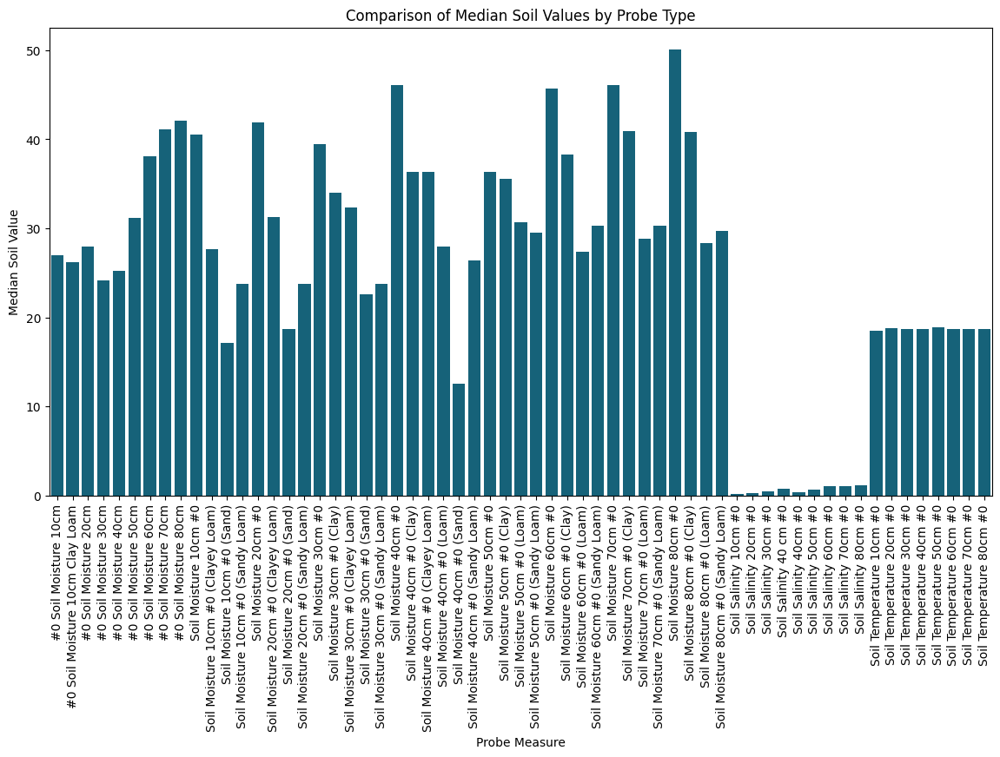

In [ ]:
# Convert median_df
median_df = pd.DataFrame(median_values, columns=['median_value'])
median_df['probe_measure'] = median_df.index

# Plot
plt.figure(figsize=(14, 7))
sns.barplot(x='probe_measure', y='median_value', data=median_df.reset_index(drop=True), color=color_d[3])
plt.xticks(rotation=90)
plt.xlabel('Probe Measure')
plt.ylabel('Median Soil Value')
plt.title('Comparison of Median Soil Values by Probe Type')
plt.show()

# User Interface - View Soil depth, Moisture, Salinity and Temperature

# Soil Stats
#### Filter based on
1. Soil type
2. Soil depth
3. Measurement type (such as moisture, temperature, salinity).
<br>

##### For each soil type (Sandy Loam, Clay, Clayey Loam, and Sand)
* 		Soil Moisture: Measures the amount of water held in the soil, which can impact soil chemistry, plant growth, and microorganism activity.
* 		Soil Salinity: Indicates the salt content in the soil, which affects the soil's ability to hold water and nutrients. High salinity can be detrimental to most plants.
* 		Soil Temperature: Reflects the heat within the soil, which influences plant root growth and microbial activity.

In [ ]:
pivoted_data.head()

probe_measure,#0 Soil Moisture 10cm,#0 Soil Moisture 10cm Clay Loam,#0 Soil Moisture 20cm,#0 Soil Moisture 30cm,#0 Soil Moisture 40cm,#0 Soil Moisture 50cm,#0 Soil Moisture 60cm,#0 Soil Moisture 70cm,#0 Soil Moisture 80cm,Soil Moisture 10cm #0,Soil Moisture 10cm #0 (Clayey Loam),Soil Moisture 10cm #0 (Sand),Soil Moisture 10cm #0 (Sandy Loam),Soil Moisture 20cm #0,Soil Moisture 20cm #0 (Clayey Loam),Soil Moisture 20cm #0 (Sand),Soil Moisture 20cm #0 (Sandy Loam),Soil Moisture 30cm #0,Soil Moisture 30cm #0 (Clay),Soil Moisture 30cm #0 (Clayey Loam),Soil Moisture 30cm #0 (Sand),Soil Moisture 30cm #0 (Sandy Loam),Soil Moisture 40cm #0,Soil Moisture 40cm #0 (Clay),Soil Moisture 40cm #0 (Clayey Loam),Soil Moisture 40cm #0 (Loam),Soil Moisture 40cm #0 (Sand),Soil Moisture 40cm #0 (Sandy Loam),Soil Moisture 50cm #0,Soil Moisture 50cm #0 (Clay),Soil Moisture 50cm #0 (Loam),Soil Moisture 50cm #0 (Sandy Loam),Soil Moisture 60cm #0,Soil Moisture 60cm #0 (Clay),Soil Moisture 60cm #0 (Loam),Soil Moisture 60cm #0 (Sandy Loam),Soil Moisture 70cm #0,Soil Moisture 70cm #0 (Clay),Soil Moisture 70cm #0 (Loam),Soil Moisture 70cm #0 (Sandy Loam),Soil Moisture 80cm #0,Soil Moisture 80cm #0 (Clay),Soil Moisture 80cm #0 (Loam),Soil Moisture 80cm #0 (Sandy Loam),Soil Salinity 10cm #0,Soil Salinity 20cm #0,Soil Salinity 30cm #0,Soil Salinity 40 cm #0,Soil Salinity 40cm #0,Soil Salinity 50cm #0,Soil Salinity 60cm #0,Soil Salinity 70cm #0,Soil Salinity 80cm #0,Soil Temperature 10cm #0,Soil Temperature 20cm #0,Soil Temperature 30cm #0,Soil Temperature 40cm #0,Soil Temperature 50cm #0,Soil Temperature 60cm #0,Soil Temperature 70cm #0,Soil Temperature 80cm #0
datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-12-31 13:00:00,22.28,26.680000,28.21,15.54,34.67,30.98,34.14,51.67,35.38,19.77,27.62,16.870000,19.46,26.18,31.35,18.650000,22.11,24.15,39.02,37.230000,21.650000,21.950000,46.97,38.58,31.140000,29.520000,13.080000,27.230000,32.63,39.79,30.78,29.640000,49.62,37.74,27.510000,30.180000,16.25,39.00,28.990000,30.18,54.65,28.46,29.050000,29.67,0.07,0.05,0.39,1.60,0.02,0.06,0.79,0.28,0.31,20.26,20.52,20.63,22.30,21.36,20.87,20.51,19.99
2022-12-31 15:00:00,28.94,26.640000,28.20,30.04,34.65,47.13,41.87,32.78,35.57,20.07,22.92,16.890000,20.77,31.15,30.29,18.630000,25.59,27.59,32.08,26.280000,19.540000,25.150000,12.30,31.34,37.110000,31.850000,13.080000,27.230000,34.08,41.30,33.14,29.630000,41.87,36.77,30.290000,30.180000,58.48,34.26,31.590000,30.18,37.51,28.46,31.490000,29.67,0.14,0.11,0.45,1.46,0.25,0.25,0.36,0.84,0.98,21.81,20.90,20.69,20.52,17.77,19.56,18.13,18.18
2022-12-31 17:00:00,17.98,26.690000,26.11,17.92,34.57,42.47,42.39,54.53,55.72,25.13,23.04,14.640000,30.66,16.07,28.75,15.680000,18.00,30.76,31.79,30.460000,21.600000,28.410000,27.97,31.28,31.030000,30.410000,13.070000,27.220000,38.16,33.97,32.16,29.620000,16.78,33.38,28.740000,30.180000,64.63,34.21,30.760000,30.18,30.18,34.90,31.350000,29.67,0.10,0.31,0.07,0.07,1.34,0.82,0.28,1.04,0.40,22.96,21.01,17.10,20.59,21.31,19.86,18.62,16.98
2022-12-31 19:00:00,21.56,26.654286,26.08,17.90,20.48,30.57,41.54,50.76,55.55,19.49,23.05,16.760000,19.79,26.08,26.02,18.590000,21.57,27.57,32.91,30.452857,19.530000,28.118571,40.52,35.35,31.898571,30.315714,13.100000,27.214286,30.57,36.90,32.11,29.615714,55.02,40.70,28.682857,30.181429,64.34,42.80,30.695714,30.18,64.16,42.76,31.265714,29.67,0.14,0.36,0.32,1.45,0.55,0.82,1.45,1.43,1.89,27.24,25.47,20.04,22.65,20.62,19.86,19.56,19.22
2022-12-31 21:00:00,21.05,26.618571,26.06,17.94,20.43,30.56,41.48,50.56,55.43,20.09,23.02,16.308333,19.65,26.06,26.01,18.466667,21.60,30.83,32.07,30.445714,19.868333,27.827143,36.83,35.32,32.767143,30.221429,13.092857,27.208571,41.40,36.89,32.06,29.611429,54.75,40.64,28.625714,30.182857,50.56,42.77,30.631429,30.18,64.09,42.75,31.181429,29.67,0.09,0.20,0.33,1.46,0.56,0.82,1.45,1.43,1.89,25.87,23.55,20.44,21.23,20.72,19.14,18.63,18.18


In [ ]:
# User interface to view Soil data
pivoted_data_index = pivoted_data.copy()

# Filter columns
def extract_info_from_columns(df):
    types = set()
    depths = set()
    measurements = set()

    col_pattern = r"(Soil \w+) (\d+cm) #\d+( \(([\w ]+)\))?"

    for col in df.columns:
        match = re.match(col_pattern, col)
        if match:
            measurement, depth, _, soil_type = match.groups()
            measurements.add(measurement)
            depths.add(depth)
            if soil_type:
                types.add(soil_type)
            else:
                types.add('General')

    return sorted(types), sorted(depths), sorted(measurements)

types, depths, measurements = extract_info_from_columns(pivoted_data_index)

# Filter data
def filter_data(df, soil_type, depth, measurement):
    regex = f"{measurement} {depth} #\d+"
    if soil_type != 'General':
        regex += f" \({soil_type}\)"
    filtered_df = df.filter(regex=regex)
    return filtered_df

# Drop down
type_selector = widgets.Dropdown(options=types, description='Soil Type:')
depth_selector = widgets.Dropdown(options=depths, description='Depth:')
measurement_selector = widgets.Dropdown(options=measurements, description='Measurement:')
output = widgets.Output()

# Update tables
def update_output(change):
    with output:
        output.clear_output()
        filtered_df = filter_data(pivoted_data_index, type_selector.value, depth_selector.value, measurement_selector.value)
        print(filtered_df)

type_selector.observe(update_output, names='value')
depth_selector.observe(update_output, names='value')
measurement_selector.observe(update_output, names='value')

display(type_selector, depth_selector, measurement_selector, output)


Dropdown(description='Soil Type:', options=('Clay', 'Clayey Loam', 'General', 'Loam', 'Sand', 'Sandy Loam'), v…

Dropdown(description='Depth:', options=('10cm', '20cm', '30cm', '40cm', '50cm', '60cm', '70cm', '80cm'), value…

Dropdown(description='Measurement:', options=('Soil Moisture', 'Soil Salinity', 'Soil Temperature'), value='So…

Output()

# Soil VWC: Volumetric water content - Stats, Time Series

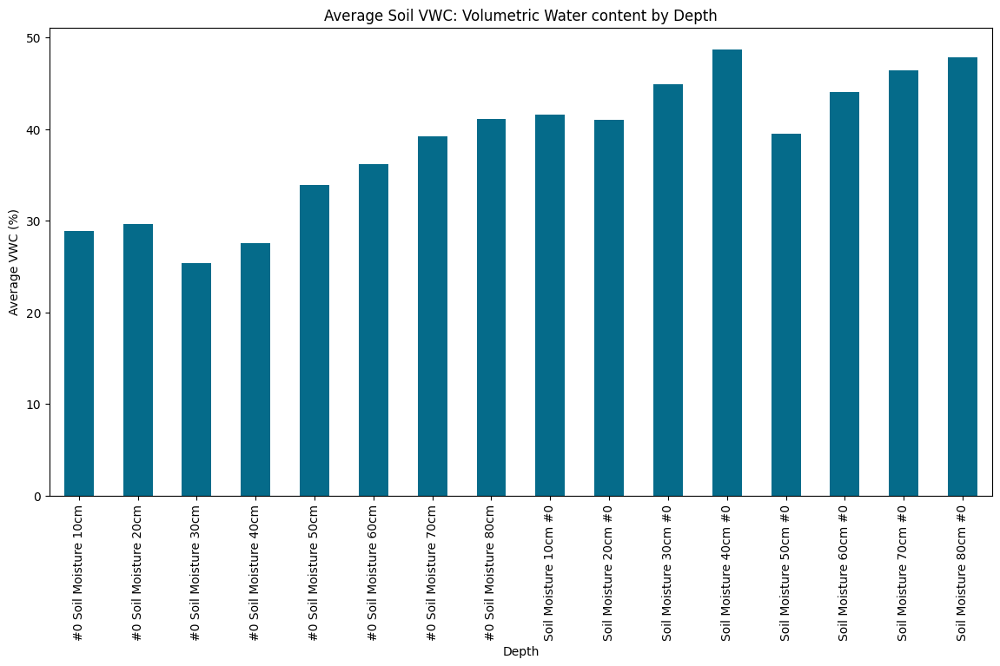

Statistics of VWC: Volumetric Water content Data:
probe_measure  #0 Soil Moisture 10cm  #0 Soil Moisture 20cm  \
count                    3665.000000            3665.000000   
mean                       28.873380              29.589756   
std                         7.856406               6.807928   
min                        14.920000              16.730000   
25%                        22.497868              24.705556   
50%                        26.969500              27.930000   
75%                        33.910000              33.196667   
max                        69.770000              61.190000   

probe_measure  #0 Soil Moisture 30cm  #0 Soil Moisture 40cm  \
count                    3665.000000            3665.000000   
mean                       25.338563              27.530134   
std                         8.353125              10.175964   
min                        12.440000               9.530000   
25%                        17.880000              19.870000   
50% 

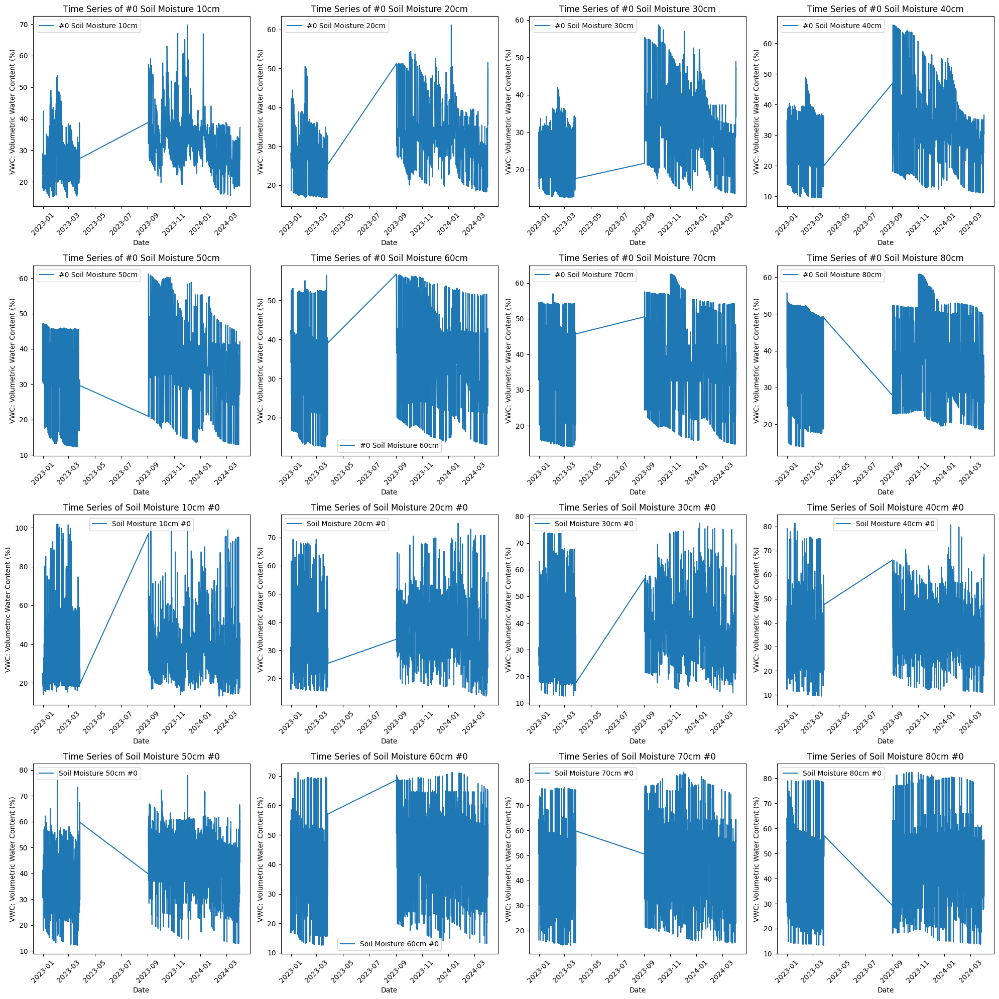

count    16.000000
mean     38.478783
std       7.488125
min      25.338563
25%      32.839250
50%      40.262682
75%      44.268842
max      48.664151
dtype: float64

In [ ]:
# Soil VWC: Volumetric water content
# Regular expression (`regex`) to select columns whose names match the pattern etc "Soil Moisture"
vwc_depths = pivoted_data.filter(regex='Soil Moisture \d+cm').mean(axis=1)
sandy_loam_vwc = pivoted_data.filter(regex='Sandy Loam').mean(axis=1)
average_vwc = pivoted_data.filter(regex='Soil Moisture').mean(axis=1)

# Average soil vwc depth
vwc_cols = [col for col in pivoted_data.columns if "Soil Moisture" in col and not any(x in col for x in ['Clay', 'Loam', 'Sand'])]
average_vwc_by_depth = pivoted_data[vwc_cols].mean()

plt.figure(figsize=(14, 7))
average_vwc_by_depth.plot(kind='bar', color=color_d[3])
plt.title('Average Soil VWC: Volumetric Water content by Depth')
plt.xlabel('Depth')
plt.ylabel('Average VWC (%)')
plt.show()

# Print stats
print("Statistics of VWC: Volumetric Water content Data:")
print(pivoted_data[vwc_cols].describe())

# Graph
plt.figure(figsize=(20, 20))
for i, col in enumerate(vwc_cols):
    plt.subplot(4, 4, i+1)
    plt.plot(pivoted_data[col], label=col)
    plt.title(f'Time Series of {col}')
    plt.xlabel('Date')
    plt.ylabel('VWC: Volumetric Water Content (%)')
    plt.legend()
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

average_vwc_by_depth.describe()

# Soil Temperature - Stats, Time Series

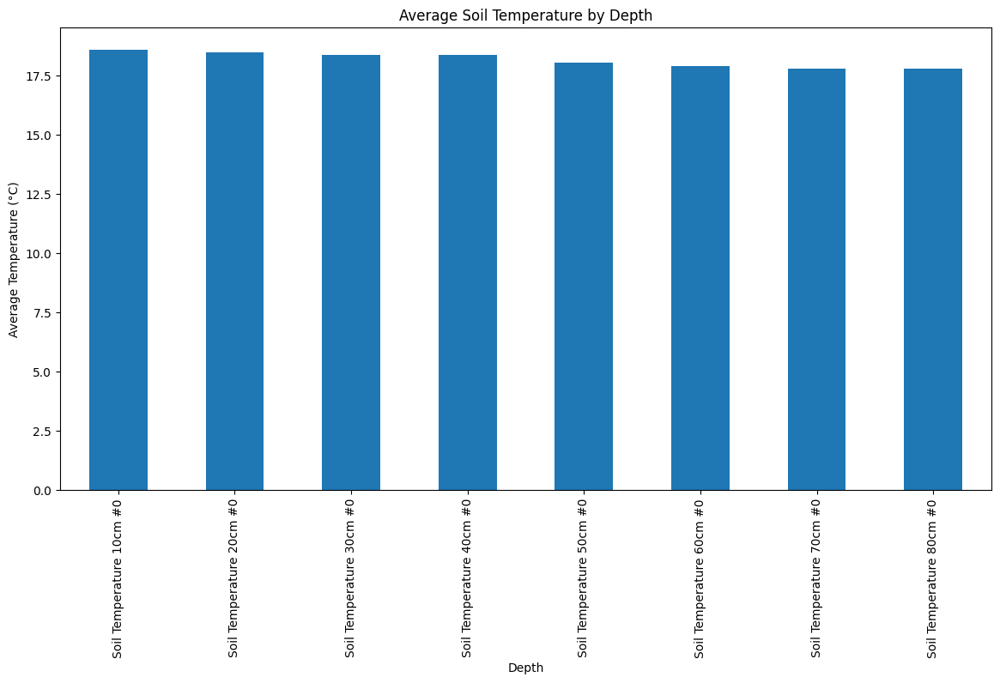

Statistics of Temperature Data:
probe_measure  Soil Temperature 10cm #0  Soil Temperature 20cm #0  \
count                       3665.000000               3665.000000   
mean                          18.608960                 18.506109   
std                            2.816558                  2.393438   
min                            8.430000                  8.690000   
25%                           17.280000                 17.600000   
50%                           18.490000                 18.770000   
75%                           20.190000                 19.940000   
max                           27.960000                 25.470000   

probe_measure  Soil Temperature 30cm #0  Soil Temperature 40cm #0  \
count                       3665.000000               3665.000000   
mean                          18.379256                 18.402152   
std                            2.223136                  2.098157   
min                            9.430000                  9.750000   
2

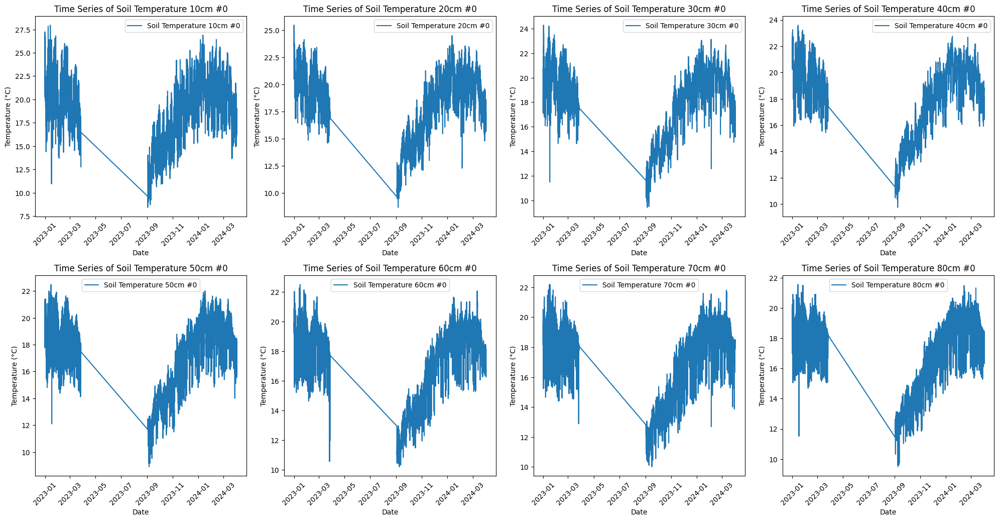

count     8.000000
mean     18.188239
std       0.324306
min      17.797305
25%      17.901997
50%      18.224834
75%      18.428141
max      18.608960
dtype: float64

In [ ]:
# Calculate and print average soil temperature by depth, soil type
temperature_depths = pivoted_data.filter(regex='Soil Temperature \d+cm').mean(axis=1)
sandy_loam_temperature = pivoted_data.filter(regex='Sandy Loam Temperature').mean(axis=1)
average_temperature = pivoted_data.filter(regex='Soil Temperature').mean(axis=1)

temperature_cols = [col for col in pivoted_data.columns if "Soil Temperature" in col and not any(x in col for x in ['Clay', 'Loam', 'Sand'])]
average_temperature_by_depth = pivoted_data[temperature_cols].mean()

plt.figure(figsize=(14, 7))
average_temperature_by_depth.plot(kind='bar')
plt.title('Average Soil Temperature by Depth')
plt.xlabel('Depth')
plt.ylabel('Average Temperature (°C)')
plt.show()

print("Statistics of Temperature Data:")
print(pivoted_data[temperature_cols].describe())
# Time Series of Soil Temperature
plt.figure(figsize=(20, 20))
for i, col in enumerate(temperature_cols):
    plt.subplot(4, 4, i+1)
    plt.plot(pivoted_data[col], label=col)
    plt.title(f'Time Series of {col}')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()
average_temperature_by_depth.describe()

# Soil Salinity - Stats, Time Series

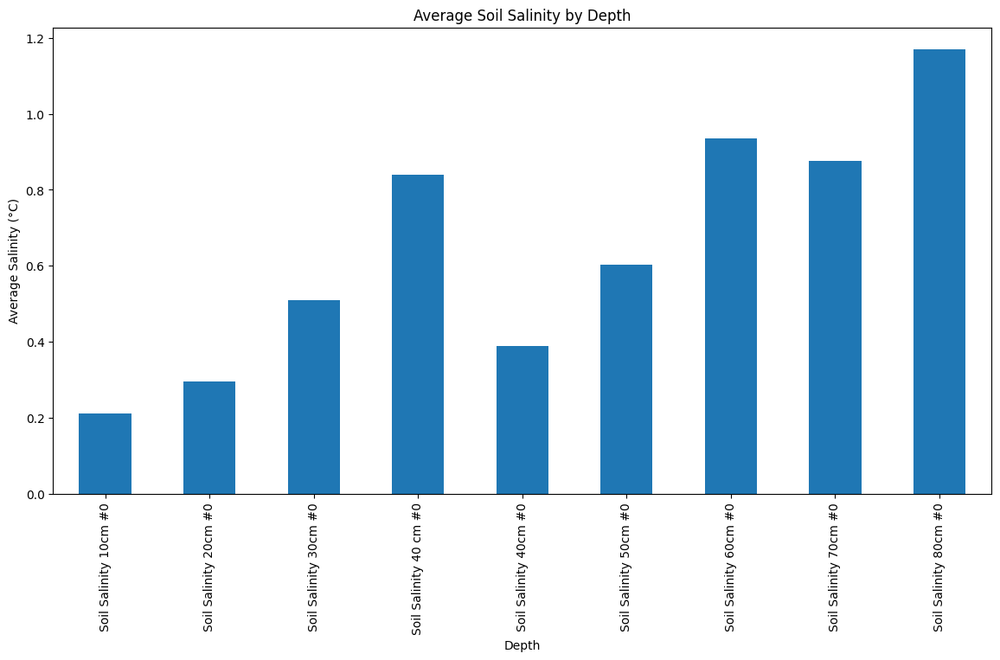

Statistics of Salinity Data:
probe_measure  Soil Salinity 10cm #0  Soil Salinity 20cm #0  \
count                    3665.000000            3665.000000   
mean                        0.211577               0.295087   
std                         0.142127               0.158075   
min                         0.010000               0.010000   
25%                         0.110000               0.180000   
50%                         0.170000               0.300000   
75%                         0.329868               0.390018   
max                         1.480000               1.340000   

probe_measure  Soil Salinity 30cm #0  Soil Salinity 40 cm #0  \
count                    3665.000000             3665.000000   
mean                        0.508213                0.838585   
std                         0.344351                0.619688   
min                         0.020000                0.010000   
25%                         0.200000                0.290000   
50%                

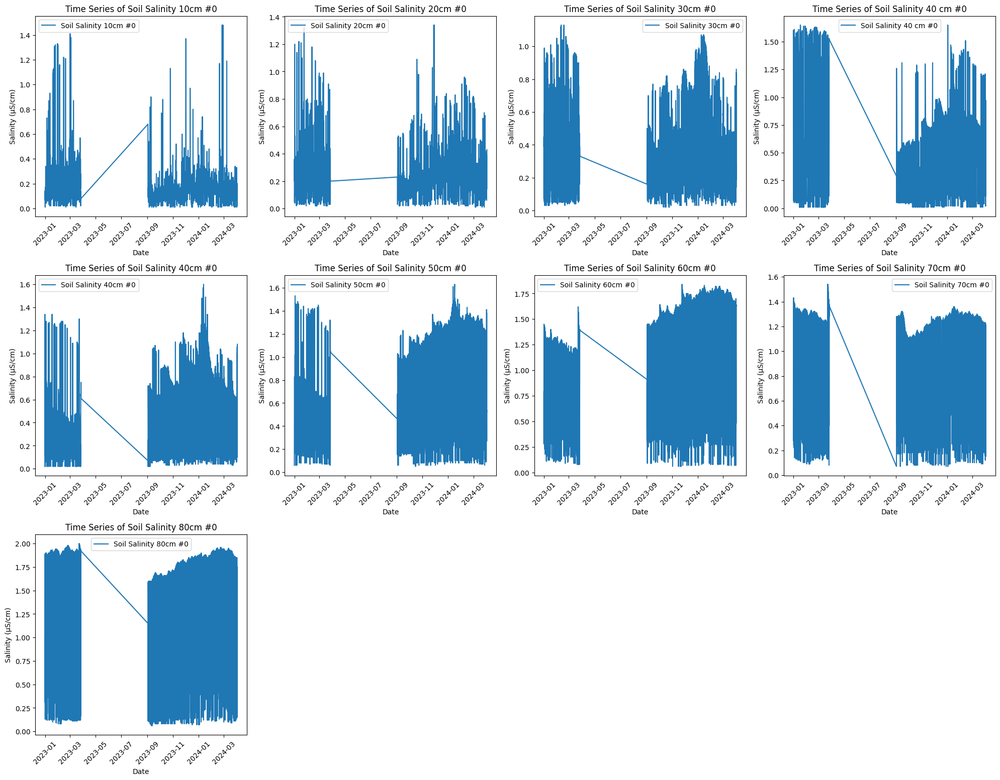

count    9.000000
mean     0.647015
std      0.325289
min      0.211577
25%      0.387922
50%      0.601854
75%      0.876050
max      1.169294
dtype: float64

In [ ]:
# Soil Salinity
salinity_depths = pivoted_data.filter(regex='Soil Salinity \d+cm').mean(axis=1)
sandy_loam_salinity = pivoted_data.filter(regex='Sandy Loam Salinity').mean(axis=1)
average_salinity = pivoted_data.filter(regex='Soil Salinity').mean(axis=1)

salinity_cols = [col for col in pivoted_data.columns if "Soil Salinity" in col and not any(x in col for x in ['Clay', 'Loam', 'Sand'])]
average_salinity_by_depth = pivoted_data[salinity_cols].mean()

plt.figure(figsize=(14, 7))
average_salinity_by_depth.plot(kind='bar')
plt.title('Average Soil Salinity by Depth')
plt.xlabel('Depth')
plt.ylabel('Average Salinity (°C)')
plt.show()

print("Statistics of Salinity Data:")
print(pivoted_data[salinity_cols].describe())

# Time Series of Soil Salinity
plt.figure(figsize=(20, 20))
for i, col in enumerate(salinity_cols):
    plt.subplot(4, 4, i+1)
    plt.plot(pivoted_data[col], label=col)
    plt.title(f'Time Series of {col}')
    plt.xlabel('Date')
    plt.ylabel('Salinity (µS/cm)')
    plt.legend()
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()
average_salinity_by_depth.describe()

# MicroLab and Soil Data Pre-Processing & Normalisation
- temperature, humidity, light, co2, soil_values

In [ ]:
# Load the DataFrames from CSV files
microclimate_sensor_cleaned = pd.read_csv('/content/drive/My Drive/sit378_eco_metrix/microclimate_sensor_cleaned.csv')
microlabs_co2_sensor_data_cleaned = pd.read_csv('/content/drive/My Drive/sit378_eco_metrix/microlabs_co2_sensor_data_cleaned.csv')
df_soil_sensor_data_cleaned = pd.read_csv('/content/drive/My Drive/sit378_eco_metrix/df_soil_sensor_data_cleaned.csv')


In [ ]:
soil_co2_sensor_data.head()

,datetime,site_id,id,probe_measure,soil_value,unit,latitude_x,longitude_x,location,time_x,date_x,dev_id,time_y,temperature,humidity,light,motion,visit,vdd,lat_long,co2,latitude_y,longitude_y,date_y
0,2022-12-31 13:00:00,64979,15522826,Soil Moisture 50cm #0,32.63,%VWC,-37.80170,144.97138,"-37.801699999983285, 144.9713799999935",13:00:00,2022-12-31,ers-co2-9da0,13:00:46,24.5,61,0.0,0,0,3656,"-37.8133183, 144.9668853",416.0,-37.813318,144.966885,2022-12-31
1,2022-12-31 13:00:00,66195,15522987,Soil Temperature 50cm #0,21.36,ºC,-37.82073,144.97254,"-37.82072999998553, 144.97253999999268",13:00:00,2022-12-31,ers-co2-9da0,13:00:46,24.5,61,0.0,0,0,3656,"-37.8133183, 144.9668853",416.0,-37.813318,144.966885,2022-12-31
2,2022-12-31 13:00:00,64976,15515162,Soil Salinity 20cm #0,0.05,µS/cm,-37.78292,144.95566,"-37.78291999998904, 144.95566000000628",13:00:00,2022-12-31,ers-co2-9da0,13:00:46,24.5,61,0.0,0,0,3656,"-37.8133183, 144.9668853",416.0,-37.813318,144.966885,2022-12-31
3,2022-12-31 13:00:00,64986,15521623,Soil Moisture 50cm #0,51.39,%VWC,-37.82921,144.97348,"-37.8292099999859, 144.97347999998564",13:00:00,2022-12-31,ers-co2-9da0,13:00:46,24.5,61,0.0,0,0,3656,"-37.8133183, 144.9668853",416.0,-37.813318,144.966885,2022-12-31
4,2022-12-31 13:00:00,64979,15514301,Soil Temperature 30cm #0,20.63,ºC,-37.80170,144.97138,"-37.801699999983285, 144.9713799999935",13:00:00,2022-12-31,ers-co2-9da0,13:00:46,24.5,61,0.0,0,0,3656,"-37.8133183, 144.9668853",416.0,-37.813318,144.966885,2022-12-31


In [ ]:
# Date Time
soil_co2_sensor_data['date_x'] = pd.to_datetime(soil_co2_sensor_data['date_x']).dt.date
soil_co2_sensor_data['datetime'] = pd.to_datetime(soil_co2_sensor_data['date_x'].astype(str) + ' ' + soil_co2_sensor_data['time_x'].astype(str))


In [ ]:
# Normalise
from sklearn.preprocessing import MinMaxScaler
soil_co2_sensor_data_norm = soil_co2_sensor_data.copy()
soil_co2_sensor_data_norm['date_x'] = pd.to_datetime(soil_co2_sensor_data_norm['date_x']).dt.date
soil_co2_sensor_data_norm['datetime'] = pd.to_datetime(soil_co2_sensor_data_norm['date_x'].astype(str) + ' ' + soil_co2_sensor_data_norm['time_x'].astype(str))
features_to_normalize = ['temperature', 'humidity', 'light', 'co2', 'soil_value']
scaler = MinMaxScaler()
soil_co2_sensor_data_norm[features_to_normalize] = scaler.fit_transform(soil_co2_sensor_data_norm[features_to_normalize])
print(soil_co2_sensor_data_norm.head())

             datetime  site_id        id             probe_measure  \
0 2022-12-31 13:00:00    64979  15522826     Soil Moisture 50cm #0   
1 2022-12-31 13:00:00    66195  15522987  Soil Temperature 50cm #0   
2 2022-12-31 13:00:00    64976  15515162     Soil Salinity 20cm #0   
3 2022-12-31 13:00:00    64986  15521623     Soil Moisture 50cm #0   
4 2022-12-31 13:00:00    64979  15514301  Soil Temperature 30cm #0   

   soil_value   unit  latitude_x  longitude_x  \
0    0.310851   %VWC   -37.80170    144.97138   
1    0.203487     ºC   -37.82073    144.97254   
2    0.000476  µS/cm   -37.78292    144.95566   
3    0.489568   %VWC   -37.82921    144.97348   
4    0.196532     ºC   -37.80170    144.97138   

                                 location    time_x      date_x        dev_id  \
0  -37.801699999983285, 144.9713799999935  13:00:00  2022-12-31  ers-co2-9da0   
1  -37.82072999998553, 144.97253999999268  13:00:00  2022-12-31  ers-co2-9da0   
2  -37.78291999998904, 144.95566000000628

In [ ]:
# # drop nearest_co2_index
# soil_co2_sensor_data_norm = soil_co2_sensor_data_norm.drop('nearest_co2_index', axis=1)

### Temperature, CO2 and Soil Value Level over Time

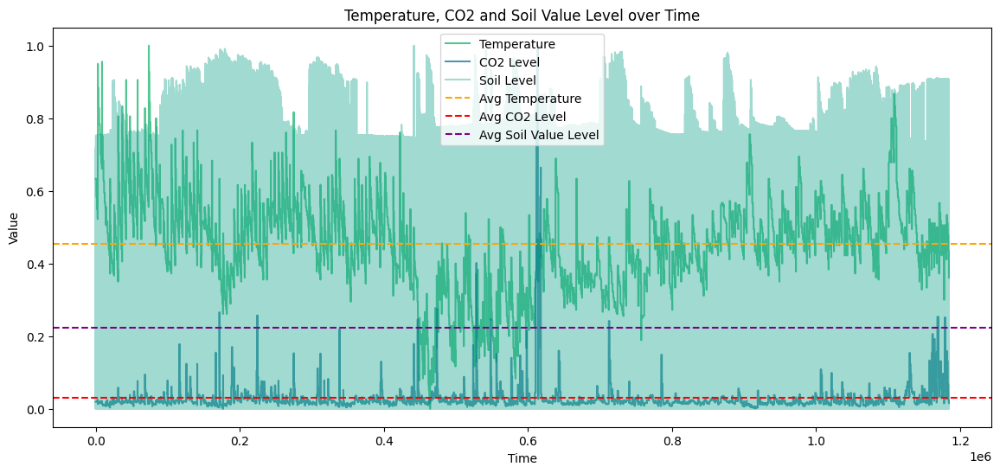

In [ ]:
# Plot Temp, Co2 and Soil Value Time Series
plt.figure(figsize=(14, 6))

plt.plot(soil_co2_sensor_data_norm['temperature'], label='Temperature', color=color_d[0], alpha=0.7)
plt.plot(soil_co2_sensor_data_norm['co2'], label='CO2 Level', color=color_d[3], alpha=0.7)
plt.plot(soil_co2_sensor_data_norm['soil_value'], label='Soil Level', color=color_d[1], alpha=0.4)
plt.axhline(soil_co2_sensor_data_norm['temperature'].mean(), color='orange', linestyle='--', label='Avg Temperature')
plt.axhline(soil_co2_sensor_data_norm['co2'].mean(), color='red', linestyle='--', label='Avg CO2 Level')
plt.axhline(soil_co2_sensor_data_norm['soil_value'].mean(), color='purple', linestyle='--', label='Avg Soil Value Level')

plt.xlabel('Time')
plt.ylabel('Value')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('Temperature, CO2 and Soil Value Level over Time')
plt.legend()

plt.show()

### Daily Means of Temperature, Humidity, Light, CO2, and soil_value

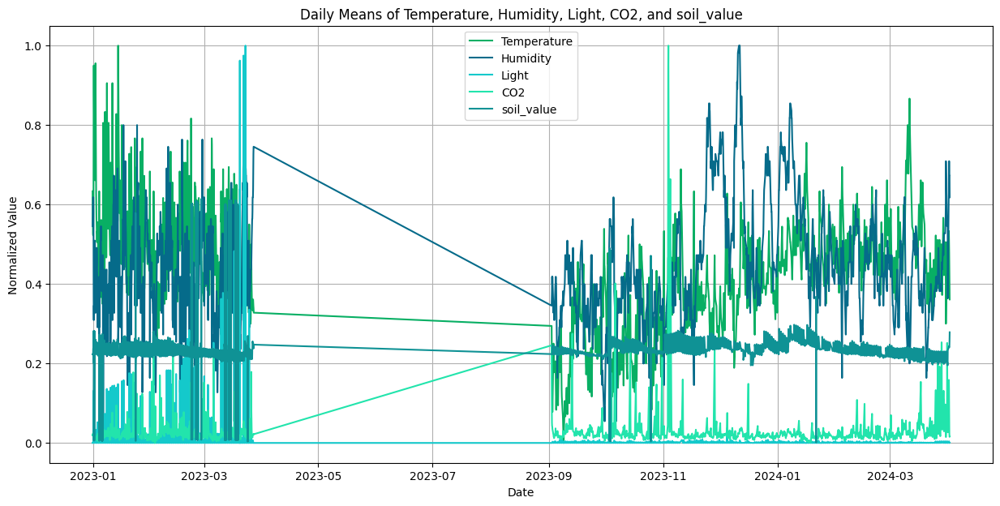

In [ ]:
# Find daily means for the numeric columns only
daily_means = soil_co2_sensor_data_norm.groupby('datetime')[features_to_normalize].mean()
plt.figure(figsize=(15, 7))

plt.plot(daily_means.index, daily_means['temperature'], label='Temperature', color=color_d[0])
plt.plot(daily_means.index, daily_means['humidity'], label='Humidity', color=color_d[3])
plt.plot(daily_means.index, daily_means['light'], label='Light', color=color_l[3])
plt.plot(daily_means.index, daily_means['co2'], label='CO2', color=color_l[1])
plt.plot(daily_means.index, daily_means['soil_value'], label='soil_value', color=color_d[2])
plt.title('Daily Means of Temperature, Humidity, Light, CO2, and soil_value')
plt.xlabel('Date')
plt.ylabel('Normalized Value')
plt.legend()
plt.grid(True)
plt.show()

color_original = color_d[2]
color_locf = color_d[1]


### Correlation Analysis To see how different variables relate to each other

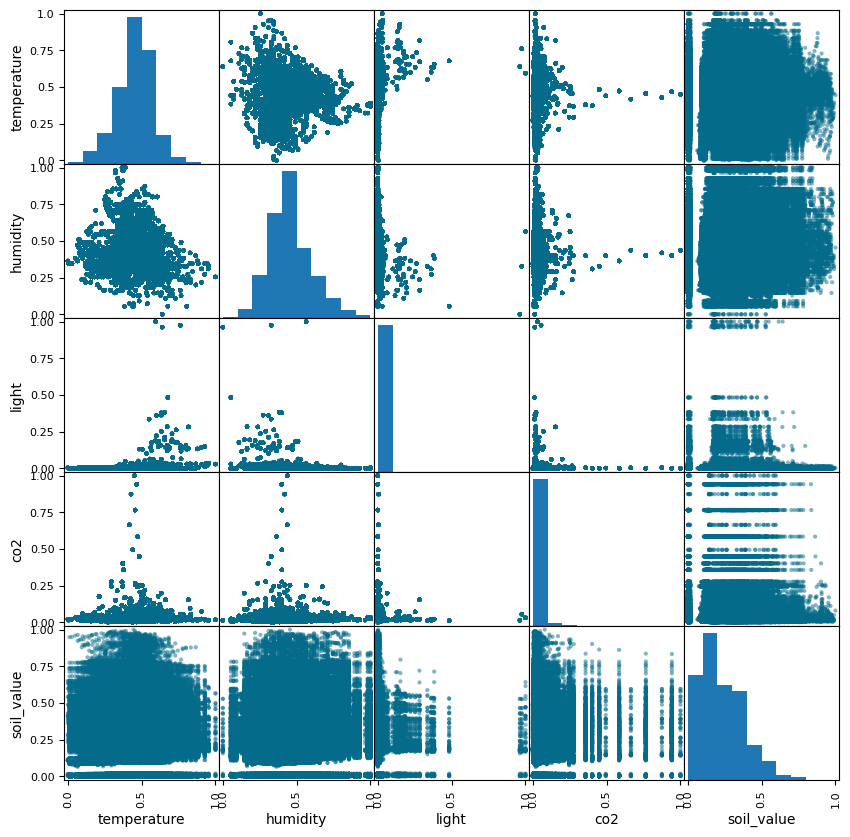

In [ ]:
# Correlation Analysis To see how different variables relate to each other
pd.plotting.scatter_matrix(soil_co2_sensor_data_norm[['temperature', 'humidity', 'light', 'co2', 'soil_value']], color=color_d[3], figsize=(10, 10))
plt.show()

### Correlation Heat Map
- ['soil_value', 'temperature', 'humidity', 'light', 'motion', 'vdd', 'co2']
-  Ref https://python-graph-gallery.com/92-control-color-in-seaborn-heatmaps/

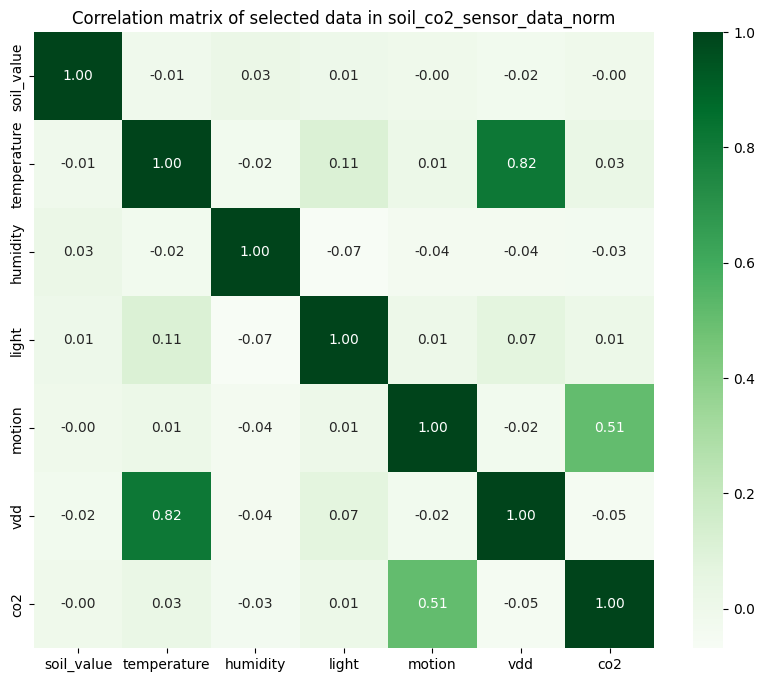

In [ ]:
# Heat Map for Correlation
columns_to_include = ['soil_value', 'temperature', 'humidity', 'light', 'motion', 'vdd', 'co2']
numeric_data = soil_co2_sensor_data_norm[columns_to_include]
correlation_matrix = numeric_data.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='Greens', fmt=".2f")
plt.title('Correlation matrix of selected data in soil_co2_sensor_data_norm')
plt.show()

### Correlations between variables - Scatter Plot
- ['soil_value', 'temperature', 'humidity', 'light', 'motion', 'vdd', 'co2']

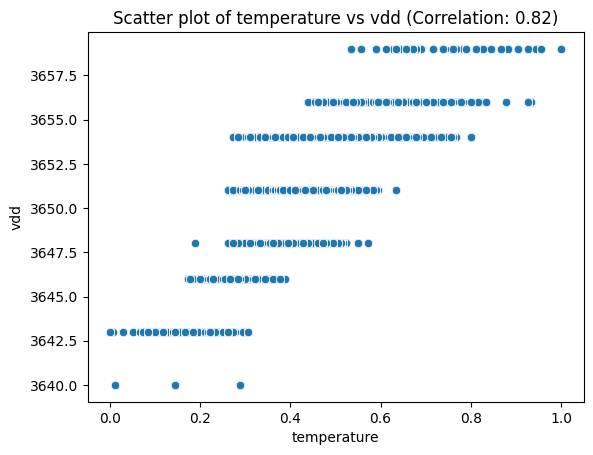

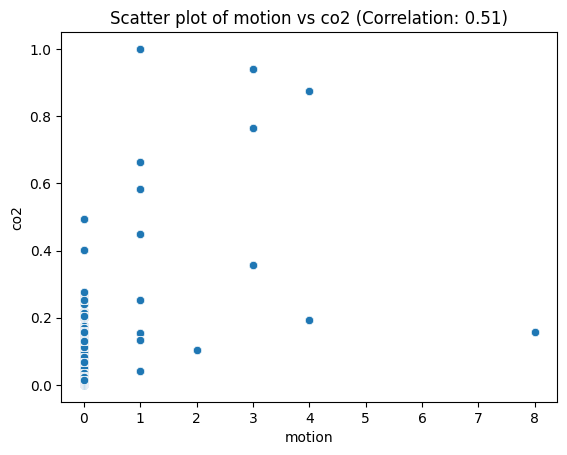

In [ ]:
# check correlations between variables
variables_to_check = ['soil_value', 'temperature', 'humidity', 'light', 'motion', 'vdd', 'co2']

# Scatter plots
for i in range(len(variables_to_check)):
    for j in range(i + 1, len(variables_to_check)):
        # Check Correlation Coefficient
        corr_coeff = numeric_data[variables_to_check[i]].corr(numeric_data[variables_to_check[j]])
        if abs(corr_coeff) > 0.5:
            sns.scatterplot(data=numeric_data, x=variables_to_check[i], y=variables_to_check[j])
            plt.title(f'Scatter plot of {variables_to_check[i]} vs {variables_to_check[j]} (Correlation: {corr_coeff:.2f})')
            plt.show()


In [ ]:
from scipy.stats import pearsonr, spearmanr

# Pearson correlation test
stat, p = pearsonr(numeric_data['temperature'], numeric_data['co2'])
print(f'Pearson correlation between temperature and CO2: Stat={stat:.3f}, p={p:.3f}')

# Spearman correlation test
stat, p = spearmanr(numeric_data['temperature'], numeric_data['co2'])
print(f'Spearman correlation between temperature and CO2: Stat={stat:.3f}, p={p:.3f}')


Pearson correlation between temperature and CO2: Stat=0.030, p=0.000
Spearman correlation between temperature and CO2: Stat=0.158, p=0.000


### Refelction Pearson & Spearman Correlation
- Both Pearson & Spearman indicate that there is a statistically significant (weak) relationship between temperature and CO2 levels.
- Some changes in temperature have some degree of association with changes in CO2 levels, many other factors are likely influencing CO2 levels as well.

- The impact of temperature on CO2 levels is small, but consistent enough to be statistically significant.

### Granger Causality test (Prepare for ML Modelling)
- Rows = 'caused' variables
- Columns = 'causing' variables.
- A low p-value (typically < 0.05) suggests that the 'causing' variable can predict future values of the 'caused' variable, indicating Granger causality.
- A high p-value (≥0.05) suggests that there is not enough evidence to reject the null hypothesis, implying that the "causing" variable does not have a predictive effect on the "caused" variable.

In [ ]:
from statsmodels.tsa.stattools import grangercausalitytests
# dataset converted to a time series format, indexed by datetime
soil_co2_sensor_data_norm['datetime'] = pd.to_datetime(soil_co2_sensor_data_norm['datetime'])
soil_co2_sensor_data_norm.set_index('datetime', inplace=True)

# Sort the data by datetime just in case it's not sorted
soil_co2_sensor_data_norm.sort_index(inplace=True)

# filter values
data_for_test = soil_co2_sensor_data_norm[['soil_value', 'temperature', 'humidity', 'light', 'motion', 'vdd', 'co2']]

# Granger Causality test
max_lags = 4  # Number of lags

results = pd.DataFrame(index=data_for_test.columns, columns=data_for_test.columns, dtype=float)

for col in data_for_test.columns:
    for row in data_for_test.columns:
        if col != row:  # skip itself / variable
            test_result = grangercausalitytests(data_for_test[[row, col]], maxlag=max_lags, verbose=False)
            # Smallest p-value
            p_values = [round(test_result[i+1][0]['ssr_chi2test'][1], 4) for i in range(max_lags)]
            min_p_value = min(p_values)
            results.loc[row, col] = min_p_value

print(results)

             soil_value  temperature  humidity   light  motion     vdd     co2
soil_value          NaN       0.0000    0.0000  0.0000  0.0000  0.0000  0.0000
temperature      0.0007          NaN    0.0000  0.0016  0.7412  0.0000  0.1245
humidity         0.0747       0.0000       NaN  0.0002  0.8970  0.0187  0.4236
light            0.3656       0.0000    0.0035     NaN  0.5778  0.0000  0.2824
motion           0.0158       0.4526    0.6044  0.6395     NaN  0.2706  0.0000
vdd              0.5401       0.0000    0.8724  0.0000  0.5125     NaN  0.2764
co2              0.0771       0.0003    0.7894  0.2816  0.0000  0.0034     NaN


### Review Granger Causality test
##### Possible Predictors
- Temperature predicts soil_value (p=0.0007), humidity (p=0.0000), light (p=0.0016), and vdd (p=0.0000) but not co2 (p=0.1245).
- CO2 significantly predicts motion (p=0.0000) and vdd (p=0.0034), but has no significance to humidity (p=0.7894) and light (p=0.2816).
- Humidity, Light, Motion, and VDD: mixed results in predicting other variables, where some are significant predictors while others are not.

## Haversine formula calculate distance between sensor locations
- 1.4km distance between microclimate Sensor Microlabs Co2 Senor

In [ ]:
# Map the latitude and longitude from both datasets
import folium
coords_microclimate = [-37.800575, 144.964635]
coords_norm_microlabs = [-37.8133183, 144.9668853]

# Create a map centered around the average of the given coordinates
map_center = [(coords_microclimate[0] + coords_norm_microlabs[0]) / 2,
              (coords_microclimate[1] + coords_norm_microlabs[1]) / 2]
map = folium.Map(location=map_center, zoom_start=14)

# Add markers for each dataset's location
folium.Marker(coords_microclimate, popup='Microclimate Sensor', tooltip='Microclimate Sensor').add_to(map)
folium.Marker(coords_norm_microlabs, popup='Norm Microlabs CO2 Sensor', tooltip='Norm Microlabs CO2 Sensor').add_to(map)
map

In [ ]:
# Haversine formula: Distance between the two sensor locations
def haversine(lat1, lon1, lat2, lon2):
    R = 6371.0 # Radius of the Earth in kilometers

    # Convert lat & long degrees to radians
    lat1_rad, lon1_rad = math.radians(lat1), math.radians(lon1)
    lat2_rad, lon2_rad = math.radians(lat2), math.radians(lon2)
    dlat = lat2_rad - lat1_rad
    dlon = lon2_rad - lon1_rad

    # Haversine formula
    a = math.sin(dlat / 2)**2 + math.cos(lat1_rad) * math.cos(lat2_rad) * math.sin(dlon / 2)**2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    distance = R * c # Distance in kilometers
    return distance

distance = haversine(coords_microclimate[0], coords_microclimate[1],
                     coords_norm_microlabs[0], coords_norm_microlabs[1])

print(f'Distance between Sensor locations: {distance}')

Distance between Sensor locations: 1.4307148758774588


# microclimate_sensor (Review)
- TPH.TEMP	-40.00	85.00	Ambient Air Temperature	°C
- TPH.RH	0.00	100.00	Relative Humidity	%
- TPH.PRESSURE	10.0	2000.0	Barometric Pressure	hPa
- PM2.5	0.0	999.9	Mass density of particles in the air smaller than 2.5 micrometers in diameter	μg/m3
- PM10	0.0	1999.9	Mass density of particles in the air smaller than 10 micrometers in diameter	μg/m3
- WS	0.00	160.00	Average Wind Speed	km/h




In [ ]:
# Create date column
microclimate_sensor_cleaned['time'] = pd.to_datetime(microclimate_sensor_cleaned['start_reading'])
microclimate_sensor_cleaned['date'] = microclimate_sensor_cleaned['time'].dt.date

In [ ]:
# Count null values 'id' column
null_ids_count = microclimate_sensor_cleaned['id'].isnull().sum()
print("Number of null values in the 'id' column:", null_ids_count)
null_id_records = microclimate_sensor_cleaned[microclimate_sensor_cleaned['id'].isnull()]
print(null_id_records)

# Drop records null
microclimate_sensor_cleaned = microclimate_sensor_cleaned.dropna(subset=['id'])
null_ids_count_after = microclimate_sensor_cleaned['id'].isnull().sum()
print("Number of null values in the 'id' column after cleaning:", null_ids_count_after)

Number of null values in the 'id' column: 0
Empty DataFrame
Columns: [site_id, gatewayhub_id_x, site_status_x, start_reading, latitude, longitude, location, local_time, id, sensor_id, value, type, units, gatewayhub_id_y, site_status_y, time, date]
Index: []
Number of null values in the 'id' column after cleaning: 0


In [ ]:
unique_site_status_x = microclimate_sensor_cleaned['site_status_x'].unique()
unique_id = microclimate_sensor_cleaned['id'].unique()
unique_type = microclimate_sensor_cleaned['type'].unique()
unique_units = microclimate_sensor_cleaned['units'].unique()
print("Unique site_status_x:", unique_site_status_x)
print("Unique id:", unique_id)
print("Unique type:", unique_type)
print("Unique units:", unique_units)
unique_id

Unique site_status_x: ['C']
Unique id: [8110553. 8110558. 8110562. 8110554. 8110523. 8110532. 8110556. 8110565.
 8110522. 8110549. 8110555. 8110560. 8110564. 8110524. 8110525. 8110534.
 8110548. 8110531. 8110559. 8110563. 8110550. 8110533. 8110551. 8110561.
 8110489. 8110490. 8110500. 8110491. 8110492. 8110499. 8110501. 8110502.
 8110606. 8110576. 8110604. 8110605. 8110569. 8110566. 8110607. 8110567.
 8110594. 8110577. 8110600. 8110609. 8110578. 8110592. 8110597. 8110602.
 8110575. 8110593. 8110598. 8110603. 8110599. 8110608. 8110568. 8110595.]
Unique type: ['TPH.RH' 'TPH.PRESSURE' 'WS' 'PM2.5' 'PM10' 'TPH.TEMP']
Unique units: ['%' 'hPa' 'km/h' 'ug\\/m^3' 'C' 'ug/m^3']


array([8110553., 8110558., 8110562., 8110554., 8110523., 8110532.,
       8110556., 8110565., 8110522., 8110549., 8110555., 8110560.,
       8110564., 8110524., 8110525., 8110534., 8110548., 8110531.,
       8110559., 8110563., 8110550., 8110533., 8110551., 8110561.,
       8110489., 8110490., 8110500., 8110491., 8110492., 8110499.,
       8110501., 8110502., 8110606., 8110576., 8110604., 8110605.,
       8110569., 8110566., 8110607., 8110567., 8110594., 8110577.,
       8110600., 8110609., 8110578., 8110592., 8110597., 8110602.,
       8110575., 8110593., 8110598., 8110603., 8110599., 8110608.,
       8110568., 8110595.])

In [ ]:
microclimate_sensor_cleaned.head()

,site_id,gatewayhub_id_x,site_status_x,start_reading,latitude,longitude,location,local_time,id,sensor_id,value,type,units,gatewayhub_id_y,site_status_y,time,date
0,1011,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222",2023-11-29 22:15:02+00:00,8110553.0,5b,74.38,TPH.RH,%,arc1055,C,2021-07-07,2021-07-07
1,1011,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222",2023-11-29 22:15:02+00:00,8110558.0,5c,1010.80,TPH.PRESSURE,hPa,arc1055,C,2021-07-07,2021-07-07
2,1011,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222",2023-11-29 22:15:03+00:00,8110562.0,6,0.00,WS,km/h,arc1055,C,2021-07-07,2021-07-07
3,1011,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222",2023-11-29 22:30:02+00:00,8110554.0,5b,74.19,TPH.RH,%,arc1055,C,2021-07-07,2021-07-07
4,1011,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222",2023-11-29 22:30:11+00:00,8110523.0,0a,5.90,PM2.5,ug\/m^3,arc1055,C,2021-07-07,2021-07-07


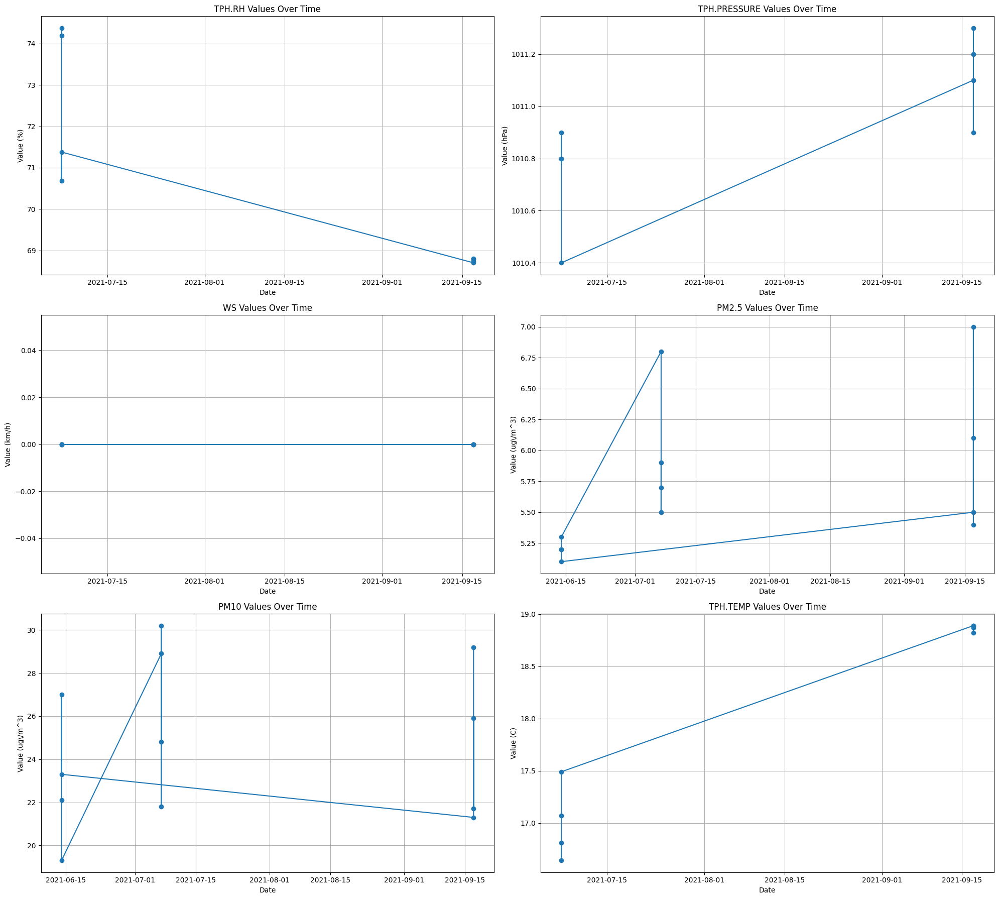

In [ ]:
# Print data from microclimate sensor
unique_types = microclimate_sensor_cleaned['type'].unique()
num_rows = (len(unique_types) + 1) // 2  # +1 to handle odd number of types
fig, axs = plt.subplots(num_rows, 2, figsize=(20, 6 * num_rows))

for i, sensor_type in enumerate(unique_types):
    type_data = microclimate_sensor_cleaned[microclimate_sensor_cleaned['type'] == sensor_type]
    row = i // 2
    col = i % 2
    ax = axs[row, col] if num_rows > 1 else axs[col]
    ax.plot(type_data['date'], type_data['value'], marker='o', linestyle='-')
    ax.set_title(f'{sensor_type} Values Over Time')
    ax.set_xlabel('Date')
    ax.set_ylabel(f'Value ({type_data["units"].iloc[0]})')
    ax.grid(True)

plt.tight_layout()
plt.show()

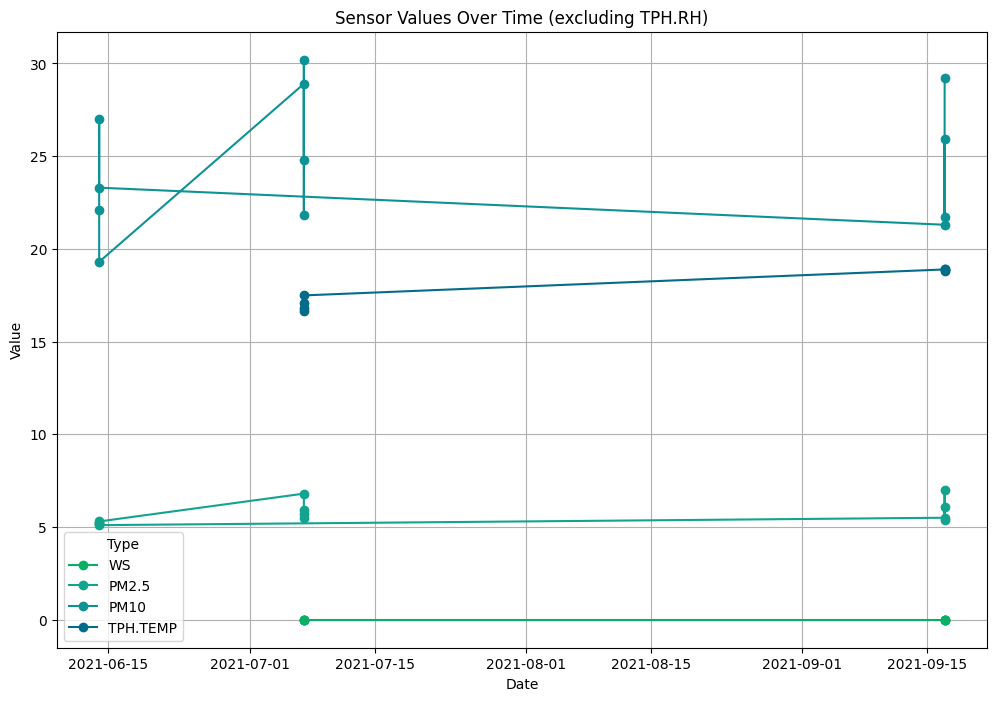

In [ ]:
# Exclude 'TPH.RH', 'TPH.PRESSURE' due to different metrics
color_l = [color_d[0], color_d[1], color_d[2], color_d[3], 'darkolivegreen', 'mediumseagreen', 'lightgreen', 'green', 'seagreen', 'forestgreen']

unique_types = microclimate_sensor_cleaned.loc[
    ~microclimate_sensor_cleaned['type'].isin(['TPH.RH', 'TPH.PRESSURE']), 'type'
].unique()
plt.figure(figsize=(12, 8))
for i, sensor_type in enumerate(unique_types):
    type_data = microclimate_sensor_cleaned[microclimate_sensor_cleaned['type'] == sensor_type]
    plt.plot(type_data['date'], type_data['value'], marker='o', linestyle='-', color=color_l[i % len(color_l)], label=sensor_type)

plt.title('Sensor Values Over Time (excluding TPH.RH)')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend(title='Type')
plt.grid(True)
plt.show()

# 2. Integrated Data Dashboard
##### Create a dashboard displaying data from all sensors.
- Soil_type, depth, measurement soil values and Temperature, Humidity, Light, Motion, VDD, CO2

In [ ]:
import pandas as pd
import ipywidgets as widgets
import re
import matplotlib.pyplot as plt
from IPython.display import display
from matplotlib.ticker import MaxNLocator

# Dropdown options
def extract_info_from_columns(df):
    types = set()
    depths = set()
    measurements = set()
    col_pattern = r"(Soil \w+) (\d+cm) #\d+"

    for probe_measure in df['probe_measure'].unique():
        match = re.match(col_pattern, probe_measure)
        if match:
            measurement, depth = match.groups()
            measurements.add(measurement)
            depths.add(depth)
            types.add('General')

    return sorted(types), sorted(depths), sorted(measurements)

types, depths, measurements = extract_info_from_columns(soil_co2_sensor_data)

# Filtering function
def filter_data(df, soil_type, depth, measurement):
    regex = f"{measurement} {depth} #\d+"
    filtered_df = df[df['probe_measure'].str.contains(regex, regex=True)]
    return filtered_df

# Widgets
type_selector = widgets.Dropdown(options=types, description='Soil Type:')
depth_selector = widgets.Dropdown(options=depths, description='Depth:')
measurement_selector = widgets.Dropdown(options=measurements, description='Measurement:')
overlay_selector = widgets.Dropdown(options=['None', 'Temperature', 'Humidity', 'Light', 'Motion', 'VDD', 'CO2'], description='Overlay:')
output = widgets.Output()

# Plotting function
def plot_data(df, overlay):
    plt.figure(figsize=(14, 6))

    # Soil data
    if 'soil_value' in df.columns:
        plt.plot(df['datetime'], df['soil_value'], label='Soil Value', color=color_d[1], alpha=0.4)
        plt.axhline(df['soil_value'].mean(), color='blue', linestyle='--', label='Avg Soil Value')

    # Overlay data
    if overlay != 'None' and overlay.lower() in df.columns:
        plt.plot(df['datetime'], df[overlay.lower()], label=f'{overlay} Level', color=color_d[3], alpha=0.7)
        plt.axhline(df[overlay.lower()].mean(), color="red", linestyle='--', label=f'Avg {overlay} Level')

    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.title('Soil and Environmental Data Over Time')
    plt.legend()
    plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, nbins=10))  # Adjust x-axis labels
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Update function
def update_output(change):
    with output:
        output.clear_output()
        filtered_df = filter_data(soil_co2_sensor_data, type_selector.value, depth_selector.value, measurement_selector.value)
        plot_data(filtered_df, overlay_selector.value)

type_selector.observe(update_output, names='value')
depth_selector.observe(update_output, names='value')
measurement_selector.observe(update_output, names='value')
overlay_selector.observe(update_output, names='value')

# Display widgets
display(type_selector, depth_selector, measurement_selector, overlay_selector, output)


Dropdown(description='Soil Type:', options=('General',), value='General')

Dropdown(description='Depth:', options=('10cm', '20cm', '30cm', '40cm', '50cm', '60cm', '70cm', '80cm'), value…

Dropdown(description='Measurement:', options=('Soil Moisture', 'Soil Salinity', 'Soil Temperature'), value='So…

Dropdown(description='Overlay:', options=('None', 'Temperature', 'Humidity', 'Light', 'Motion', 'VDD', 'CO2'),…

Output()

# 3. Predictive Analytics Model
1.  Data processing, normalization, visualisation & Model preparation step - windowing.
#### Develop a model to predict environmental conditions and alert for anomalies or hazardous conditions based on historical and current sensor data.
- Time series forecasting using TensorFlow
- Convolutional & Recurrent Neural Networks (CNNs and RNNs)

#### Forecast for a single time step:
- A single feature or all features.

#### Forecast multiple steps:
- Predictions all at once (Single-shot)
- Prediction (Autoregressive) output loop back to the LLM.

In [ ]:
import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt

import os
import datetime

import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf

mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False

In [ ]:
microclimate_sensor.head()

,site_id,gatewayhub_id_x,site_status_x,start_reading,latitude,longitude,location,local_time,id,sensor_id,value,type,units,gatewayhub_id_y,site_status_y
0,1011,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222",2023-11-29 22:15:02+00:00,8110553.0,5b,74.38,TPH.RH,%,arc1055,C
1,1011,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222",2023-11-29 22:15:02+00:00,8110558.0,5c,1010.80,TPH.PRESSURE,hPa,arc1055,C
2,1011,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222",2023-11-29 22:15:03+00:00,8110562.0,6,0.00,WS,km/h,arc1055,C
3,1011,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222",2023-11-29 22:30:02+00:00,8110554.0,5b,74.19,TPH.RH,%,arc1055,C
4,1011,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222",2023-11-29 22:30:11+00:00,8110523.0,0a,5.90,PM2.5,ug\/m^3,arc1055,C


In [ ]:
# describe based on time
microclimate = microclimate_sensor.sort_values('local_time')
print(microclimate['local_time'].describe())

count                            56
unique                           14
top       2023-11-29 22:30:02+00:00
freq                              6
Name: local_time, dtype: object


In [ ]:
soil_co2_sensor_data.head()

,datetime,site_id,id,probe_measure,soil_value,unit,latitude_x,longitude_x,location,time_x,date_x,dev_id,time_y,temperature,humidity,light,motion,visit,vdd,lat_long,co2,latitude_y,longitude_y,date_y
0,2022-12-31 13:00:00,64979,15522826,Soil Moisture 50cm #0,32.63,%VWC,-37.80170,144.97138,"-37.801699999983285, 144.9713799999935",13:00:00,2022-12-31,ers-co2-9da0,13:00:46,24.5,61,0.0,0,0,3656,"-37.8133183, 144.9668853",416.0,-37.813318,144.966885,2022-12-31
1,2022-12-31 13:00:00,66195,15522987,Soil Temperature 50cm #0,21.36,ºC,-37.82073,144.97254,"-37.82072999998553, 144.97253999999268",13:00:00,2022-12-31,ers-co2-9da0,13:00:46,24.5,61,0.0,0,0,3656,"-37.8133183, 144.9668853",416.0,-37.813318,144.966885,2022-12-31
2,2022-12-31 13:00:00,64976,15515162,Soil Salinity 20cm #0,0.05,µS/cm,-37.78292,144.95566,"-37.78291999998904, 144.95566000000628",13:00:00,2022-12-31,ers-co2-9da0,13:00:46,24.5,61,0.0,0,0,3656,"-37.8133183, 144.9668853",416.0,-37.813318,144.966885,2022-12-31
3,2022-12-31 13:00:00,64986,15521623,Soil Moisture 50cm #0,51.39,%VWC,-37.82921,144.97348,"-37.8292099999859, 144.97347999998564",13:00:00,2022-12-31,ers-co2-9da0,13:00:46,24.5,61,0.0,0,0,3656,"-37.8133183, 144.9668853",416.0,-37.813318,144.966885,2022-12-31
4,2022-12-31 13:00:00,64979,15514301,Soil Temperature 30cm #0,20.63,ºC,-37.80170,144.97138,"-37.801699999983285, 144.9713799999935",13:00:00,2022-12-31,ers-co2-9da0,13:00:46,24.5,61,0.0,0,0,3656,"-37.8133183, 144.9668853",416.0,-37.813318,144.966885,2022-12-31


In [ ]:
soil_co2_sensor_data = soil_co2_sensor_data.sort_values('datetime')
print(soil_co2_sensor_data['datetime'].describe())

count                          1184290
mean     2023-08-26 21:39:28.407498240
min                2022-12-31 13:00:00
25%                2023-02-25 23:00:00
50%                2023-10-29 11:00:00
75%                2024-01-11 11:00:00
max                2024-04-01 21:00:00
Name: datetime, dtype: object


In [ ]:
# Check values in columns before drop
# print("Unique Light:", soil_co2_sensor_data['light'].unique())
# print("Unique motion:", soil_co2_sensor_data['motion'].unique())
# print("Unique visit:", soil_co2_sensor_data['visit'].unique())
# print("Unique time_x:", soil_co2_sensor_data['time_x'].unique())
# print("Unique date_x:", soil_co2_sensor_data['date_x'].unique())

In [ ]:
# copy first before drop
df = soil_co2_sensor_data.copy()
df = df.rename(columns={'time_x': 'time', 'date_x': 'date'})

In [ ]:
df.drop(['latitude_x', 'longitude_x', 'location', 'latitude_y', 'longitude_y', 'date_y', 'time_y', 'visit', 'motion'], axis=1, inplace=True)

In [ ]:
print(df.columns)

Index(['datetime', 'site_id', 'id', 'probe_measure', 'soil_value', 'unit',
       'time', 'date', 'dev_id', 'temperature', 'humidity', 'light', 'vdd',
       'lat_long', 'co2'],
      dtype='object')


In [ ]:
nan_counts = df.isna().sum()
print(nan_counts)

datetime         0
site_id          0
id               0
probe_measure    0
soil_value       0
unit             0
time             0
date             0
dev_id           0
temperature      0
humidity         0
light            0
vdd              0
lat_long         0
co2              0
dtype: int64


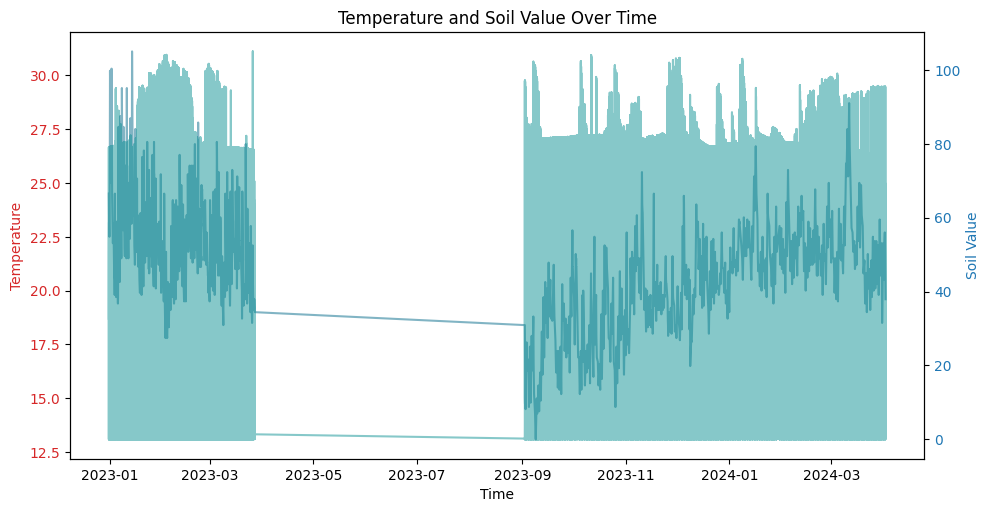

In [ ]:
# View data
fig, ax1 = plt.subplots(figsize=(10, 5))

color = 'tab:red'
ax1.set_xlabel('Time')
ax1.set_ylabel('Temperature', color=color)
ax1.plot(df['datetime'], df['temperature'], color= color_d[3], alpha=0.5)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # 2nd axis
color = 'tab:blue'
ax2.set_ylabel('Soil Value', color=color)
ax2.plot(df['datetime'], df['soil_value'], color= color_d[2], alpha=0.5)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Temperature and Soil Value Over Time')
plt.show()


# A. or B. Save or Load Dataset DF

In [ ]:
# Save dataset
# df.to_csv('/content/drive/My Drive/sit378_eco_metrix/df.csv', index=False)

# Load dataset
# df.pd.read_csv('/content/drive/My Drive/sit378_eco_metrix/df.csv')

In [ ]:
# hourly predictions, sub-sample data 10-minute intervals to one-hour intervals
data = df.copy()
data = data[5::6]

date_time = pd.to_datetime(data.pop('datetime'), format='%d.%m.%Y %H:%M:%S')

In [ ]:
data.head()

,site_id,id,probe_measure,soil_value,unit,time,date,dev_id,temperature,humidity,light,vdd,lat_long,co2
578,64989,15514033,Soil Salinity 80cm #0,0.13,µS/cm,13:00:00,2022-12-31,ers-co2-9da0,24.5,61,0.0,3656,"-37.8133183, 144.9668853",416.0
584,66203,15517851,Soil Temperature 10cm #0,22.18,ºC,13:00:00,2022-12-31,ers-co2-9da0,24.5,61,0.0,3656,"-37.8133183, 144.9668853",416.0
590,64993,15512581,Soil Moisture 20cm #0 (Clayey Loam),25.96,%VWC,13:00:00,2022-12-31,ers-co2-9da0,24.5,61,0.0,3656,"-37.8133183, 144.9668853",416.0
596,64993,15512509,Soil Temperature 40cm #0,21.04,ºC,13:00:00,2022-12-31,ers-co2-9da0,24.5,61,0.0,3656,"-37.8133183, 144.9668853",416.0
548,64998,15515032,Soil Moisture 70cm #0 (Clay),45.17,%VWC,13:00:00,2022-12-31,ers-co2-9da0,24.5,61,0.0,3656,"-37.8133183, 144.9668853",416.0


In [ ]:
# find probe measures
print("Unique probe_measures:", data['probe_measure'].unique())

Unique probe_measures: ['Soil Salinity 80cm #0' 'Soil Temperature 10cm #0'
 'Soil Moisture 20cm #0 (Clayey Loam)' 'Soil Temperature 40cm #0'
 'Soil Moisture 70cm #0 (Clay)' 'Soil Moisture 30cm #0 (Clay)'
 'Soil Moisture 10cm #0 (Sandy Loam)' 'Soil Moisture 40cm #0'
 'Soil Salinity 40 cm #0' 'Soil Moisture 50cm #0'
 'Soil Moisture 60cm #0 (Clay)' 'Soil Salinity 50cm #0'
 'Soil Salinity 40cm #0' 'Soil Salinity 60cm #0' 'Soil Salinity 70cm #0'
 'Soil Temperature 70cm #0' 'Soil Moisture 10cm #0 (Sand)'
 'Soil Moisture 20cm #0 (Sandy Loam)' 'Soil Moisture 30cm #0'
 'Soil Temperature 60cm #0' 'Soil Salinity 10cm #0'
 'Soil Salinity 30cm #0' 'Soil Moisture 60cm #0'
 'Soil Temperature 50cm #0' '#0 Soil Moisture 40cm'
 'Soil Temperature 80cm #0' 'Soil Moisture 40cm #0 (Clay)'
 'Soil Moisture 50cm #0 (Clay)' 'Soil Moisture 80cm #0'
 'Soil Moisture 10cm #0' '#0 Soil Moisture 50cm' 'Soil Moisture 70cm #0'
 'Soil Salinity 20cm #0' '#0 Soil Moisture 70cm' 'Soil Moisture 20cm #0'
 'Soil Temperature 3

In [ ]:
# Unique key
data['unique_key'] = data['site_id'].astype(str) + '_' + data['date'].astype(str) + '_' + data['time'].astype(str)

# Pivot
pivot_data = data.pivot_table(index='unique_key', columns='probe_measure', values='soil_value', aggfunc='first').reset_index()

# Rename
pivot_data.columns = ['_'.join(col).strip() if isinstance(col, tuple) else col for col in pivot_data.columns]


In [ ]:
# Print the count of non-NaN values
non_nan_counts = pivot_data.count()
print(non_nan_counts)

unique_key                         45392
#0 Soil Moisture 10cm               2002
#0 Soil Moisture 10cm Clay Loam      202
#0 Soil Moisture 20cm               2215
#0 Soil Moisture 30cm               2289
                                   ...  
Soil Temperature 40cm #0            7504
Soil Temperature 50cm #0            5545
Soil Temperature 60cm #0            5475
Soil Temperature 70cm #0            5505
Soil Temperature 80cm #0            5552
Length: 62, dtype: int64


In [ ]:
probe_measure_counts = data['probe_measure'].value_counts()

print("Count of records for each probe_measure:")
print(probe_measure_counts)

Count of records for each probe_measure:
probe_measure
Soil Moisture 30cm #0                 7709
Soil Temperature 30cm #0              7706
Soil Temperature 10cm #0              7582
Soil Moisture 20cm #0                 7577
Soil Moisture 10cm #0                 7560
                                      ... 
#0 Soil Moisture 10cm Clay Loam        202
Soil Moisture 70cm #0 (Sandy Loam)     126
Soil Moisture 80cm #0 (Sandy Loam)     126
Soil Moisture 50cm #0 (Sandy Loam)     125
Soil Moisture 60cm #0 (Sandy Loam)     123
Name: count, Length: 61, dtype: int64


### Descriptive statistics
- mean, standard deviation, min, max, etc

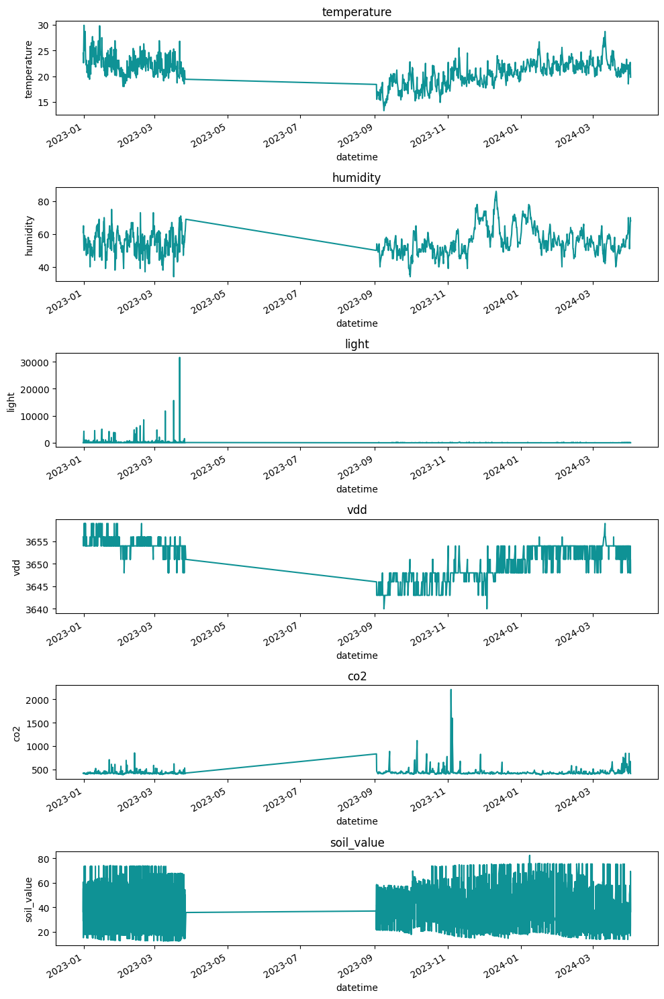

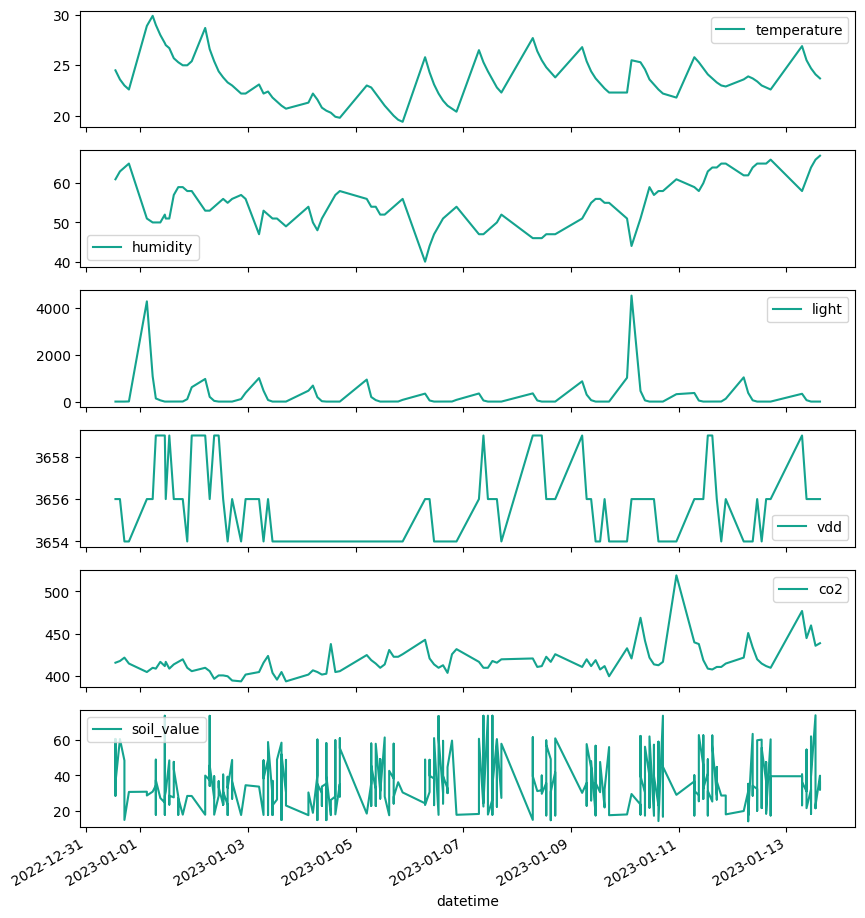

In [ ]:
# Filter soil  (Soil Moisture 30cm #0  7709)
# Convert, concatenate to datetime
data['datetime'] = pd.to_datetime(data['date'].astype(str) + ' ' + data['time'].astype(str))
filtered_data = data[data['probe_measure'] == 'Soil Moisture 30cm #0']

plot_cols = ['temperature', 'humidity', 'light', 'vdd', 'co2', 'soil_value']
filtered_data = filtered_data[plot_cols + ['datetime']].dropna(subset=plot_cols)
filtered_data.set_index('datetime', inplace=True) # set index

fig, axs = plt.subplots(len(plot_cols), 1, figsize=(10, 15))
for i, col in enumerate(plot_cols):
    filtered_data[col].plot(ax=axs[i], title=col, color= color_d[2])
    axs[i].set_ylabel(col)

plt.tight_layout()
plt.show()

# Plot first 480 records
if len(filtered_data) > 480:
    filtered_data[:480].plot(subplots=True, figsize=(10, 12), color=color_d[1])
    plt.show()


In [ ]:
# View stats
# Filter
filtered_data = data[data['probe_measure'] == 'Soil Moisture 30cm #0']
columns = ['co2', 'vdd', 'humidity', 'temperature', 'soil_value']
stats = filtered_data[columns].describe().transpose()
stats

,count,mean,std,min,25%,50%,75%,max
co2,7709.0,434.963938,83.544455,381.00,409.00,417.0,433.00,2209.00
vdd,7709.0,3651.589700,3.727366,3640.00,3648.00,3654.0,3654.00,3659.00
humidity,7709.0,55.932546,7.858678,34.00,51.00,55.0,60.00,86.00
temperature,7709.0,21.269101,2.214275,13.30,20.00,21.4,22.60,29.90
soil_value,7709.0,37.212963,13.640875,12.44,28.37,34.6,44.34,82.25


In [ ]:
# Convert date time to seconds
timestamp_s = date_time.map(pd.Timestamp.timestamp)

### Converts date_time to timestamps in seconds,
-  Computes the sine and cosine of the time of day and time of year
- Considering cyclic nature of days/years in time series data
- Aim to review seasonal trends

In [ ]:
# Sets cosine for prep seasonal trends
day = 24*60*60
year = (365.2425)*day

data['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
data['Day cos'] = np.cos(timestamp_s * (2 * np.pi / day))
data['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))
data['Year cos'] = np.cos(timestamp_s * (2 * np.pi / year))

##  Fast Fourier Transform (FFT)
#### Second confirmation Temperature was found to be a predictor using Frander Casuality Test
- Applied to temperature column to find frequency components.
- Frequently different cycles on a logarithmic scale.

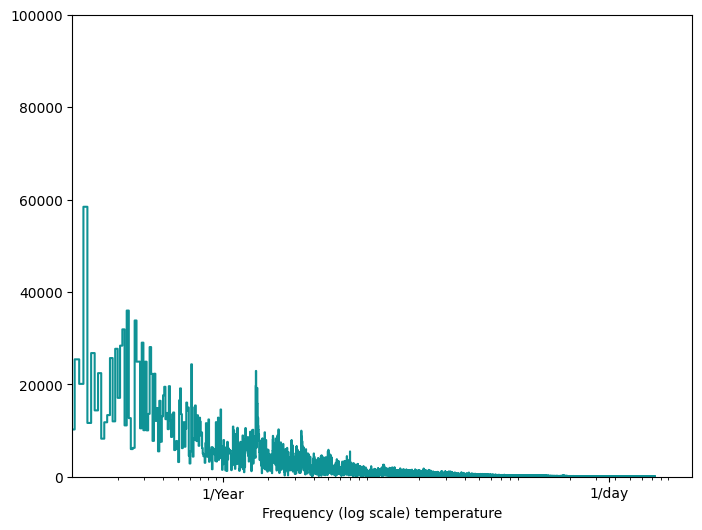

In [ ]:
# Temp over time
# Temperature was found to be a predictor using Frander Casuality Test
# Units 'temperature', 'humidity', 'vdd', 'co2', 'soil_value'
fft = tf.signal.rfft(data['temperature'])
f_per_dataset = np.arange(0, len(fft))

n_samples_h = len(df['temperature'])
hours_per_year = 24*365.2524
years_per_dataset = n_samples_h/(hours_per_year)

f_per_year = f_per_dataset/years_per_dataset
plt.step(f_per_year, np.abs(fft), color_d[2])
plt.xscale('log')
plt.ylim(0, 100000)
plt.xlim([0.1, max(plt.xlim())])
plt.xticks([1, 365.2524], labels=['1/Year', '1/day'])
_ = plt.xlabel('Frequency (log scale) temperature')

### Spilt Data for training
- 70%, 20%, 10%
- Split

- List of consecutive inputs, create split_window to convert inputs and a window of labels.

In [ ]:
# Split data
if 'datetime' not in data.columns:
    data['datetime'] = pd.to_datetime(data['date'].astype(str) + ' ' + data['time'].astype(str))

# Calculate indices data
columns = ['datetime', 'co2', 'vdd', 'humidity', 'temperature', 'soil_value']
data_filtered = data[columns]
data_filtered.set_index('datetime', inplace=True)
n = len(data_filtered) # calculate
train_df = data_filtered[0:int(n * 0.7)]
val_df = data_filtered[int(n * 0.7):int(n * 0.9)]
test_df = data_filtered[int(n * 0.9):]

# Features, not 'datetime' index
num_features = len(columns) - 1

column_indices = {name: i for i, name in enumerate(data_filtered.columns)}

print("Number of features:", num_features)
print("Training Set Length:", len(train_df))
print("Validation Set Length:", len(val_df))
print("Testing Set Length:", len(test_df))


Number of features: 5
Training Set Length: 138166
Validation Set Length: 39476
Testing Set Length: 19739


In [ ]:
# Normalise data
train_mean = train_df.select_dtypes(include=['float64', 'int64']).mean()
train_std = train_df.select_dtypes(include=['float64', 'int64']).std()

# Normalisation to numeric columns
numeric_cols = train_df.select_dtypes(include=['float64', 'int64']).columns
train_df[numeric_cols] = (train_df[numeric_cols] - train_mean) / train_std
val_df[numeric_cols] = (val_df[numeric_cols] - train_mean) / train_std
test_df[numeric_cols] = (test_df[numeric_cols] - train_mean) / train_std

## Violin plots for each feature in the normalised training dataset

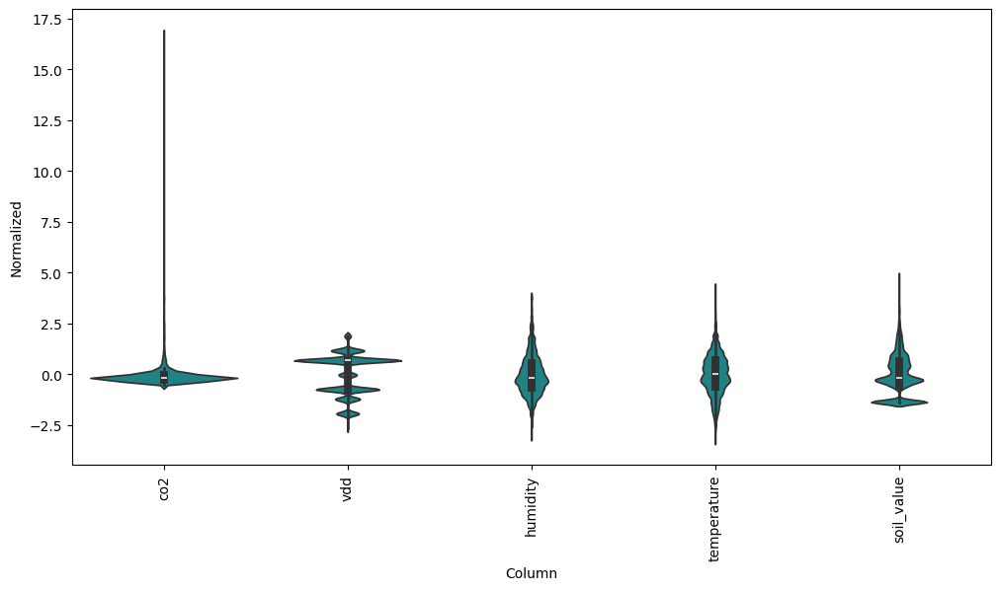

In [ ]:
# View distribution
df_std = pd.DataFrame(data=train_df, columns=numeric_cols)
df_std = df_std.melt(var_name='Column', value_name='Normalized')
plt.figure(figsize=(12, 6))
ax = sns.violinplot(x='Column', y='Normalized', data=df_std, color= color_d[2])
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

plt.show()

In [ ]:
import pandas as pd
df_std = pd.DataFrame(data=train_df, columns=numeric_cols)
print("Basic Statistics for each numeric column:")
print(df_std.describe())

Basic Statistics for each numeric column:
                co2           vdd      humidity   temperature    soil_value
count  1.381660e+05  1.381660e+05  1.381660e+05  1.381660e+05  1.381660e+05
mean  -6.582623e-17 -5.205538e-14  8.228279e-18  1.456405e-16 -1.411150e-16
std    1.000000e+00  1.000000e+00  1.000000e+00  1.000000e+00  1.000000e+00
min   -5.293187e-01 -2.653729e+00 -3.067528e+00 -3.257021e+00 -1.386784e+00
25%   -2.550561e-01 -7.480756e-01 -6.878534e-01 -6.216164e-01 -5.564468e-01
50%   -1.888548e-01  6.811648e-01 -1.868692e-01  5.860924e-03 -1.701336e-01
75%   -3.753753e-02  6.811648e-01  5.646071e-01  6.751700e-01  6.519596e-01
max    1.675868e+01  1.872198e+00  3.821004e+00  4.272707e+00  4.794815e+00


### Review Stats
- Each variable has been standardised (normalised)
- Co2 high outliers compared to mean
- VDD (Voltage) potential outliers on the low end (low poer) Median is above zero, there is a right skewed distribution.
- Humidity reflects different possible seasons (median is balanced).
- Temperature has significant variation correlating to seasonal trends but median shows a symmetric distribution
Soil Value some extremem outliers potential for seasonal conditional impacts

## Generate batches of temporal input-output pairs from the time series data.
- time series analysis to predict future value based on past input windows.

- Parameters defining how wide the input/ label windows should be & How far ahead the model should predict.
- Stores training, validation, and test data.
- Calculates indices for selecting the input and label data on split

- Future aims: Feature scaling and cyclical encoding.

In [ ]:
class WindowGenerator():
  def __init__(self, input_width, label_width, shift,
               train_df=train_df, val_df=val_df, test_df=test_df,
               label_columns=None):

    self.train_df = train_df
    self.val_df = val_df
    self.test_df = test_df

    # Labels
    self.label_columns = label_columns
    if label_columns is not None:
      self.label_columns_indices = {name: i for i, name in
                                    enumerate(label_columns)}
    self.column_indices = {name: i for i, name in
                           enumerate(train_df.columns)}

    # Parameters
    self.input_width = input_width
    self.label_width = label_width
    self.shift = shift

    self.total_window_size = input_width + shift
    self.input_slice = slice(0, input_width)
    self.input_indices = np.arange(self.total_window_size)[self.input_slice]
    self.label_start = self.total_window_size - self.label_width
    self.labels_slice = slice(self.label_start, None)
    self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

  def __repr__(self):
    return '\n'.join([
        f'Total window size: {self.total_window_size}',
        f'Input indices: {self.input_indices}',
        f'Label indices: {self.label_indices}',
        f'Label column name(s): {self.label_columns}'])

### Visualise Window Data
- And predictions made by a model
- How model is performing relative to the actual data!

In [ ]:
window1 = WindowGenerator(input_width=24, label_width=1, shift=24,
                     label_columns=['temperature'])
window1

Total window size: 48
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
Label indices: [47]
Label column name(s): ['temperature']

In [ ]:
window2 = WindowGenerator(input_width=6, label_width=1, shift=1,
                     label_columns=['temperature'])
window2

Total window size: 7
Input indices: [0 1 2 3 4 5]
Label indices: [6]
Label column name(s): ['temperature']

In [ ]:
print(train_df.columns)

Index(['co2', 'vdd', 'humidity', 'temperature', 'soil_value'], dtype='object')


## Predictions based on a window of consecutive samples from the data.
- Data in TensorFlow = arrays where the outermost index is across examples (the "batch" dimension).
- The middle indices are the "time" or "space" (width, height) dimension(s). - The innermost indices are the features.

In [ ]:
  # Slicing doesn't preserve static shape information
  # Set Manually for inspection later
def split_window(self, features):
  inputs = features[:, self.input_slice, :]
  labels = features[:, self.labels_slice, :]
  if self.label_columns is not None:
    labels = tf.stack(
        [labels[:, :, self.column_indices[name]] for name in self.label_columns],
        axis=-1)

  inputs.set_shape([None, self.input_width, None])
  labels.set_shape([None, self.label_width, None])

  return inputs, labels

WindowGenerator.split_window = split_window

In [ ]:
# Stack three slices: length of the total window
example_window = tf.stack([np.array(train_df[:window2.total_window_size]),
                           np.array(train_df[100:100+window2.total_window_size]),
                           np.array(train_df[200:200+window2.total_window_size])])

example_inputs, example_labels = window2.split_window(example_window)

print('All shapes are: (batch, time, features)')
print(f'Window shape: {example_window.shape}')
print(f'Inputs shape: {example_inputs.shape}')
print(f'Labels shape: {example_labels.shape}')

All shapes are: (batch, time, features)
Window shape: (3, 7, 5)
Inputs shape: (3, 6, 5)
Labels shape: (3, 1, 1)


In [ ]:
# Plot
window2.example = example_inputs, example_labels
def plot(self, model=None, plot_col='temperature', max_subplots=3):
  inputs, labels = self.example
  plt.figure(figsize=(12, 8))
  plot_col_index = self.column_indices[plot_col]
  max_n = min(max_subplots, len(inputs))
  for n in range(max_n):
    plt.subplot(max_n, 1, n+1)
    plt.ylabel(f'{plot_col} [normed]')
    plt.plot(self.input_indices, inputs[n, :, plot_col_index],
             label='Inputs', marker='.', zorder=-10)

    if self.label_columns:
      label_col_index = self.label_columns_indices.get(plot_col, None)
    else:
      label_col_index = plot_col_index

    if label_col_index is None:
      continue

    plt.scatter(self.label_indices, labels[n, :, label_col_index],
                edgecolors='k', label='Labels', c='#2ca02c', s=64)
    if model is not None:
      predictions = model(inputs)
      plt.scatter(self.label_indices, predictions[n, :, label_col_index],
                  marker='X', edgecolors='k', label='Predictions',
                  c='#ff7f0e', s=64)

    if n == 0:
      plt.legend()

  plt.xlabel('Time [h]')

WindowGenerator.plot = plot

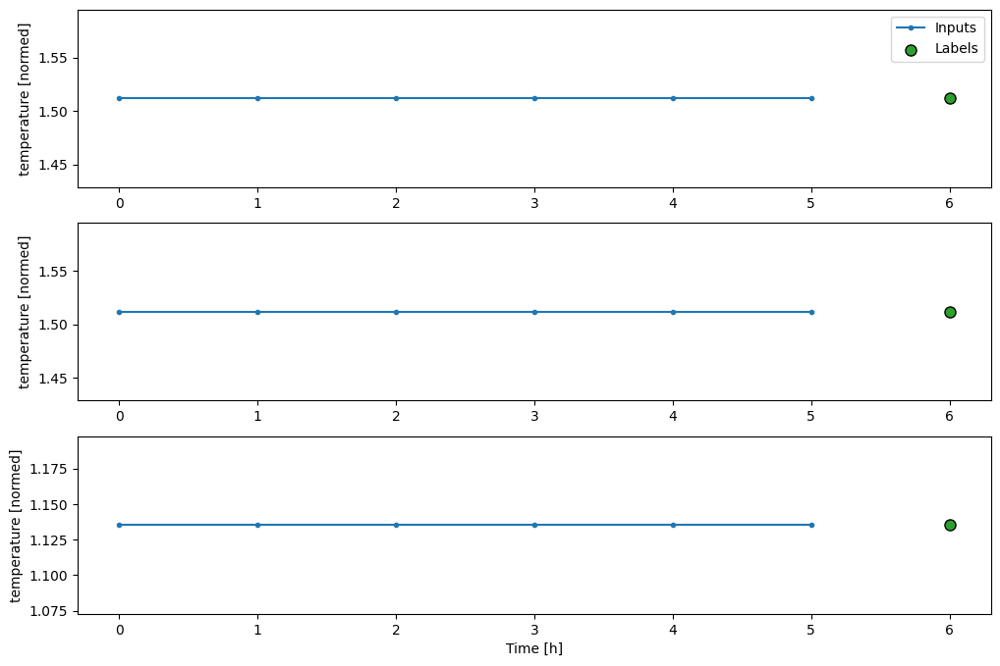

In [ ]:
window2.plot()

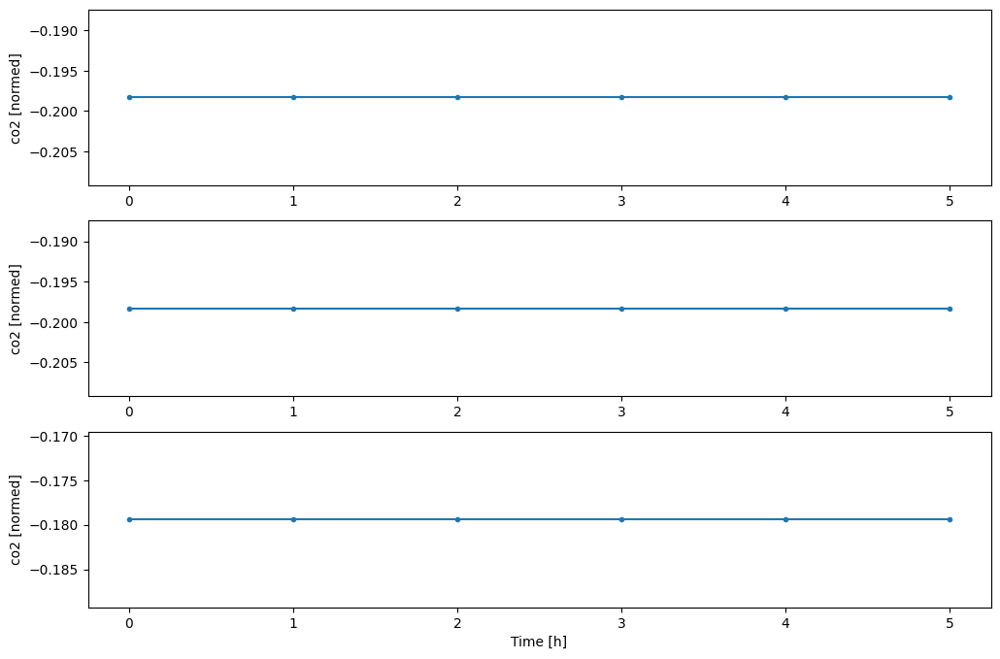

In [ ]:
# Plot other columns
# Please be aware - window w2 configuration only has labels for the Temperature column!
window2.plot(plot_col='co2')

## Make a dataset (tf.data.Dataset) of input window and label window
- Uses pairs & tf.keras.utils.timeseries_dataset_from_array function

In [ ]:
def make_dataset(self, data):
  data = np.array(data, dtype=np.float32)
  ds = tf.keras.utils.timeseries_dataset_from_array(
      data=data,
      targets=None,
      sequence_length=self.total_window_size,
      sequence_stride=1,
      shuffle=True,
      batch_size=32,)

  ds = ds.map(self.split_window)

  return ds

WindowGenerator.make_dataset = make_dataset

In [ ]:
# Holds the training, validations, test data
@property
def train(self):
  return self.make_dataset(self.train_df)

@property
def val(self):
  return self.make_dataset(self.val_df)

@property
def test(self):
  return self.make_dataset(self.test_df)

@property
def example(self):
  """Get and cache an example batch of `inputs, labels` for plotting."""
  result = getattr(self, '_example', None)
  if result is None:
    result = next(iter(self.train)) # use .train dataset
    self._example = result # cache for next time
  return result

WindowGenerator.train = train
WindowGenerator.val = val
WindowGenerator.test = test
WindowGenerator.example = example

In [ ]:
# Each element is an inputs & label pair
window2.train.element_spec

(TensorSpec(shape=(None, 6, 5), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 1, 1), dtype=tf.float32, name=None))

In [ ]:
for example_inputs, example_labels in window2.train.take(1):
  print(f'Inputs shape (batch, time, features): {example_inputs.shape}')
  print(f'Labels shape (batch, time, features): {example_labels.shape}')

Inputs shape (batch, time, features): (32, 6, 5)
Labels shape (batch, time, features): (32, 1, 1)


In [ ]:
one_step_window = WindowGenerator(
    input_width=1, label_width=1, shift=1,
    label_columns=['temperature'])
one_step_window

Total window size: 2
Input indices: [0]
Label indices: [1]
Label column name(s): ['temperature']

In [ ]:
for example_inputs, example_labels in one_step_window.train.take(1):
  print(f'Inputs shape (batch, time, features): {example_inputs.shape}')
  print(f'Labels shape (batch, time, features): {example_labels.shape}')

Inputs shape (batch, time, features): (32, 1, 5)
Labels shape (batch, time, features): (32, 1, 1)


## Base Model
- Predicts the next value in a time series as the last available value in the input window.
- To compare against more complex models.

# Performance baseline as a point for comparison
 - input as-is or extracts data from a column from the input tensor
 - Model is used to evaluate performance using 'mean squared error' and 'mean absolute error' for validation datasets

### Baseline, linear and dense models handle time steps differently
- Goal is to create a WindowGenerator that will produce batches of three-hour inputs and one-hour labels:
- Issue could be that the resulting model can may excute input windows of exactly this shape????

In [ ]:
class Baseline(tf.keras.Model):
  def __init__(self, label_index=None):
    super().__init__()
    self.label_index = label_index

  def call(self, inputs):
    if self.label_index is None:
      return inputs
    result = inputs[:, :, self.label_index]
    return result[:, :, tf.newaxis]

baseline = Baseline(label_index=column_indices['temperature'])

baseline.compile(loss=tf.keras.losses.MeanSquaredError(),
                 metrics=[tf.keras.metrics.MeanAbsoluteError()])

val_performance = {}
performance = {}
val_performance['Baseline'] = baseline.evaluate(one_step_window.val, return_dict=True)
performance['Baseline'] = baseline.evaluate(one_step_window.test, verbose=0, return_dict=True)

1234/1234 [==============================] - 7s 4ms/step - loss: 0.0014 - mean_absolute_error: 0.0022


In [ ]:
spread_window = WindowGenerator(
    input_width=24, label_width=24, shift=1,
    label_columns=['temperature'])

spread_window

Total window size: 25
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
Label indices: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24]
Label column name(s): ['temperature']

In [ ]:
print('Input shape:', spread_window.example[0].shape)
print('Output shape:', baseline(spread_window.example[0]).shape)

Input shape: (32, 24, 5)
Output shape: (32, 24, 1)


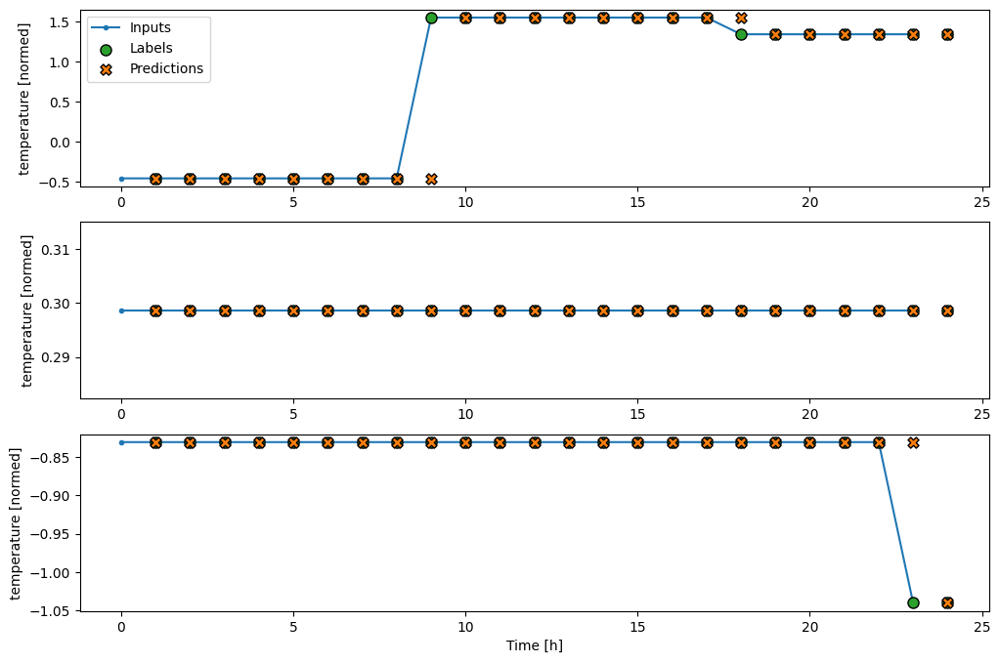

In [ ]:
spread_window.plot(baseline) #  labels shifted right by one hour

# Linear model
- The output from a time step only depends on that step

# Idea
- To Create instances of the WindowGenerator with different configs
- Single-step vs wide-window predictions
- Used to train models & make predictions over different time scales

<br>
# Background
- tf.keras.layers.Dense layer with no activation set is a linear model
- The layer only transforms the last axis of the data from (batch, time, inputs) to (batch, time, units)
- Applied independently to every item across the batch and time axes

In [ ]:
# Linear model
linear = tf.keras.Sequential([
    tf.keras.layers.Dense(units=1)
])

print('Input shape:', one_step_window.example[0].shape)
print('Output shape:', linear(one_step_window.example[0]).shape)

Input shape: (32, 1, 5)
Output shape: (32, 1, 1)


In [ ]:
MAX_EPOCHS = 10

# Uses early callbacks = stops training early if val_loss, stops improving
# Oatience=2: Train until validation loss fails to improve 2 epochs
def compile_and_fit(model, window, patience=2):
  early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=patience,
                                                    mode='min')

  model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

  history = model.fit(window.train, epochs=MAX_EPOCHS,
                      validation_data=window.val,
                      callbacks=[early_stopping])
  return history

In [ ]:
history = compile_and_fit(linear, one_step_window)

val_performance['Linear'] = linear.evaluate(one_step_window.val, return_dict=True)
performance['Linear'] = linear.evaluate(one_step_window.test, verbose=0, return_dict=True)

print('Shape Input:', one_step_window.example[0].shape)
print('Shape Output:', linear(one_step_window.example[0]).shape)

Epoch 1/20
4318/4318 [==============================] - 35s 8ms/step - loss: 0.6268 - mean_absolute_error: 0.4062 - val_loss: 0.0055 - val_mean_absolute_error: 0.0514
Epoch 2/20
4318/4318 [==============================] - 29s 7ms/step - loss: 0.0035 - mean_absolute_error: 0.0162 - val_loss: 0.0014 - val_mean_absolute_error: 0.0048
Epoch 3/20
4318/4318 [==============================] - 34s 8ms/step - loss: 0.0030 - mean_absolute_error: 0.0073 - val_loss: 0.0014 - val_mean_absolute_error: 0.0051
Epoch 4/20
1234/1234 [==============================] - 8s 6ms/step - loss: 0.0015 - mean_absolute_error: 0.0056
Shape Input: (32, 1, 5)
Shape Output: (32, 1, 1)


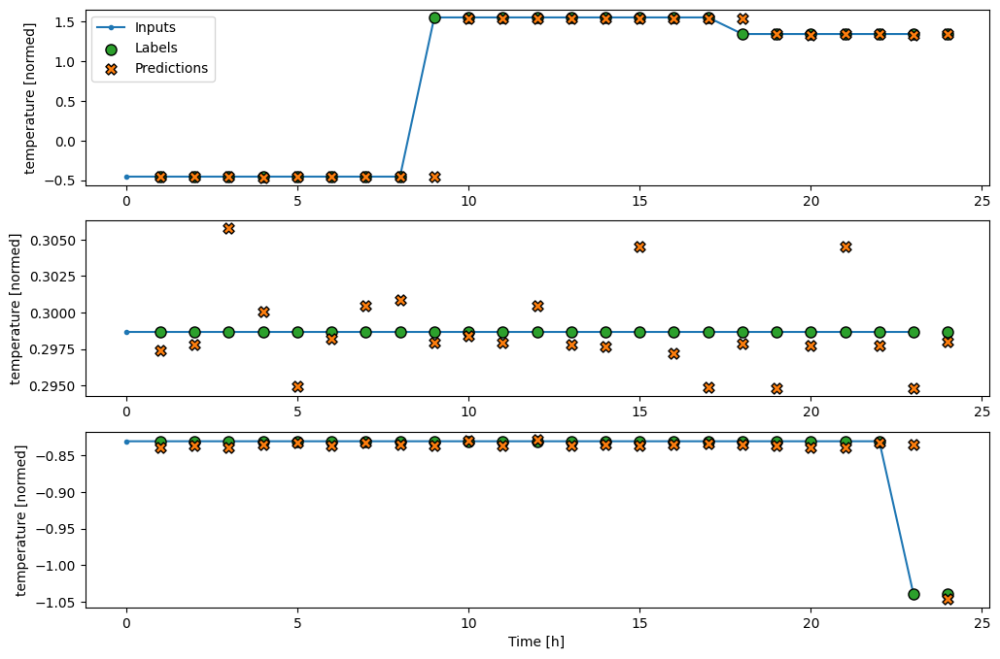

In [ ]:
spread_window.plot(linear)
# many cases the prediction is clearly better returning temperature, but in a few cases it's worse

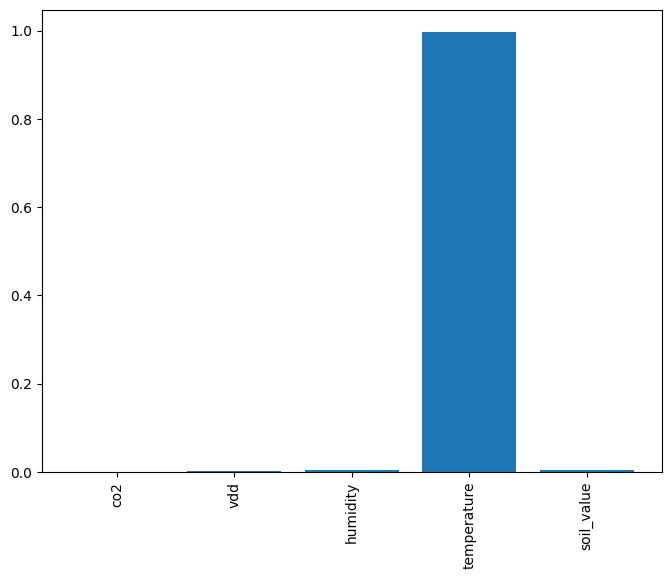

In [ ]:
plt.bar(x = range(len(train_df.columns)),
        height=linear.layers[0].kernel[:,0].numpy())
axis = plt.gca()
axis.set_xticks(range(len(train_df.columns)))
_ = axis.set_xticklabels(train_df.columns, rotation=90)

# Model places most weight on temperature

### Like baseline model, the linear model can be called on batches of wide windows.
- Model makes a set of independent predictions on consecutive time steps
- The time axis acts like another batch axis
There are no interactions between the predictions at each time step

#### Overview
- Blue inputs (line) shows input temperature at each time step)
- Green labels (dot) show target prediction values - it is moved one step forward
- Orange Predictions (crosses) are the models predictions for each output time step - Perfect predictions will hit the labels (dots)

In [ ]:
# Take test batch
for inputs, labels in spread_window.test.take(1):
    predictions = linear.predict(inputs)

# df for predictions and actual values
predictions_df = pd.DataFrame(data={
    "Predictions": predictions.flatten(),
    "Actual Values": labels.numpy().flatten()
})

# Output
print("Predictions vs Actual Values:")
print(predictions_df.head())  # Shows the first few rows

# Find model weights in df
weights = linear.layers[0].kernel[:,0].numpy()
weights_df = pd.DataFrame(data={
    "Feature": train_df.columns,
    "Weight": weights
})

# Output weights
print("\nModel Weights:")
print(weights_df)

print("\nDescriptive Statistics for Predictions:")
print(predictions_df.describe())

1/1 [==============================] - 0s 104ms/step
Predictions vs Actual Values:
   Predictions  Actual Values
0     1.175895       1.177152
1     1.171215       1.177152
2     1.178890       1.177152
3     1.184662       1.177152
4     1.177986       1.177152

Model Weights:
       Feature    Weight
0          co2  0.000378
1          vdd  0.001319
2     humidity  0.003004
3  temperature  0.997548
4   soil_value  0.003017

Descriptive Statistics for Predictions:
       Predictions  Actual Values
count   768.000000     768.000000
mean      0.631839       0.631650
std       0.554347       0.555779
min      -0.503021      -0.621616
25%       0.220847       0.215020
50%       0.635616       0.633338
75%       1.012649       1.009825
max       1.724331       1.720966


### Multi-step Dense Version Model - Optimse Model Test
- Single-time-step model no context for inputs values.
- Test multiple time steps when making predictions as the model doesn't have knowledge of input features changing overtime.

In [ ]:
dense = tf.keras.Sequential([
    tf.keras.layers.Dense(units=64, activation='relu'),
    tf.keras.layers.Dense(units=64, activation='relu'),
    tf.keras.layers.Dense(units=1)
])

history = compile_and_fit(dense, one_step_window)

val_performance['Dense'] = dense.evaluate(one_step_window.val, return_dict=True)
performance['Dense'] = dense.evaluate(one_step_window.test, verbose=0, return_dict=True)

Epoch 1/20
4318/4318 [==============================] - 39s 9ms/step - loss: 0.0069 - mean_absolute_error: 0.0283 - val_loss: 0.0017 - val_mean_absolute_error: 0.0136
Epoch 2/20
4318/4318 [==============================] - 48s 11ms/step - loss: 0.0035 - mean_absolute_error: 0.0185 - val_loss: 0.0022 - val_mean_absolute_error: 0.0239
Epoch 3/20
1234/1234 [==============================] - 8s 6ms/step - loss: 0.0018 - mean_absolute_error: 0.0169


In [ ]:
CONV_WIDTH = 3
conv_window = WindowGenerator(
    input_width=CONV_WIDTH,
    label_width=1,
    shift=1,
    label_columns=['temperature'])

conv_window

Total window size: 4
Input indices: [0 1 2]
Label indices: [3]
Label column name(s): ['temperature']

Text(0.5, 0.98, '3 hours of inputs = predict 1 hour')

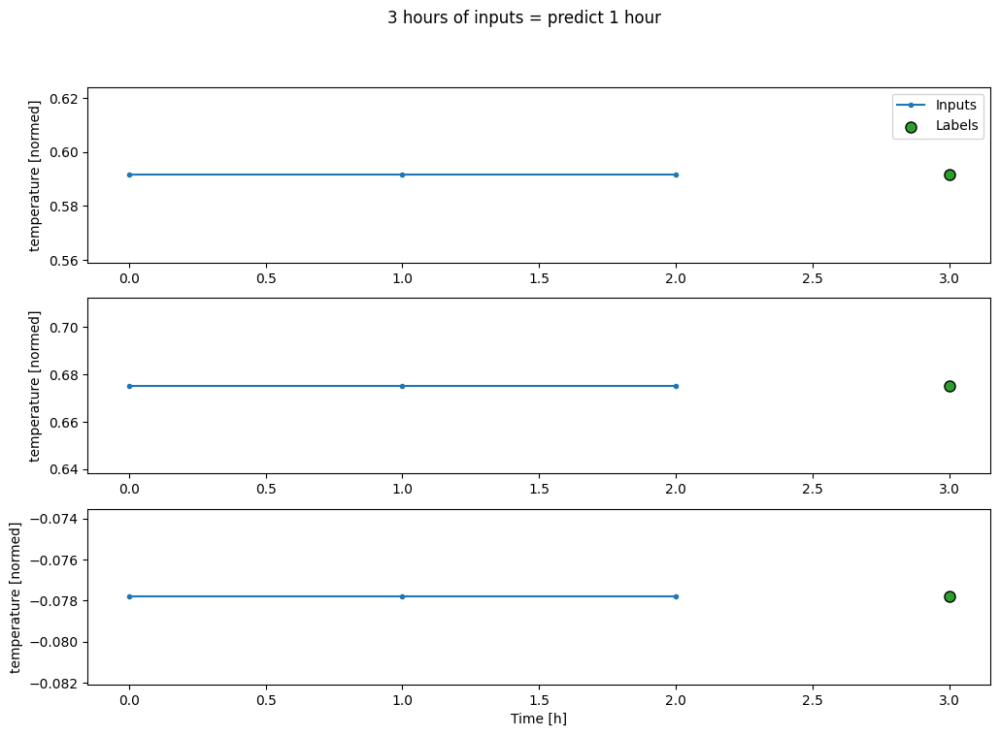

In [ ]:
conv_window.plot()
plt.suptitle("3 hours of inputs = predict 1 hour")

### Train Dense model by flatten the first layer
- tf.keras.layers.Flatten

In [ ]:
multi_step_dense = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=32, activation='relu'),
    tf.keras.layers.Dense(units=32, activation='relu'),
    tf.keras.layers.Dense(units=1),
    tf.keras.layers.Reshape([1, -1]),
])

In [ ]:
history = compile_and_fit(multi_step_dense, conv_window)

IPython.display.clear_output()
val_performance['Multi step dense'] = multi_step_dense.evaluate(conv_window.val, return_dict=True)
performance['Multi step dense'] = multi_step_dense.evaluate(conv_window.test, verbose=0, return_dict=True)

1234/1234 [==============================] - 4s 3ms/step - loss: 0.0015 - mean_absolute_error: 0.0098


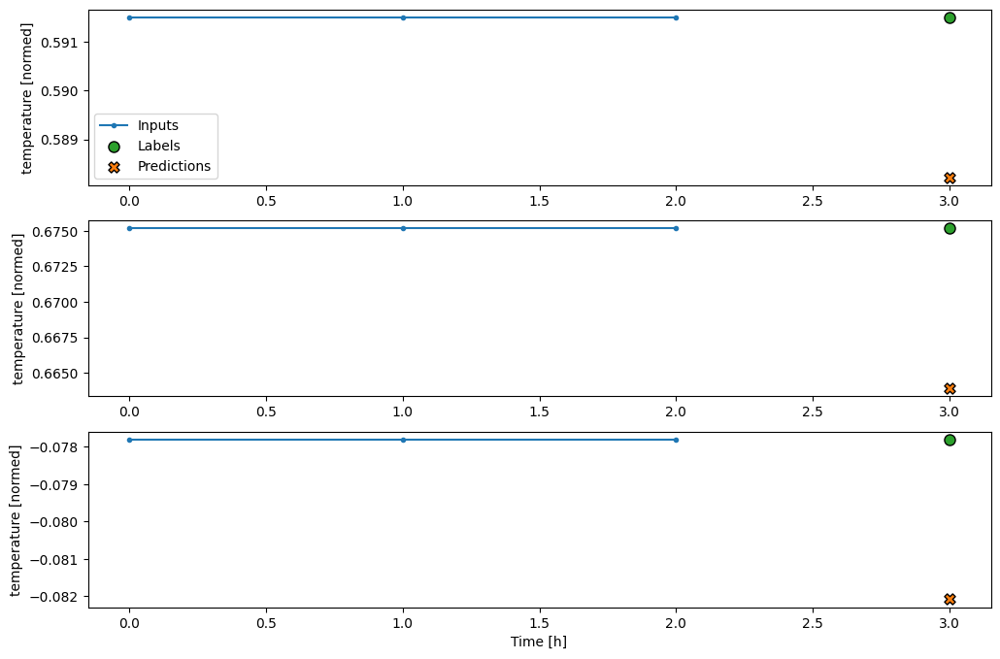

In [ ]:
conv_window.plot(multi_step_dense)

In [ ]:
print('Input shape:', spread_window.example[0].shape)
try:
  print('Output shape:', multi_step_dense(spread_window.example[0]).shape)
except Exception as e:
  print(f'\n{type(e).__name__}:{e}')

# Only shows one shape

Input shape: (32, 24, 5)

ValueError:Exception encountered when calling layer 'sequential_3' (type Sequential).

Input 0 of layer "dense_7" is incompatible with the layer: expected axis -1 of input shape to have value 15, but received input with shape (32, 120)

Call arguments received by layer 'sequential_3' (type Sequential):
  • inputs=tf.Tensor(shape=(32, 24, 5), dtype=float32)
  • training=None
  • mask=None


In [ ]:
#  convolution layer (tf.keras.layers.Conv1D) also takes multiple time steps as input to each prediction.
conv_model = tf.keras.Sequential([
    tf.keras.layers.Conv1D(filters=32,
                           kernel_size=(CONV_WIDTH,),
                           activation='relu'),
    tf.keras.layers.Dense(units=32, activation='relu'),
    tf.keras.layers.Dense(units=1),
])

In [ ]:
# Test model produces output with expected shape
print("Conv model on `conv_window`")
print('Input shape:', conv_window.example[0].shape)
print('Output shape:', conv_model(conv_window.example[0]).shape)

Conv model on `conv_window`
Input shape: (32, 3, 5)
Output shape: (32, 1, 1)


In [ ]:
history = compile_and_fit(conv_model, conv_window)

IPython.display.clear_output()
val_performance['Conv'] = conv_model.evaluate(conv_window.val, return_dict=True)
performance['Conv'] = conv_model.evaluate(conv_window.test, verbose=0, return_dict=True)

1234/1234 [==============================] - 5s 4ms/step - loss: 0.0015 - mean_absolute_error: 0.0085


In [ ]:
# Label and prediction require same length, increase input time steps to enable lengths to match
LABEL_WIDTH = 24
INPUT_WIDTH = LABEL_WIDTH + (CONV_WIDTH - 1)
wide_conv_window = WindowGenerator(
    input_width=INPUT_WIDTH,
    label_width=LABEL_WIDTH,
    shift=1,
    label_columns=['temperature'])

wide_conv_window

print("Wide conv window")
print('Input shape:', wide_conv_window.example[0].shape)
print('Labels shape:', wide_conv_window.example[1].shape)
print('Output shape:', conv_model(wide_conv_window.example[0]).shape)

Wide conv window
Input shape: (32, 26, 5)
Labels shape: (32, 24, 1)
Output shape: (32, 24, 1)


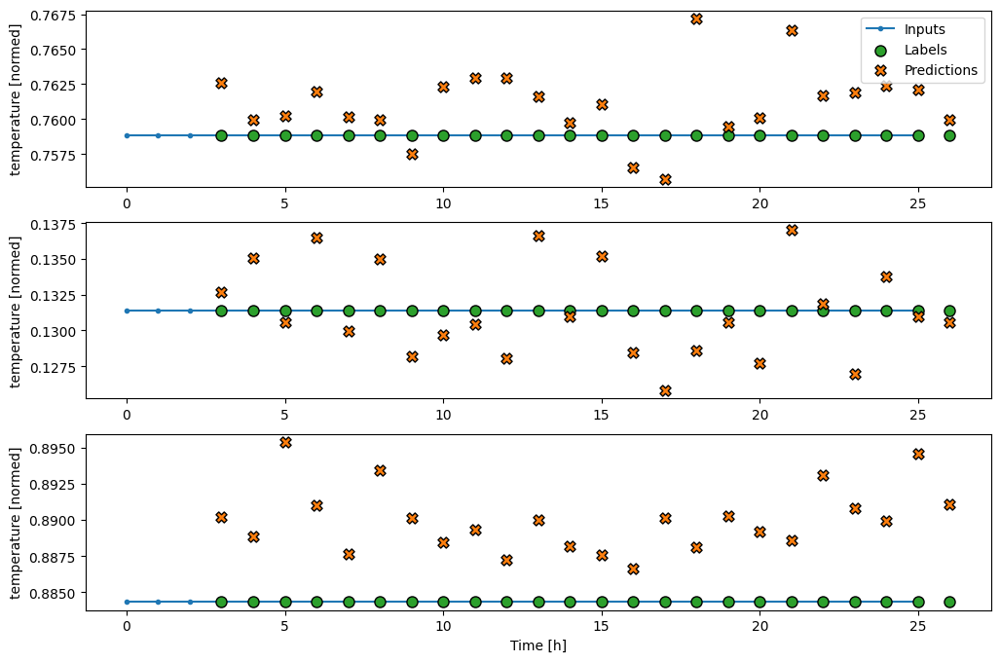

In [ ]:
wide_conv_window.plot(conv_model)

In [ ]:
val_performance

{'Baseline': {'loss': 0.001438622479327023,
  'mean_absolute_error': 0.0022306805476546288},
 'Linear': {'loss': 0.001455001882277429,
  'mean_absolute_error': 0.005563145503401756},
 'Dense': {'loss': 0.0017582725267857313,
  'mean_absolute_error': 0.016851268708705902},
 'Multi step dense': {'loss': 0.0015167850069701672,
  'mean_absolute_error': 0.00977565161883831},
 'Conv': {'loss': 0.0015202785143628716,
  'mean_absolute_error': 0.008469038642942905}}

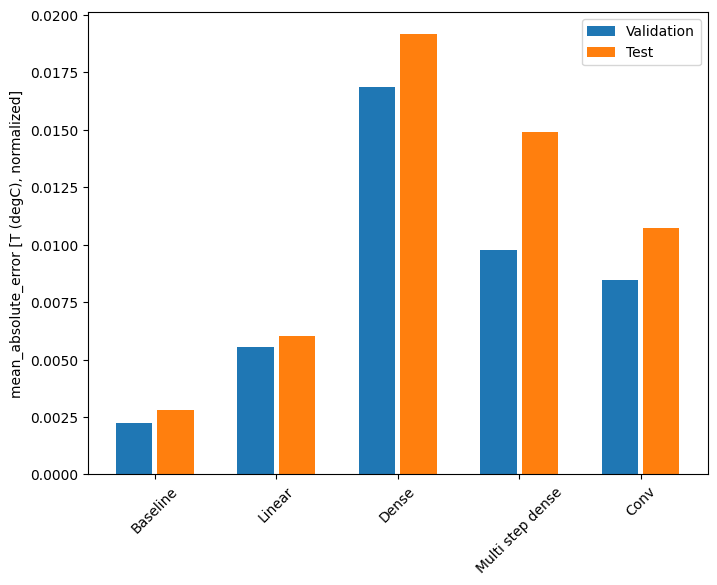

In [ ]:
x = np.arange(len(performance))
width = 0.3
metric_name = 'mean_absolute_error'
val_mae = [v[metric_name] for v in val_performance.values()]
test_mae = [v[metric_name] for v in performance.values()]

plt.ylabel('mean_absolute_error [T (degC), normalized]')
plt.bar(x - 0.17, val_mae, width, label='Validation')
plt.bar(x + 0.17, test_mae, width, label='Test')
plt.xticks(ticks=x, labels=performance.keys(),
           rotation=45)
_ = plt.legend()

In [ ]:
for name, value in performance.items():
  print(f'{name:12s}: {value[metric_name]:0.4f}')

Baseline    : 0.0028
Linear      : 0.0060
Dense       : 0.0192
Multi step dense: 0.0149
Conv        : 0.0107


# 4. Data Quality Report

a. **API Enpoints Called & Data Cleaning & Pre-processing**
* Convert to datatime
* Combine datasets to identify ('site_id' check merge)
* Clean (normalise) the data.
* Address missing values
* Check data types
* Locate/ fix dataset-specific issues

<br>

**Datasets** (+2 million records)
soil-sensor-readings-historical-data with 2400683 records
soil-sensor-locations with 90 records
microclimate-sensor-readings with 56 records
microlabs-co2-sensor-data with 207523 records
microclimate-sensor-locations with 16 records

<br>

**LOCF** (Last Observation Carried Forward) & Interquartile range (IQR) outliers
Correlation Heatmap (Volumetric Water content, temperature and salinity).
Explored time series/ trends for all data (including over 70 different types of soil data).
**Folium** library to map sensor locations
**User Interfaces** & merged datasets into single using datetime
** Normalisation & Descriptive statistics** temperature, humidity, light, vdd, co2 and soil value (30cm)

<br>

**PCA Principal Component Analysis** Soil moisture measurements at different depths. Pearson and Spearman Correlations: show a weak but statistically significant relationship between temperature and Co2 levels.
**Granger Causality Test** Temperature was found to be a significant predictor of soil value, humidity, light. *Co2 predicts motion and vdd*.

<br>

b. **Integrated Data Dashboard** Soil type, Depth, Measure and overlay for temperature, Co2, humidity, light, vdd.

<br>
c. **Linear Regression Model** makes a set of independent predictions on consecutive time steps.
**Fast Fourier Transformer (FFT)** test confirmed temperature was a predictor (normally used for sound/ wave lengths but can be used for temperature variance metrics).
**Violin plots** to see distributions of normalisations.
Predictions based on a *window of consecutive samples* from the data
Used Tensorflow model *tf.keras model* which has built in functions for deep learning models and useful for making time predicitons.
Created a base model to predict the next value in the time series data (input window)
Created a linear model and examined ‘single step and wide/ spread window predictions’.
Tested Dense, multi-step and convolution layer models, **however linear regression with weights based on temperature outperformed other models**. Linear model showed high accuracy and consistency across predictions y (0.63 ~ base model) with non significant diviations of 0.01 predictions.